# **Intro M2**
In this notebook I set up semi-supervised VAE to predict cell type proportions from bulk data.
This is the M2 model structure.
This is almost identical to "[DIVA: DOMAIN INVARIANT VARIATIONAL AUTOENCODERS](https://arxiv.org/pdf/1905.10427.pdf)".
To breifly describe the model, we have 3 independent encoders that encode for different sources of variation: cell-type proportion, sample-id, and everything else (slack).
To enforce this disentanglement, there are classification losses on the cell-type and smaple_id embeddings.
The embeddings are then concatenated together and used as input to a joint decoder.
When used in the no label is available for the cell-type proportion, the output of the classifier is used as the latent code.
When it is available, it is directly input into the latent code.
The model is depicted below, except there is an additional latent subspace for predicting the perturbation status.
This latent subspace is structured in the same was as the encoder for sample_id.



The experimental set-up is as follows:
All data is from Kang dataset.
We generate pesudobulks from the original data, which contains 8 samples and 1 stimulated and one ctrl condition per sample.
We either perturb all cells, a single cell-type, or no cell types. 
This is done when we generate the pseudobulks by sampling from either perturbed or non-perturbed cells within each sample.
This is denoted in the parameter `exp_id`, it can be "all-kang", "mono-kang", "b-kang", "cd4Naive-kang", or "none-kang"
This is like a perturbation that would cause one cell type to change.
We use 2 samples as the "labeled" data (meaning each sample has a ground truth cell-type proportion and it is from the cell-type proportion) and 6 samples with unlabeled data (ground truth proportions are not used in training.)




This code was based off of DIVA's codebase: https://github.com/AMLab-Amsterdam/DIVA

Semi-supervised training method was take from here:
And this tutorial: https://github.com/bjlkeng/sandbox/tree/master/notebooks/vae-semi_supervised_learning with an awesome accomanying blogpost: https://bjlkeng.github.io/posts/semi-supervised-learning-with-variational-autoencoders/

Another codebase referenced: https://github.com/saemundsson/semisupervised_vae


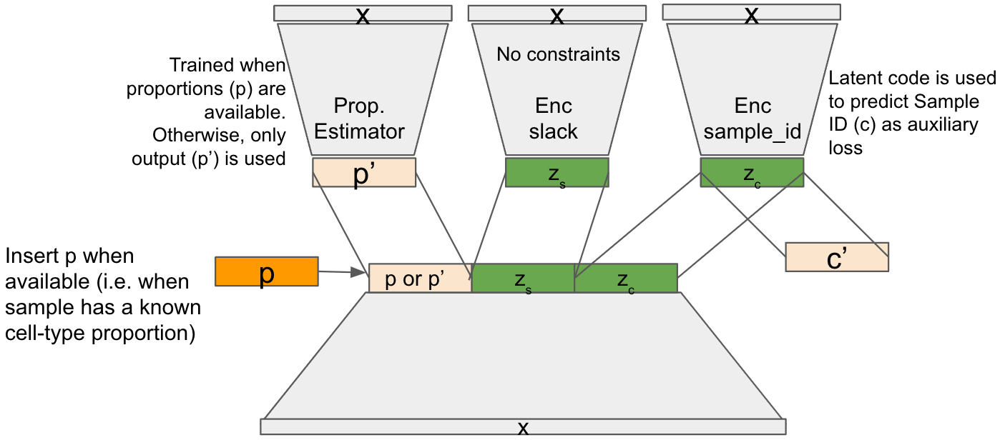

# **Imports**

In [496]:
# general imports
import scanpy as sc

import warnings
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda, Flatten, Softmax, ReLU, ELU, LeakyReLU
from tensorflow.keras.layers import concatenate as concat
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mean_absolute_error, mean_squared_error, KLDivergence
from tensorflow.keras.datasets import mnist
from tensorflow.keras.activations import relu, linear
from tensorflow.keras.utils import to_categorical, normalize, plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers.legacy import Adam
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import spearmanr, pearsonr, ttest_ind, wilcoxon
from scipy.spatial.distance import euclidean
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score
from PIL import Image

from tqdm import tnrange, tqdm_notebook
import ipywidgets

# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# import the SC_preprocessing code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from sc_preprocessing import sc_preprocess
from method_comparison import validation_plotting as vp


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [497]:
from importlib import reload  # Python 3.4+
reload(sc_preprocess)
reload(vp)

<module 'method_comparison.validation_plotting' from '/beevol/home/davidson/checkouts/sc_bulk_ood/exploratory_experiments/../method_comparison/validation_plotting.py'>

In [498]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_liver_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/liver_sex/"
reference_data_path = f"{os.getcwd()}/../data/reference_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_liver/"

de_genes_path = f"{os.getcwd()}/../data/single_cell_data/liver_sex/de_pseudobulk_results.pkl"
de_bulk_path = f"{os.getcwd()}/../data/bulk_data/liver_sex/de_real_bulk_results.pkl"


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_liver/"


cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_liver/" +
                        "CIBERSORTx_Job20_all-liver_0_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job20_all-liver_0_cybersort_sig_inferred_refsample.bm.K999.txt")


num_genes = 7000

exp_id = "all-liver"

# Set-up experimental variables

In [499]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of patients/domains/samples expected
n_tot_samples = 51 # 3 "patients", old / young

# number of drugs (one-hot encoded)
n_drugs = 2

# number of types of sequencing (one-hot encoded)
n_bulk = 2

# experiment id
lab_file_name = exp_id


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [500]:
# get the info for CIBERSORT
#pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_liver_pseudobulk_file(sc_aug_data_path, "1-M-63", "CTRL", "Train", exp_id)
#pseudobulks_df.columns = gene_df

# now we transpose
#pseudobulks_df = pseudobulks_df.transpose()
#pseudobulks_df.columns = range(pseudobulks_df.shape[1])

# now write it out
#sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)


In [501]:
in_name = "liver_bulk_processed"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)


# now get the sc ref training data

# read in male first
sample_order = ['30-M-5']

X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_liver_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

# now read in female
sample_order = ['18-F-51']
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_liver_pseudobulk_file(sc_aug_data_path, curr_samp, "STIM", "Test", exp_id)
    pseudobulks_df.columns = gene_df

    X_concat = pd.concat([X_concat, pseudobulks_df])
    Y_concat = pd.concat([Y_concat, prop_df])
    meta_concat = pd.concat([meta_concat, metadata_df])



# read in the bulk data
real_bulk_df = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# get the bulk metadata formatted
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)


# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(15)]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])


# format the bulk data
real_bulk_df = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])



30-M-5
18-F-51


<ipython-input-501-87ecae84aa3b>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["isTraining"] = "Train"
<ipython-input-501-87ecae84aa3b>:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["cell_prop_type"] = "realistic"
<ipython-input-501-87ecae84aa3b>:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

In [502]:
meta_df.sample_id.value_counts()

30-M-5      1800
18-F-51     1800
Liver_5        1
Liver_2        1
Liver_40       1
Liver_12       1
Liver_47       1
Liver_22       1
Liver_29       1
Liver_48       1
Liver_23       1
Liver_17       1
Liver_4        1
Liver_24       1
Liver_1        1
Liver_18       1
Liver_19       1
Liver_21       1
Liver_38       1
Liver_42       1
Liver_3        1
Liver_20       1
Liver_16       1
Liver_7        1
Liver_35       1
Liver_50       1
Liver_49       1
Liver_10       1
Liver_52       1
Liver_56       1
Liver_46       1
Liver_8        1
Liver_14       1
Liver_9        1
Liver_39       1
Liver_32       1
Liver_25       1
Liver_26       1
Liver_6        1
Liver_13       1
Liver_27       1
Liver_45       1
Liver_11       1
Liver_28       1
Liver_43       1
Liver_44       1
Liver_33       1
Liver_36       1
Liver_53       1
Liver_34       1
Liver_31       1
Name: sample_id, dtype: int64

In [503]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type
0,30-M-5,CTRL,Train,random,sc_ref
1,30-M-5,CTRL,Train,random,sc_ref
2,30-M-5,CTRL,Train,random,sc_ref
3,30-M-5,CTRL,Train,random,sc_ref
4,30-M-5,CTRL,Train,random,sc_ref
...,...,...,...,...,...
Liver_7,Liver_7,CTRL,Train,realistic,bulk
Liver_35,Liver_35,CTRL,Train,realistic,bulk
Liver_2,Liver_2,STIM,Train,realistic,bulk
Liver_5,Liver_5,CTRL,Train,realistic,bulk


In [504]:
X_full

,0610005C13Rik,0610009B22Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012G03Rik,0610030E20Rik,0610031O16Rik,0610037L13Rik,0610038B21Rik,...,Zwilch,Zwint,Zxda,Zxdb,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,a
0,6047.907525,4134.916788,372.671291,1737.917580,3408.176617,4110.739647,3178.397577,2000.0,2387.126801,0.0,...,800.846287,2200.174370,1141.391685,520.017441,1514.499781,1641.745132,4259.635780,1316.325348,2062.169431,176.635544
0,12987.280974,6515.786985,17.639121,4150.375243,4232.554199,7251.961929,3527.675559,4160.0,3292.679268,0.0,...,62.984648,4018.892753,2004.114666,37.522152,454.852059,3353.520988,2306.647390,2262.749232,1775.386851,10.000000
0,270.810459,2209.645772,241.347443,4116.407246,4945.301774,7056.401790,3814.167656,40.0,3036.550090,0.0,...,1001.736847,4456.584244,2779.807490,834.926147,728.390063,4966.274541,4690.450118,2907.654088,2833.296454,66.181587
0,155.990246,2159.072587,169.754898,3727.744431,5370.642942,7444.484685,5105.519395,0.0,3750.567534,0.0,...,160.000000,5581.923125,3678.350227,396.567017,566.043193,4887.758517,4609.131461,4309.240465,2007.782786,58.544762
0,2625.558681,2233.476990,329.807413,834.081204,4126.827026,3266.971972,3228.913869,750.0,2353.041673,0.0,...,451.377766,1835.467204,1316.400112,844.263931,2154.890683,2026.943275,4686.389161,2397.999028,1919.983574,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liver_7,7.000000,56.000000,19.000000,221.000000,111.000000,183.000000,107.000000,14.0,446.000000,7.0,...,94.000000,625.000000,0.000000,62.000000,369.000000,379.000000,2161.000000,818.000000,921.000000,1.000000
Liver_35,3098.000000,258.000000,2.000000,436.000000,17.000000,512.000000,145.000000,920.0,302.000000,0.0,...,19.000000,1567.000000,0.000000,36.000000,432.000000,682.000000,931.000000,544.000000,625.000000,4.000000
Liver_2,0.000000,4.000000,0.000000,28.000000,6.000000,4.000000,8.000000,3.0,62.000000,2.0,...,2.000000,13.000000,0.000000,3.000000,24.000000,18.000000,35.000000,64.000000,62.000000,0.000000
Liver_5,6.000000,52.000000,7.000000,43.000000,11.000000,80.000000,13.000000,0.0,69.000000,0.0,...,1.000000,68.000000,0.000000,11.000000,30.000000,64.000000,180.000000,97.000000,77.000000,0.000000


In [505]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)



# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))
idx_top = np.argpartition(X_CoV, -6680)[-6680:] # num_genes # 6679
gene_df = gene_df.iloc[idx_top]


In [506]:
np.unique(Bulk_full,  return_counts=True)

(array([0, 1]), array([  49, 3600]))

In [507]:
tab = meta_df.groupby(['samp_type', 'sample_id']).size()
tab.unstack()

sample_id,18-F-51,30-M-5,Liver_1,Liver_10,Liver_11,Liver_12,Liver_13,Liver_14,Liver_16,Liver_17,...,Liver_49,Liver_5,Liver_50,Liver_52,Liver_53,Liver_56,Liver_6,Liver_7,Liver_8,Liver_9
samp_type,,,,,,,,,,,,,,,,,,,,,
bulk,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sc_ref,1800.0,1800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [508]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Test,NaN,1800.0
Train,49.0,1800.0


In [509]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,1835,14


In [510]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,49,1800


In [511]:
X_train_df

,0610005C13Rik,0610009B22Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012G03Rik,0610030E20Rik,0610031O16Rik,0610037L13Rik,0610038B21Rik,...,Zwilch,Zwint,Zxda,Zxdb,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,a
0,6047.907525,4134.916788,372.671291,1737.917580,3408.176617,4110.739647,3178.397577,2000.0,2387.126801,0.0,...,800.846287,2200.174370,1141.391685,520.017441,1514.499781,1641.745132,4259.635780,1316.325348,2062.169431,176.635544
0,12987.280974,6515.786985,17.639121,4150.375243,4232.554199,7251.961929,3527.675559,4160.0,3292.679268,0.0,...,62.984648,4018.892753,2004.114666,37.522152,454.852059,3353.520988,2306.647390,2262.749232,1775.386851,10.000000
0,270.810459,2209.645772,241.347443,4116.407246,4945.301774,7056.401790,3814.167656,40.0,3036.550090,0.0,...,1001.736847,4456.584244,2779.807490,834.926147,728.390063,4966.274541,4690.450118,2907.654088,2833.296454,66.181587
0,155.990246,2159.072587,169.754898,3727.744431,5370.642942,7444.484685,5105.519395,0.0,3750.567534,0.0,...,160.000000,5581.923125,3678.350227,396.567017,566.043193,4887.758517,4609.131461,4309.240465,2007.782786,58.544762
0,2625.558681,2233.476990,329.807413,834.081204,4126.827026,3266.971972,3228.913869,750.0,2353.041673,0.0,...,451.377766,1835.467204,1316.400112,844.263931,2154.890683,2026.943275,4686.389161,2397.999028,1919.983574,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liver_7,7.000000,56.000000,19.000000,221.000000,111.000000,183.000000,107.000000,14.0,446.000000,7.0,...,94.000000,625.000000,0.000000,62.000000,369.000000,379.000000,2161.000000,818.000000,921.000000,1.000000
Liver_35,3098.000000,258.000000,2.000000,436.000000,17.000000,512.000000,145.000000,920.0,302.000000,0.0,...,19.000000,1567.000000,0.000000,36.000000,432.000000,682.000000,931.000000,544.000000,625.000000,4.000000
Liver_2,0.000000,4.000000,0.000000,28.000000,6.000000,4.000000,8.000000,3.0,62.000000,2.0,...,2.000000,13.000000,0.000000,3.000000,24.000000,18.000000,35.000000,64.000000,62.000000,0.000000
Liver_5,6.000000,52.000000,7.000000,43.000000,11.000000,80.000000,13.000000,0.0,69.000000,0.0,...,1.000000,68.000000,0.000000,11.000000,30.000000,64.000000,180.000000,97.000000,77.000000,0.000000


In [512]:
X_train

array([[6.04790753e+03, 4.13491679e+03, 3.72671291e+02, ...,
        1.31632535e+03, 2.06216943e+03, 1.76635544e+02],
       [1.29872810e+04, 6.51578699e+03, 1.76391206e+01, ...,
        2.26274923e+03, 1.77538685e+03, 1.00000000e+01],
       [2.70810459e+02, 2.20964577e+03, 2.41347443e+02, ...,
        2.90765409e+03, 2.83329645e+03, 6.61815872e+01],
       ...,
       [0.00000000e+00, 4.00000000e+00, 0.00000000e+00, ...,
        6.40000000e+01, 6.20000000e+01, 0.00000000e+00],
       [6.00000000e+00, 5.20000000e+01, 7.00000000e+00, ...,
        9.70000000e+01, 7.70000000e+01, 0.00000000e+00],
       [3.24600000e+03, 3.13000000e+02, 2.20000000e+01, ...,
        5.65000000e+02, 4.04000000e+02, 1.00000000e+00]])

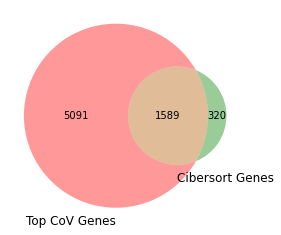

In [513]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [514]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

In [515]:
def pearsonr_2D(x, y):
    """computes pearson correlation coefficient
       where x is a 1D and y a 2D array"""

    upper = np.sum((x - np.mean(x)) * (y - np.mean(y, axis=1)[:,None]), axis=1)
    lower = np.sqrt(np.sum(np.power(x - np.mean(x), 2)) * np.sum(np.power(y - np.mean(y, axis=1)[:,None], 2), axis=1))
    
    rho = upper / lower
    
    return rho

In [516]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()
meta_kp = meta_df.iloc[idx_sc_train]


In [517]:
meta_kp["weight"] = 1

meta_kp.weight.iloc[np.where(meta_kp.Y_max == "hepatic_stellate")] = 0.9
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "hepatic_sinusoid")] = 0.85
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "b_cell")] = 0.99
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "kupffer")] = 0.94
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "NK")] = 0.99
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "hepatocyte")] = 0.35
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "myeloid_leukocyte")] = 0.99
meta_kp.weight.iloc[np.where(meta_kp.Y_max == "plasmacytoid_dendritic_cell")] = 0.99


<ipython-input-517-d27ab0a8e78f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_kp["weight"] = 1
<ipython-input-517-d27ab0a8e78f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_kp.weight.iloc[np.where(meta_kp.Y_max == "hepatic_stellate")] = 0.9
<ipython-input-517-d27ab0a8e78f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_kp.weight.iloc[np.where(meta_kp.Y_ma

In [518]:
meta_kp

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max,weight
0,30-M-5,CTRL,Train,random,sc_ref,myeloid_leukocyte,0.99
1,30-M-5,CTRL,Train,random,sc_ref,hepatocyte,0.35
2,30-M-5,CTRL,Train,random,sc_ref,hepatic_stellate,0.90
3,30-M-5,CTRL,Train,random,sc_ref,hepatic_stellate,0.90
4,30-M-5,CTRL,Train,random,sc_ref,NK,0.99
...,...,...,...,...,...,...,...
1795,30-M-5,CTRL,Train,cell_type_specific,sc_ref,myeloid_leukocyte,0.99
1796,30-M-5,CTRL,Train,cell_type_specific,sc_ref,myeloid_leukocyte,0.99
1797,30-M-5,CTRL,Train,cell_type_specific,sc_ref,myeloid_leukocyte,0.99
1798,30-M-5,CTRL,Train,cell_type_specific,sc_ref,myeloid_leukocyte,0.99


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3649 samples in 0.015s...
[t-SNE] Computed neighbors for 3649 samples in 1.157s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3649
[t-SNE] Computed conditional probabilities for sample 2000 / 3649
[t-SNE] Computed conditional probabilities for sample 3000 / 3649
[t-SNE] Computed conditional probabilities for sample 3649 / 3649
[t-SNE] Mean sigma: 1.161060
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.939865
[t-SNE] KL divergence after 500 iterations: 0.948739
(3649, 2)
(3649, 2)


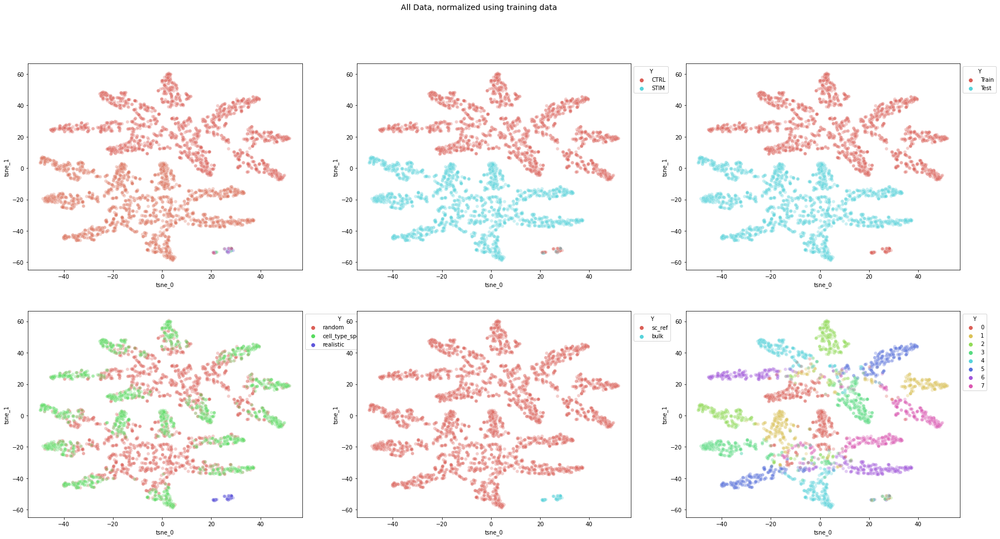

In [519]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(49, 2)
(49, 2)


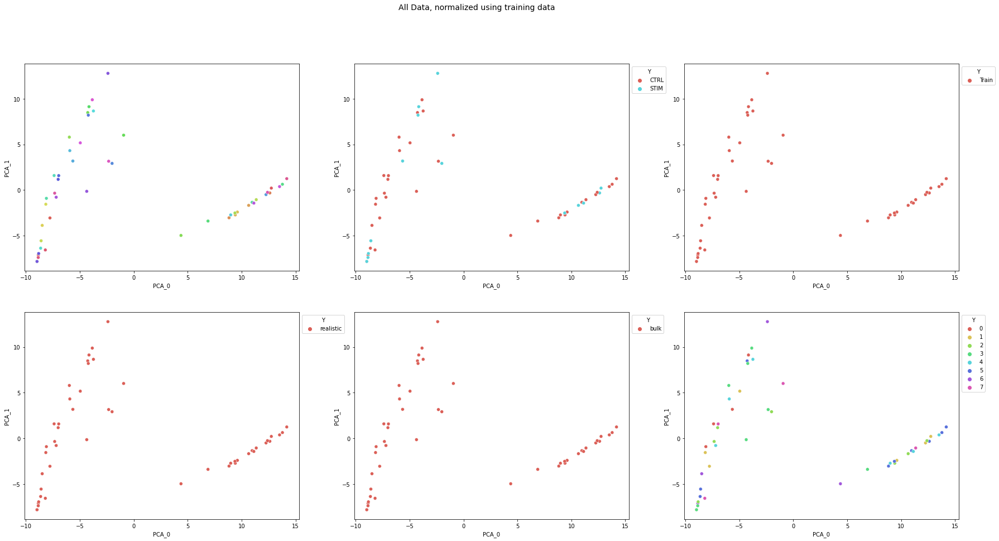

In [520]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 48 nearest neighbors...
[t-SNE] Indexed 49 samples in 0.000s...
[t-SNE] Computed neighbors for 49 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 49 / 49
[t-SNE] Mean sigma: 8.985739
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.260807
[t-SNE] KL divergence after 500 iterations: 0.380324
(49, 2)
(49, 2)


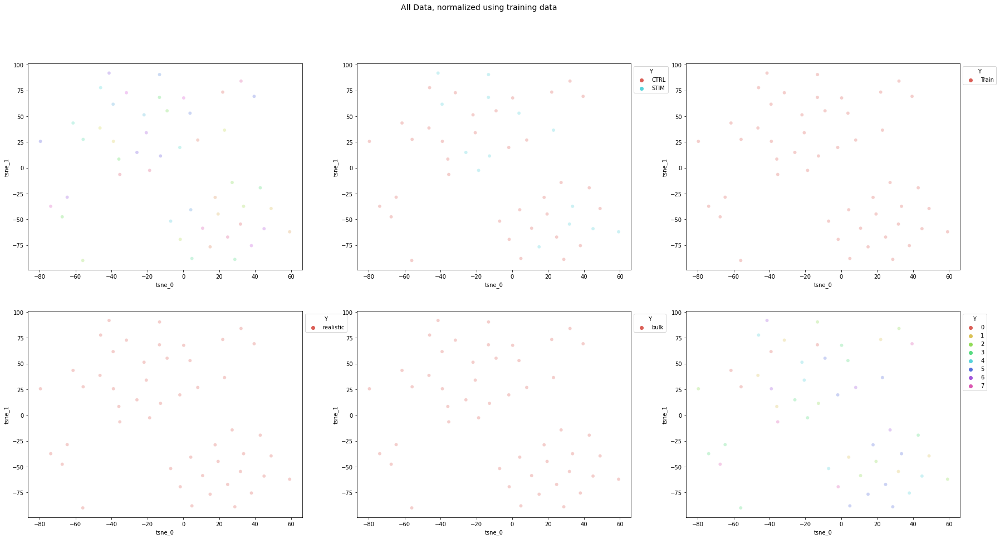

In [521]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **M2 Model Definition**

## Hyperparameters

In [522]:

##################################################
#####. Hyperparameters
##################################################

batch_size = 500
n_epoch = 200 #100 500 

alpha_rot = 100 #100000
alpha_drug = 100 #10000
alpha_bulk = 100 #10000
alpha_prop = 100 #100

beta_kl_slack = 0.1 # 10 ###
beta_kl_rot = 100 # 100 ###
beta_kl_drug = 100 # 100 ###
beta_kl_bulk = 100 # 100 ###


n_x = X_full.shape[1]
n_y = Y_full.shape[1]
n_label = n_tot_samples  # 8 donors 
n_drugs = n_drugs  # number of drugs one-hot encoded
n_bulk = n_bulk  # number of drugs one-hot encoded
n_label_z = 64  # 64 dimensional representation of rotation
n_label_z_sml = 64

# the network dimensions are 784 > 512 > proportion_dim < 512 < 784
n_z = Y_full.shape[1] # latent space size, one latent dimension PER cell type
encoder_dim = 512 # dim of encoder hidden layer 512 
decoder_dim = 512 # dim of encoder hidden layer 512 
decoder_out_dim = n_x # dim of decoder output layer

# labeled classifier
class_dim1 = 512 # 512 
class_dim2 = 256 # 256 


activ = 'relu'
optim = tf.keras.optimizers.legacy.Adam(learning_rate=0.0005) #0.001
print(f"length of X {n_x} and length of y {n_y} n_label {n_label} and n_drugs {n_drugs} and n_bulk {n_bulk}")



length of X 7000 and length of y 8 n_label 51 and n_drugs 2 and n_bulk 2


## Encoder + Y classifier

In [523]:
# declare the Keras tensor we will use as input to the encoder
X = Input(shape=(n_x,))
Y = Input(shape=(n_y,))
label = Input(shape=(n_label,))
props = Input(shape=(n_y,))
z_in = Input(shape=(n_y+n_label_z_sml+n_label_z_sml+n_label_z_sml,))

inputs = X

# set up encoder network
# this is an encoder with 512 hidden layer
# Dense is a functor, with given initializations (activation and hidden layer dimension)
# After initialization, the functor is returned and inputs is used as an arguement
encoder_s = Dense(encoder_dim, activation=activ, name="encoder_slack")(inputs)
encoder_r = Dense(encoder_dim, activation=activ, name="encoder_rot")(inputs)
encoder_d = Dense(encoder_dim, activation=activ, name="encoder_drug")(inputs)
encoder_b = Dense(encoder_dim, activation=activ, name="encoder_bulk")(inputs)

# now from the hidden layer, you get the mu and sigma for 
# the latent space

mu_slack = Dense(n_label_z, activation='linear', name = "mu_slack")(encoder_s)
l_sigma_slack = Dense(n_label_z, activation='linear', name = "sigma_slack")(encoder_s)

mu_rot = Dense(n_label_z_sml, activation='linear', name = "mu_rot")(encoder_r)
l_sigma_rot = Dense(n_label_z_sml, activation='linear', name = "sigma_rot")(encoder_r)


mu_drug = Dense(n_label_z_sml, activation='linear', name = "mu_drug")(encoder_d)
l_sigma_drug = Dense(n_label_z_sml, activation='linear', name = "sigma_drug")(encoder_d)


mu_bulk = Dense(n_label_z_sml, activation='linear', name = "mu_bulk")(encoder_b)
l_sigma_bulk = Dense(n_label_z_sml, activation='linear', name = "sigma_bulk")(encoder_b)



# set up labeled classifier
#defining the architecture of the classifier

class_hidden1 = Dense(class_dim1, activation=activ, name = "cls_h1")
class_hidden2 = Dense(class_dim2, activation=activ, name="cls_h2")
class_out = Dense(n_y, activation='softmax', name="cls_out")

#x_concat_lab = tf.keras.layers.concatenate([inputs, label])
#classifier_h1 = class_hidden1(tf.keras.layers.Concatenate()([inputs, label]))
classifier_h1 = class_hidden1(inputs)
classifier_h2 = class_hidden2(classifier_h1)
Y_cls = class_out(classifier_h2)



## Latent Space

In [524]:
# now we need the sampler from mu and sigma
def sample_z(args):
    mu, l_sigma, n_z = args
    eps = K.random_normal(shape=(batch_size, n_z), mean=0., stddev=1.)
    return mu + K.exp(l_sigma / 2) * eps


# Sampling latent space
z_slack = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_slack")([mu_slack, l_sigma_slack, n_label_z])
z_rot = Lambda(sample_z, output_shape = (n_label_z_sml, ), name="z_samp_rot")([mu_rot, l_sigma_rot, n_label_z_sml])
z_drug = Lambda(sample_z, output_shape = (n_label_z_sml, ), name="z_samp_drug")([mu_drug, l_sigma_drug, n_label_z_sml])
z_bulk = Lambda(sample_z, output_shape = (n_label_z_sml, ), name="z_samp_bulk")([mu_bulk, l_sigma_bulk, n_label_z_sml])

z_concat_lab = concat([z_slack, Y, z_rot, z_drug, z_bulk])
z_concat_unlab = concat([z_slack, Y_cls, z_rot, z_drug, z_bulk])

## Decoder + Classifiers

In [525]:
def null_f(args):
    return args

###### DECODER
# set up decoder network
# this is a decoder with 512 hidden layer
decoder_hidden = Dense(decoder_dim, activation=activ, name = "decoder_h1")

# final reconstruction
decoder_out = Dense(decoder_out_dim, activation='sigmoid', name = "decoder_out")

d_in = Input(shape=(n_label_z+n_y+n_label_z_sml+n_label_z_sml+n_label_z_sml,))
d_h1 = decoder_hidden(d_in)
d_out = decoder_out(d_h1)

# set up the decoder part that links to the encoder
# labeled decoder
h_lab = decoder_hidden(z_concat_lab)
outputs_lab = decoder_out(h_lab)

# unlabeled decoder
h_unlab = decoder_hidden(z_concat_unlab)
outputs_unlab = decoder_out(h_unlab)


###### Rotations classifier
# this is the rotation we try to estimate
rot_h1 = ReLU(name = "rot_h1")
rot_h2 = Dense(n_label, activation='linear', name = "rot_h2")
rot_softmax = Softmax(name = "mu_rot_pred")
decoder_sigma_r = Lambda(null_f, name = "l_sigma_rot_pred")


rot_1_out = rot_h1(z_rot)
rot_2_out = rot_h2(rot_1_out)
rotation_outputs = rot_softmax(rot_2_out)
sigma_outputs_r = decoder_sigma_r(l_sigma_rot)



###### Drug classifier
# this is the drug we try to estimate
drug_h1 = ReLU(name = "drug_h1")
drug_h2 = Dense(n_drugs, activation='linear', name = "drug_h2")
drug_softmax = Softmax(name = "mu_drug_pred")
decoder_sigma_d = Lambda(null_f, name = "l_sigma_drug_pred")


drug_1_out = drug_h1(z_drug)
drug_2_out = drug_h2(drug_1_out)
drug_outputs = drug_softmax(drug_2_out)
sigma_outputs_d = decoder_sigma_d(l_sigma_drug)


###### Bulk classifier
# this is the bulk or sc we try to estimate
bulk_h1 = ReLU(name = "bulk_h1")
bulk_h2 = Dense(n_bulk, activation='linear', name = "bulk_h2")
bulk_softmax = Softmax(name = "mu_bulk_pred")
decoder_sigma_d = Lambda(null_f, name = "l_sigma_bulk_pred")


bulk_1_out = bulk_h1(z_bulk)
bulk_2_out = bulk_h2(bulk_1_out)
bulk_outputs = bulk_softmax(bulk_2_out)
sigma_outputs_d = decoder_sigma_d(l_sigma_bulk)








## Loss

In [526]:

def vae_loss(y_true, y_pred):
    recon = K.sum(mean_squared_error(y_true, y_pred), axis=-1)
    kl_rot = beta_kl_rot * K.sum(K.exp(l_sigma_rot) + K.square(mu_rot) - 1. - l_sigma_rot, axis=-1)
    kl_drug = beta_kl_drug * K.sum(K.exp(l_sigma_drug) + K.square(mu_drug) - 1. - l_sigma_drug, axis=-1)
    kl_bulk = beta_kl_bulk * K.sum(K.exp(l_sigma_bulk) + K.square(mu_bulk) - 1. - l_sigma_bulk, axis=-1)
    kl_slack = beta_kl_slack * K.sum(K.exp(l_sigma_slack) + K.square(mu_slack) - 1. - l_sigma_slack, axis=-1)
    return recon + kl_rot +kl_drug + kl_bulk+ kl_slack


def recon_loss(y_true, y_pred):
	return K.sum(mean_squared_error(y_true, y_pred), axis=-1)


def prop_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_prop

def drug_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_drug

def bulk_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_bulk


def class_loss(y_true, y_pred):
    recon = K.sum(K.binary_crossentropy(y_true, y_pred), axis=-1)*alpha_rot
    return recon



## Make the computational graph

In [527]:
classifier = Model(X, Y_cls)

known_prop_vae = Model([X, Y], [outputs_lab, Y_cls, rotation_outputs, drug_outputs, bulk_outputs])
unknown_prop_vae = Model(X, [outputs_unlab, rotation_outputs, drug_outputs, bulk_outputs])

known_prop_vae.compile(optimizer=optim, loss=[vae_loss, prop_loss, class_loss, drug_loss, bulk_loss]) #, metrics = [KL_loss, recon_loss])
unknown_prop_vae.compile(optimizer=optim, loss=[vae_loss, class_loss, drug_loss, bulk_loss]) #, metrics = [KL_loss, recon_loss])

encoder_unlab = Model(X, [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk])

encoder_lab = Model([X, Y], [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk])


decoder = Model(d_in, d_out)


print(known_prop_vae.summary())
print(unknown_prop_vae.summary())


Model: "model_31"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_31 (InputLayer)          [(None, 7000)]       0           []                               
                                                                                                  
 encoder_slack (Dense)          (None, 512)          3584512     ['input_31[0][0]']               
                                                                                                  
 encoder_rot (Dense)            (None, 512)          3584512     ['input_31[0][0]']               
                                                                                                  
 encoder_drug (Dense)           (None, 512)          3584512     ['input_31[0][0]']               
                                                                                           

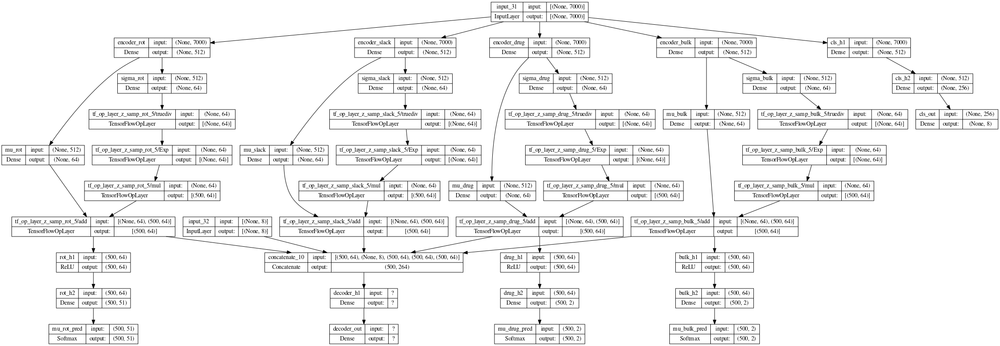

In [528]:
display(plot_model(known_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

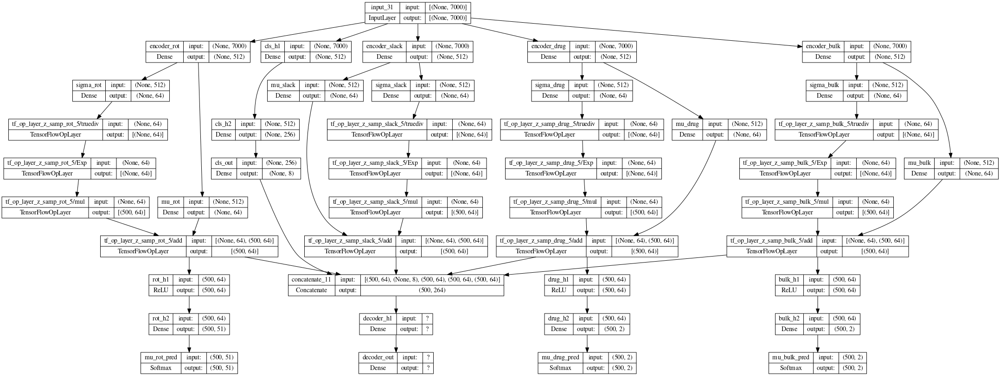

In [529]:
display(plot_model(unknown_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

# **Training**

Here we train using both the known and unknown cell-type proportions.
The labeled data is repeated in order to match the dimension of the unlabeled data so that they have the same batch size.
This code is taken from https://github.com/bjlkeng/sandbox/blob/master/notebooks/vae-semi_supervised_learning/vae-m2-fit-mnist.ipynb

In [530]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

def fit_model(X_unknown_prop, label_unknown_prop, drug_unknown_prop, bulk_unknown_prop, X_known_prop, Y_known_prop, label_known_prop, drug_known_prop, bulk_known_prop, epochs):
    assert np.maximum(len(X_unknown_prop), len(X_known_prop)) > batch_size, \
            ("batch size is too big", len(X_unknown_prop), batch_size, len(X_known_prop))
    start = time.time()
    history = []
    history_val = []
    meta_hist = []

    # make test train split
    unkp_idx_train = np.random.choice(range(X_unknown_prop.shape[0]), np.ceil(X_unknown_prop.shape[0]*0.8).astype(int), replace=False)
    kp_idx_train = np.random.choice(range(X_known_prop.shape[0]), np.ceil(X_known_prop.shape[0]*0.8).astype(int), replace=False)

    unkp_idx_test = np.setdiff1d(range(X_unknown_prop.shape[0]), unkp_idx_train)
    kp_idx_test = np.setdiff1d(range(X_known_prop.shape[0]), kp_idx_train)

    # now we need to make the known and unknown samples the same size
    # and a size compatible with the batch size
    train_size_samp = np.maximum(len(unkp_idx_train), len(kp_idx_train))
    train_size_samp_batch = np.ceil(train_size_samp/batch_size)
    train_size_samp = batch_size*train_size_samp_batch
    train_size_samp = train_size_samp.astype(int)

    test_size_samp = np.maximum(len(unkp_idx_test), len(kp_idx_test))
    if test_size_samp < batch_size:
        test_size_samp = batch_size
    else:
        test_size_samp_batch = np.ceil(test_size_samp/batch_size)
        test_size_samp = batch_size*test_size_samp_batch
        test_size_samp = test_size_samp.astype(int)

    print(f"test_size_samp: {test_size_samp}")
    print(f"train_size_samp: {train_size_samp}")

    unkp_idx_train = np.random.choice(unkp_idx_train, train_size_samp, replace=True)
    kp_idx_train = np.random.choice(kp_idx_train, train_size_samp, replace=True)
    unkp_idx_test = np.random.choice(unkp_idx_test, test_size_samp, replace=True)
    kp_idx_test = np.random.choice(kp_idx_test, test_size_samp, replace=True)

    X_unknown_prop_test = X_unknown_prop[unkp_idx_test]
    label_unknown_prop_test = label_unknown_prop[unkp_idx_test]
    drug_unknown_prop_test = drug_unknown_prop[unkp_idx_test]
    bulk_unknown_prop_test = bulk_unknown_prop[unkp_idx_test]
    X_known_prop_test = X_known_prop[kp_idx_test]
    Y_known_prop_test = Y_known_prop[kp_idx_test]
    label_known_prop_test = label_known_prop[kp_idx_test]
    drug_known_prop_test = drug_known_prop[kp_idx_test]
    bulk_known_prop_test = bulk_known_prop[kp_idx_test]


    X_unknown_prop = X_unknown_prop[unkp_idx_train]
    label_unknown_prop = label_unknown_prop[unkp_idx_train]
    drug_unknown_prop = drug_unknown_prop[unkp_idx_train]
    bulk_unknown_prop = bulk_unknown_prop[unkp_idx_train]
    X_known_prop = X_known_prop[kp_idx_train]
    Y_known_prop = Y_known_prop[kp_idx_train]
    label_known_prop = label_known_prop[kp_idx_train]
    drug_known_prop = drug_known_prop[kp_idx_train]
    bulk_known_prop = bulk_known_prop[kp_idx_train]



    early_exit = False

    for epoch in range(epochs):

        if early_exit:
            break


        unlabeled_index = np.arange(len(X_unknown_prop))
        np.random.shuffle(unlabeled_index)

        labeled_index = np.arange(len(X_known_prop))
        np.random.shuffle(labeled_index)

        batches = len(X_unknown_prop) // batch_size
        for i in range(batches):
            # Labeled
            index_range =  labeled_index[i * batch_size:(i+1) * batch_size]
            loss = known_prop_vae.train_on_batch([X_known_prop[index_range], Y_known_prop[index_range]],
                                                    [X_known_prop[index_range], Y_known_prop[index_range], label_known_prop[index_range], drug_known_prop[index_range], bulk_known_prop[index_range]])

            # Unlabeled
            index_range =  unlabeled_index[i * batch_size:(i+1) * batch_size]
            loss += [unknown_prop_vae.train_on_batch(X_unknown_prop[index_range],
                                                        [X_unknown_prop[index_range], label_unknown_prop[index_range], drug_unknown_prop[index_range], bulk_unknown_prop[index_range]])]


            history.append(loss)

            # validation loss
            # Labeled
            loss_val = known_prop_vae.test_on_batch([X_known_prop_test, Y_known_prop_test],
                                                    [X_known_prop_test, Y_known_prop_test, label_known_prop_test, drug_known_prop_test, bulk_known_prop_test])

            # Unlabeled
            loss_val += [unknown_prop_vae.test_on_batch(X_unknown_prop_test,
                                                        [X_unknown_prop_test, label_unknown_prop_test, drug_unknown_prop_test, bulk_unknown_prop_test])]

            history_val.append(loss_val)


            # track spearman corr
            y_true = Y_known_prop_test
            y_est = classifier.predict(X_known_prop_test, batch_size=batch_size)
            spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                            for idx in range(0, y_est.shape[0])]
            meta_hist.append(spr_err)

            meta_median = [np.median(x) for x in meta_hist]

            #if len(meta_median) > 10 and moving_average(meta_median, 10)[::-1][0] > 0.9:
            #    early_exit = True



    done = time.time()
    elapsed = done - start
    print("Elapsed: ", elapsed)
    print("Epoch: ", epoch)

    return [history, meta_hist, history_val]

Now train

In [531]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


In [532]:
X_kp.shape

(1800, 7000)

In [533]:
X_unkp.shape

(49, 7000)

In [534]:

loss_history = fit_model(X_unkp,
                    label_unkp,
                    drug_unkp,
                    bulk_unkp,
                    X_kp, 
                    y_kp,
                    label_kp, 
                    drug_kp, 
                    bulk_kp, epochs=100) # n_epoch


test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  339.5678520202637
Epoch:  99


In [535]:
meta_history = loss_history[1]
val_loss_history = loss_history[2]
loss_history = loss_history[0]


# Plot Loss Curves

In [536]:
# write out the loss for later plotting
# unpack the loss values
labeled_total_loss = [item[0] for item in loss_history]
unlabeled_total_loss = [item[6][0] for item in loss_history]

labeled_recon_loss = [item[1] for item in loss_history]
unlabeled_recon_loss = [item[6][1] for item in loss_history]

labeled_prop_loss = [item[2] for item in loss_history]

labeled_samp_loss = [item[3] for item in loss_history]
unlabeled_samp_loss = [item[6][2] for item in loss_history]

labeled_drug_loss = [item[4] for item in loss_history]
unlabeled_drug_loss = [item[6][2] for item in loss_history]


labeled_bulk_loss = [item[5] for item in loss_history]
unlabeled_bulk_loss = [item[6][2] for item in loss_history]


# make into a dataframe
total_loss = labeled_total_loss + unlabeled_total_loss + [a + b for a, b in zip(labeled_total_loss, unlabeled_total_loss)]
loss_df = pd.DataFrame(data=total_loss, columns=['total_loss'])
loss_df['type'] = ["labeled"]*len(loss_history) + ["unlabeled"]*len(loss_history) + ["sum"]*len(loss_history)
loss_df['batch'] = [*range(len(loss_history))] + [*range(len(loss_history))] + [*range(len(loss_history))]

recon_loss = labeled_recon_loss + unlabeled_recon_loss + [a + b for a, b in zip(labeled_recon_loss, unlabeled_recon_loss)]
loss_df['recon_loss'] = recon_loss

prop_loss = labeled_prop_loss + [0]*len(loss_history) + labeled_prop_loss
loss_df['prop_loss'] = prop_loss

samp_loss = labeled_samp_loss + unlabeled_samp_loss + [a + b for a, b in zip(labeled_samp_loss, unlabeled_samp_loss)]
loss_df['samp_loss'] = samp_loss


drug_loss = labeled_drug_loss + unlabeled_drug_loss + [a + b for a, b in zip(labeled_drug_loss, unlabeled_drug_loss)]
loss_df['drug_loss'] = drug_loss


bulk_loss = labeled_bulk_loss + unlabeled_bulk_loss + [a + b for a, b in zip(labeled_bulk_loss, unlabeled_bulk_loss)]
loss_df['bulk_loss'] = bulk_loss



In [537]:
# write out the loss for later plotting
# unpack the loss values
labeled_total_loss = [item[0] for item in val_loss_history]
unlabeled_total_loss = [item[6][0] for item in val_loss_history]

labeled_recon_loss = [item[1] for item in val_loss_history]
unlabeled_recon_loss = [item[6][1] for item in val_loss_history]

labeled_prop_loss = [item[2] for item in val_loss_history]

labeled_samp_loss = [item[3] for item in val_loss_history]
unlabeled_samp_loss = [item[6][2] for item in val_loss_history]

labeled_drug_loss = [item[4] for item in val_loss_history]
unlabeled_drug_loss = [item[6][2] for item in val_loss_history]


labeled_bulk_loss = [item[5] for item in val_loss_history]
unlabeled_bulk_loss = [item[6][2] for item in val_loss_history]


# make into a dataframe
total_loss = labeled_total_loss + unlabeled_total_loss + [a + b for a, b in zip(labeled_total_loss, unlabeled_total_loss)]
val_loss_df = pd.DataFrame(data=total_loss, columns=['total_loss'])
val_loss_df['type'] = ["labeled"]*len(val_loss_history) + ["unlabeled"]*len(val_loss_history) + ["sum"]*len(val_loss_history)
val_loss_df['batch'] = [*range(len(val_loss_history))] + [*range(len(val_loss_history))] + [*range(len(val_loss_history))]

recon_loss = labeled_recon_loss + unlabeled_recon_loss + [a + b for a, b in zip(labeled_recon_loss, unlabeled_recon_loss)]
val_loss_df['recon_loss'] = recon_loss

prop_loss = labeled_prop_loss + [0]*len(val_loss_history) + labeled_prop_loss
val_loss_df['prop_loss'] = prop_loss

samp_loss = labeled_samp_loss + unlabeled_samp_loss + [a + b for a, b in zip(labeled_samp_loss, unlabeled_samp_loss)]
val_loss_df['samp_loss'] = samp_loss
val_loss_df

drug_loss = labeled_drug_loss + unlabeled_drug_loss + [a + b for a, b in zip(labeled_drug_loss, unlabeled_drug_loss)]
val_loss_df['drug_loss'] = drug_loss


bulk_loss = labeled_bulk_loss + unlabeled_bulk_loss + [a + b for a, b in zip(labeled_bulk_loss, unlabeled_bulk_loss)]
val_loss_df['bulk_loss'] = bulk_loss



In [538]:
val_loss_df

,total_loss,type,batch,recon_loss,prop_loss,samp_loss,drug_loss,bulk_loss
0,252385.328125,labeled,0,240282.656250,8476.357422,369.243469,0.002711,3257.056396
1,152822.062500,labeled,1,143738.359375,6458.640137,468.137695,0.019853,2156.900635
2,99795.960938,labeled,2,88612.945312,5310.952637,492.115112,0.729211,5379.217285
3,86026.085938,labeled,3,79481.585938,5519.138672,478.406952,0.951547,546.001282
4,73773.171875,labeled,4,65984.617188,6704.089355,461.934601,2.116035,620.414307
...,...,...,...,...,...,...,...,...
895,24462.853516,sum,295,3984.054199,719.129150,933.495117,1014.407593,1386.185181
896,24485.058594,sum,296,4142.633301,828.534302,932.718750,1012.964355,1165.178955
897,23886.345703,sum,297,3994.605225,692.966919,928.500122,1143.799561,1363.556641
898,22769.488281,sum,298,4123.662598,716.753235,929.362122,923.672729,1553.554688


In [539]:
def read_loss_file(res_path, exp_id, unlab_id):
    loss_file = os.path.join(res_path, f"train-{exp_id}-{unlab_id}-DIVA_loss.pkl")
    loss_path = Path(loss_file)
    loss_df = pickle.load( open( loss_path, "rb" ) )
    return loss_df

def make_loss_fig(loss_df, ax, title, loss_to_plot):
    ## plot loss
    g = sns.lineplot(
        x="batch", y=loss_to_plot,
        data=loss_df,
        hue="type",
        legend="full",
        alpha=0.3, ax= ax
    )
    ax.set_title(title)
    return g

In [540]:

# add the log to make it easier to plot
loss_df["log_total_loss"] = np.log10(loss_df["total_loss"]+1)
loss_df["log_recon_loss"] = np.log10(loss_df["recon_loss"]+1)
loss_df["log_samp_loss"] = np.log10(loss_df["samp_loss"]+1)
loss_df["log_prop_loss"] = np.log10(loss_df["prop_loss"]+1)
loss_df["log_drug_loss"] = np.log10(loss_df["drug_loss"]+1)
loss_df["log_bulk_loss"] = np.log10(loss_df["bulk_loss"]+1)



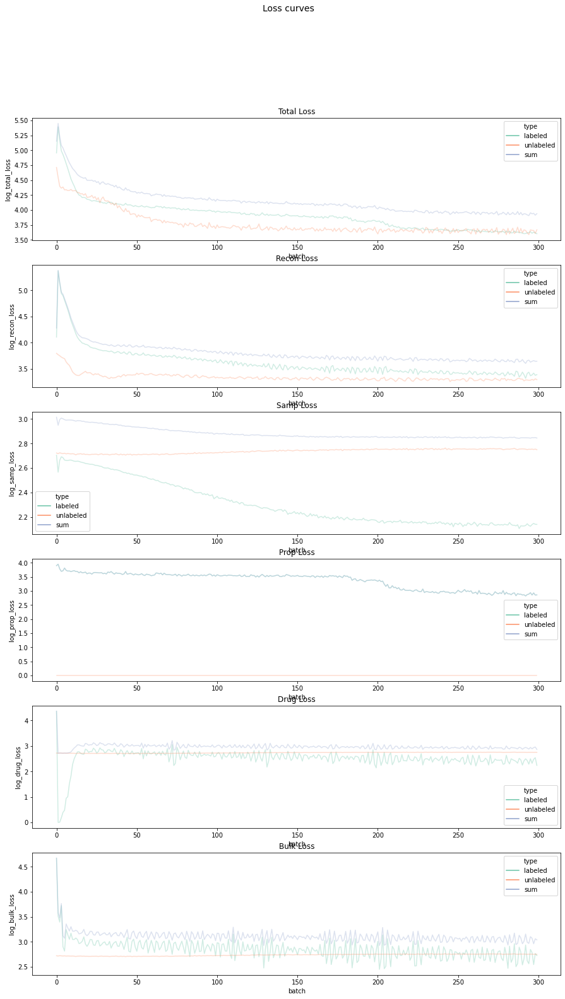

In [541]:

fig, axs = plt.subplots(6, figsize=(15,25))

make_loss_fig(loss_df, ax=axs[0], title=f"Total Loss", loss_to_plot="log_total_loss")
make_loss_fig(loss_df, ax=axs[1], title=f"Recon Loss", loss_to_plot="log_recon_loss")
make_loss_fig(loss_df, ax=axs[2], title=f"Samp Loss", loss_to_plot="log_samp_loss")
make_loss_fig(loss_df, ax=axs[3], title=f"Prop Loss", loss_to_plot="log_prop_loss")
make_loss_fig(loss_df, ax=axs[4], title=f"Drug Loss", loss_to_plot="log_drug_loss")
make_loss_fig(loss_df, ax=axs[5], title=f"Bulk Loss", loss_to_plot="log_bulk_loss")


fig.suptitle("Loss curves", fontsize=14)

fig.show()

In [542]:
loss_df

,total_loss,type,batch,recon_loss,prop_loss,samp_loss,drug_loss,bulk_loss,log_total_loss,log_recon_loss,log_samp_loss,log_prop_loss,log_drug_loss,log_bulk_loss
0,90576.343750,labeled,0,12772.656250,7895.083496,505.287506,22938.291016,46465.023438,4.957020,4.106315,2.704397,3.897412,4.360580,4.667136
1,247888.109375,labeled,1,235354.953125,8923.609375,366.962555,0.003127,3242.582764,5.394258,5.371725,2.565804,3.950589,0.001356,3.511025
2,146428.531250,labeled,2,137439.390625,6053.089844,460.166473,0.023819,2475.848633,5.165629,5.138114,2.663858,3.782049,0.010223,3.393899
3,98055.992188,labeled,3,87322.937500,4960.774902,490.903931,0.522559,5280.854980,4.991478,4.941133,2.691880,3.695637,0.182574,3.722786
4,85643.671875,labeled,4,79161.242188,5197.969238,482.536102,1.469439,800.450684,4.932700,4.898518,2.684429,3.715917,0.392598,2.903877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,9014.566406,sum,295,4240.222656,868.748962,696.755127,879.665649,1267.071533,3.954993,3.627491,2.843703,2.939394,2.944811,3.103144
896,8658.310547,sum,296,4405.208496,714.635742,703.690125,776.114990,1178.043701,3.937483,3.644065,2.847998,2.854692,2.890485,3.071530
897,8818.234375,sum,297,4536.578613,853.826904,702.526123,863.303589,913.770142,3.945431,3.656824,2.847280,2.931878,2.936666,2.961312
898,8214.438477,sum,298,4411.194336,711.290833,704.358093,915.003296,1149.820312,3.914631,3.644655,2.848410,2.852657,2.961897,3.061007


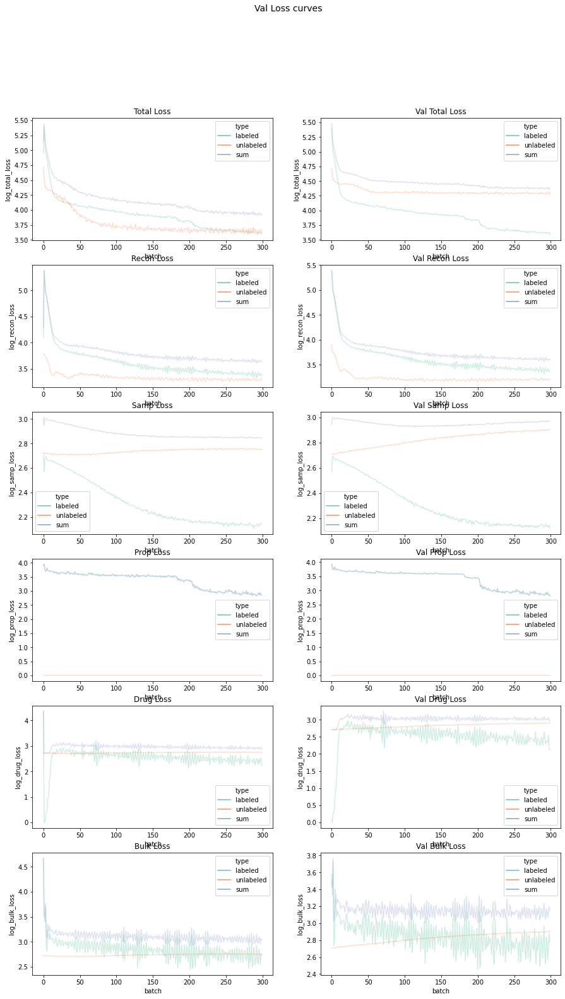

In [543]:

# add the log to make it easier to plot
val_loss_df["log_total_loss"] = np.log10(val_loss_df["total_loss"]+1)
val_loss_df["log_recon_loss"] = np.log10(val_loss_df["recon_loss"]+1)
val_loss_df["log_samp_loss"] = np.log10(val_loss_df["samp_loss"]+1)
val_loss_df["log_prop_loss"] = np.log10(val_loss_df["prop_loss"]+1)
val_loss_df["log_drug_loss"] = np.log10(val_loss_df["drug_loss"]+1)
val_loss_df["log_bulk_loss"] = np.log10(val_loss_df["bulk_loss"]+1)


fig, axs = plt.subplots(6, 2, figsize=(15,25))

make_loss_fig(loss_df, ax=axs[0, 0], title=f"Total Loss", loss_to_plot="log_total_loss")
make_loss_fig(loss_df, ax=axs[1, 0], title=f"Recon Loss", loss_to_plot="log_recon_loss")
make_loss_fig(loss_df, ax=axs[2, 0], title=f"Samp Loss", loss_to_plot="log_samp_loss")
make_loss_fig(loss_df, ax=axs[3, 0], title=f"Prop Loss", loss_to_plot="log_prop_loss")
make_loss_fig(loss_df, ax=axs[4, 0], title=f"Drug Loss", loss_to_plot="log_drug_loss")
make_loss_fig(loss_df, ax=axs[5, 0], title=f"Bulk Loss", loss_to_plot="log_bulk_loss")

make_loss_fig(val_loss_df, ax=axs[0, 1], title=f"Val Total Loss", loss_to_plot="log_total_loss")
make_loss_fig(val_loss_df, ax=axs[1, 1], title=f"Val Recon Loss", loss_to_plot="log_recon_loss")
make_loss_fig(val_loss_df, ax=axs[2, 1], title=f"Val Samp Loss", loss_to_plot="log_samp_loss")
make_loss_fig(val_loss_df, ax=axs[3, 1], title=f"Val Prop Loss", loss_to_plot="log_prop_loss")
make_loss_fig(val_loss_df, ax=axs[4, 1], title=f"Val Drug Loss", loss_to_plot="log_drug_loss")
make_loss_fig(val_loss_df, ax=axs[5, 1], title=f"Val Bulk Loss", loss_to_plot="log_bulk_loss")


fig.suptitle("Val Loss curves", fontsize=14)

fig.show()

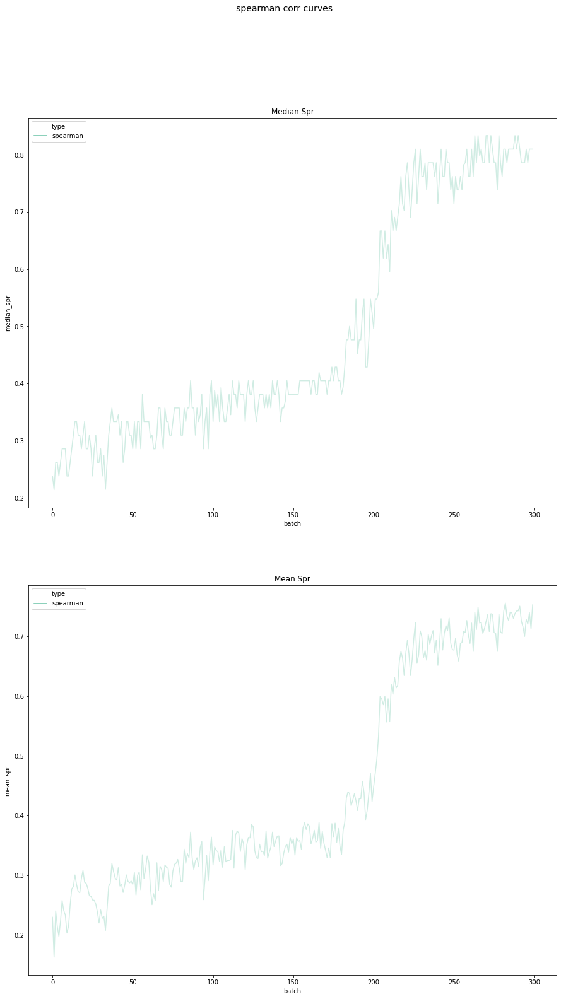

In [544]:
len(meta_history[0])

meta_median = [np.median(x) for x in meta_history]
meta_mean = [np.mean(x) for x in meta_history]

meta_median_df = pd.DataFrame(meta_median)
meta_median_df.columns = ["median_spr"]

meta_median_df["mean_spr"] = meta_mean
meta_median_df['batch'] = [*range(len(meta_history))]
meta_median_df['type'] = "spearman"



fig, axs = plt.subplots(2, figsize=(15,25))

make_loss_fig(meta_median_df, ax=axs[0], title=f"Median Spr", loss_to_plot="median_spr")
make_loss_fig(meta_median_df, ax=axs[1], title=f"Mean Spr", loss_to_plot="mean_spr")

fig.suptitle("spearman corr curves", fontsize=14)

fig.show()


In [545]:
meta_median_df

,median_spr,mean_spr,batch,type
0,0.238095,0.229658,0,spearman
1,0.214286,0.162782,1,spearman
2,0.261905,0.240363,2,spearman
3,0.261905,0.214365,3,spearman
4,0.238095,0.197793,4,spearman
...,...,...,...,...
295,0.809524,0.728836,295,spearman
296,0.785714,0.720297,296,spearman
297,0.809524,0.739734,297,spearman
298,0.809524,0.712540,298,spearman


In [546]:
def plot_cell_specific_corr(xval, yval, ax, title, xlab, ylab, class_id):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id
    )
    g.set(ylim=(0, 1))
    g.set(xlim=(0, 1))
    g.plot([0, 1], [0, 1], transform=g.transAxes)

    ax.set_title(title)
    return g


def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df


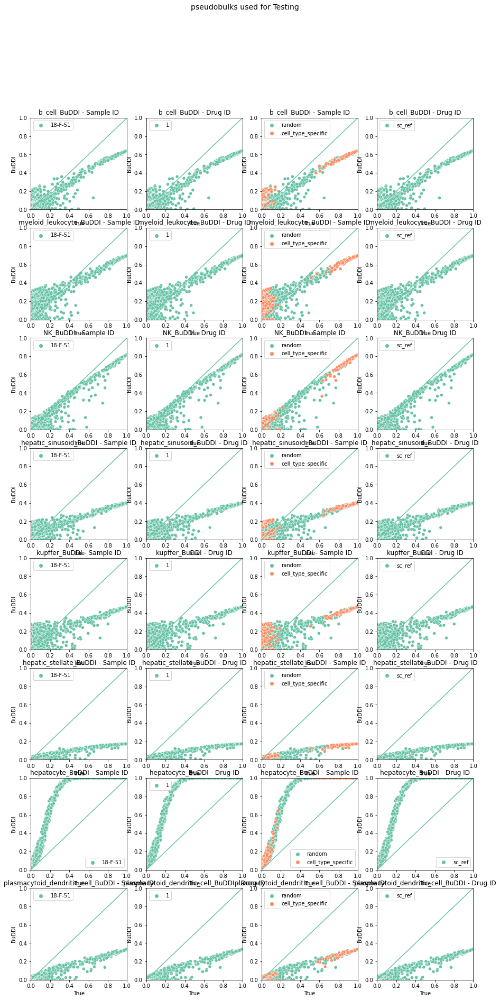

In [547]:
idx_tmp = idx_test
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]



fig, axs = plt.subplots(8, 4, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=label_temp[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
        
    row_idx = row_idx +1


fig.suptitle("pseudobulks used for Testing", fontsize=14)

fig.show()

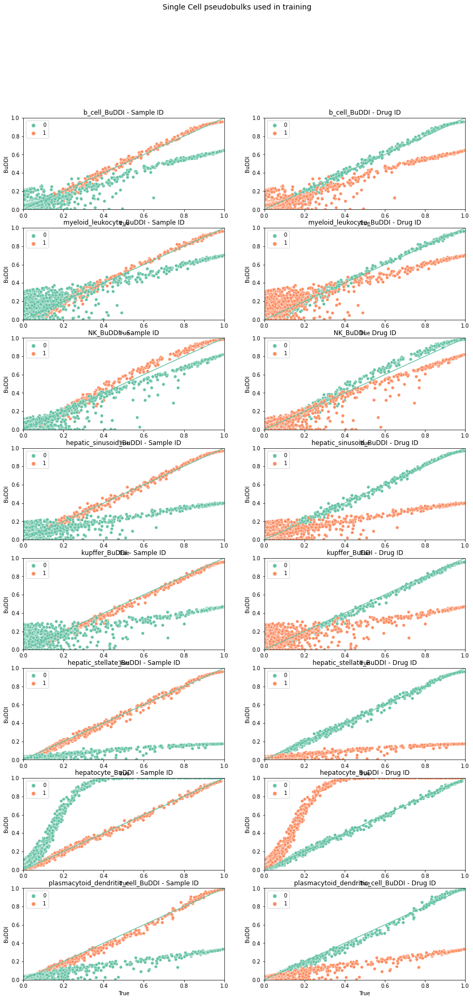

In [548]:
idx_tmp = idx_sc
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

fig, axs = plt.subplots(8, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Label_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("Single Cell pseudobulks used in training", fontsize=14)

fig.show()

### compare errors

In [549]:
def read_diva_result_file(res_path, train_id, test_id, unlab_id):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-DIVA.pkl")
    res_path = Path(res_file)
    res_df = pickle.load( open( res_path, "rb" ) )
    return res_df

def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df




In [550]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


def get_errors_single(y_true, y_est):
  mse_err = [mean_sqr_error(y_true, y_est)]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true, y_est)[0]]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true, y_est)[0]]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"] + ["SPR"] + ["PEAR"]

  return plot_df




In [551]:
tab = meta_df.groupby(['cell_prop_type', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
cell_prop_type,,
cell_type_specific,800,800
random,1000,1000
realistic,35,14


In [552]:
idx_tmp = np.logical_and(meta_df.cell_prop_type == "random", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]

idx_tmp.shape

(1000,)

MSqE mean: 0.0004935851185788152, median: 0.00037977911833554987, max: 0.0034760112296593065
Spearman mean: 0.8567569115395431, median: 0.9047619047619048, max: 1.0
Pearson mean: 0.9918516196485333, median: 0.9945708022241836, max: 0.999997853465296
MSqE mean: 0.023736626379134734, median: 0.0165733452408683, max: 0.10038109455533534
Spearman mean: 0.5184191754965647, median: 0.5476190476190477, max: 1.0
Pearson mean: 0.6709735023360902, median: 0.7339514080183073, max: 0.9999991805088853


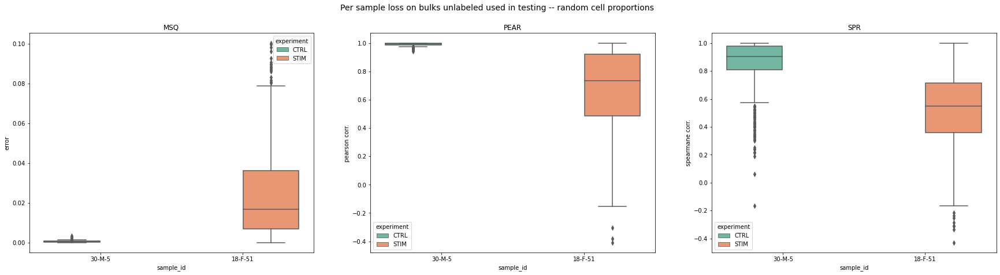

In [553]:
# Now compare across samples

idx_tmp = np.logical_and(meta_df.cell_prop_type == "random", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]
#idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "random", meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]
#idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in testing -- random cell proportions", fontsize=14)

fig.show()

MSqE mean: 0.00017968988543012128, median: 0.0001102879734851632, max: 0.0018576031624729832
Spearman mean: 0.6541071428571429, median: 0.7142857142857144, max: 1.0
Pearson mean: 0.9991723684689984, median: 0.9996206541971263, max: 0.9999993625927216
MSqE mean: 0.030891453453751754, median: 0.020843142125442735, max: 0.10143697919832928
Spearman mean: 0.3925595238095238, median: 0.4047619047619048, max: 0.9761904761904763
Pearson mean: 0.815797594651231, median: 0.8455317831595213, max: 0.999998354364483


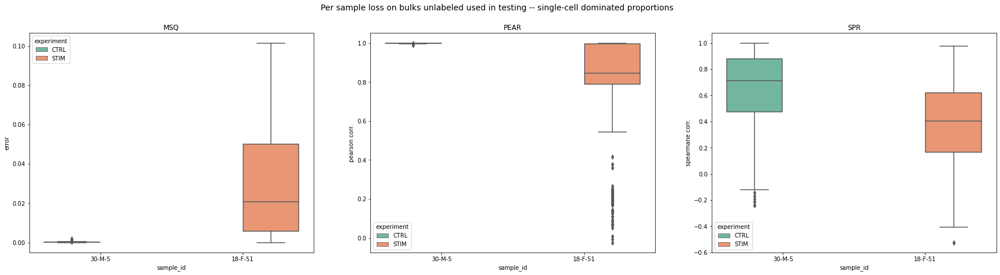

In [554]:
# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "cell_type_specific", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "cell_type_specific", meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in testing -- single-cell dominated proportions", fontsize=14)

fig.show()

In [555]:
plot_df

,error,error_type,experiment,method,sample_id
0,0.000140,MSQ,CTRL,BuDDI,30-M-5
1,0.000082,MSQ,CTRL,BuDDI,30-M-5
2,0.000032,MSQ,CTRL,BuDDI,30-M-5
3,0.000048,MSQ,CTRL,BuDDI,30-M-5
4,0.000235,MSQ,CTRL,BuDDI,30-M-5
...,...,...,...,...,...
2395,0.994380,PEAR,STIM,BuDDI,18-F-51
2396,0.996181,PEAR,STIM,BuDDI,18-F-51
2397,0.984871,PEAR,STIM,BuDDI,18-F-51
2398,0.996586,PEAR,STIM,BuDDI,18-F-51


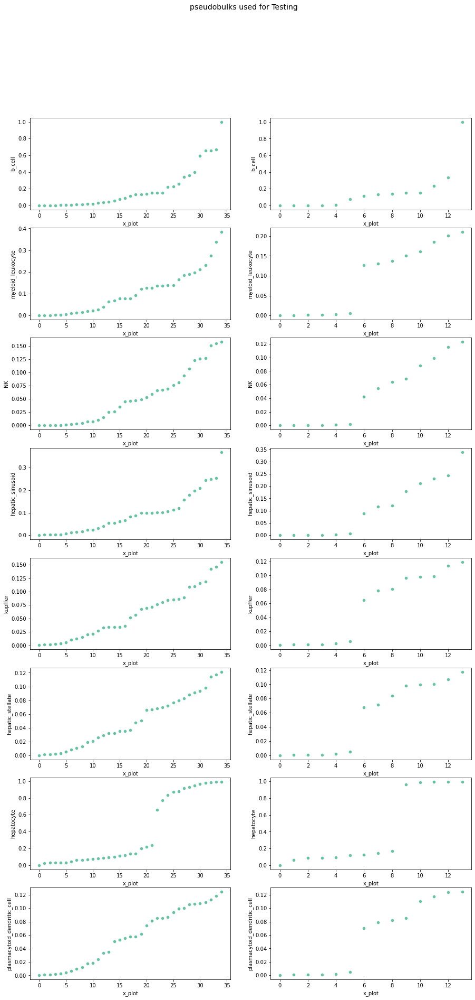

In [556]:
# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "realistic", meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]


X_tmp = X_full[idx_tmp,]
X_tmp = X_full[idx_tmp,]


# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# order each column, then sort for our dotplots
sm = np.argsort(prop_outputs, axis=0)
prop_outputs = np.take_along_axis(prop_outputs, sm, axis=0)

# make dataframe
buddi_pred_ctrl = pd.DataFrame(prop_outputs)
buddi_pred_ctrl.columns = true_prop_df.columns.to_list()

# format the df
buddi_pred_ctrl["experiment"] = ["CTRL"]*prop_outputs.shape[0]
buddi_pred_ctrl["x_plot"] = range(prop_outputs.shape[0])


# Now compare across samples
idx_tmp = np.logical_and(meta_df.cell_prop_type == "realistic", meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]


X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# order each column, then sort for our dotplots
sm = np.argsort(prop_outputs, axis=0)
prop_outputs = np.take_along_axis(prop_outputs, sm, axis=0)

# make dataframe
buddi_pred_stim = pd.DataFrame(prop_outputs)
buddi_pred_stim.columns = true_prop_df.columns.to_list()

# format the df
buddi_pred_stim["experiment"] = ["STIM"]*prop_outputs.shape[0]
buddi_pred_stim["x_plot"] = range(prop_outputs.shape[0])




fig, axs = plt.subplots(8, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    g = sns.scatterplot(
        x="x_plot", y=curr_cell,
        data=buddi_pred_ctrl,ax=axs[row_idx, 0]
    )

    g = sns.scatterplot(
        x="x_plot", y=curr_cell,
        data=buddi_pred_stim,ax=axs[row_idx, 1]
    )
       
    row_idx = row_idx +1


fig.suptitle("pseudobulks used for Testing", fontsize=14)

fig.show()

# **Inspect the output**

## TSNE training data

Now that we know what is expected, let's see what we get from the model. We find that out of our encoder, after applying ReLU, we get pretty close to the expected proportions.

## Plot Reconstruction

In [557]:

recon_idx = meta_df.isTraining == "Train"
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 7500, replace=True)


meta_temp = meta_df.iloc[recon_idx]


Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)


label_temp = np.copy(Label_full[recon_idx])
perturb_temp = Drug_full[recon_idx]

X_temp = np.copy(X_full[recon_idx])


prop_outputs = classifier.predict(X_temp, batch_size=batch_size)



# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk = encoder_unlab.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)




/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 7500 samples in 0.044s...
[t-SNE] Computed neighbors for 7500 samples in 3.815s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7500
[t-SNE] Computed conditional probabilities for sample 2000 / 7500
[t-SNE] Computed conditional probabilities for sample 3000 / 7500
[t-SNE] Computed conditional probabilities for sample 4000 / 7500
[t-SNE] Computed conditional probabilities for sample 5000 / 7500
[t-SNE] Computed conditional probabilities for sample 6000 / 7500
[t-SNE] Computed conditional probabilities for sample 7000 / 7500
[t-SNE] Computed conditional probabilities for sample 7500 / 7500
[t-SNE] Mean sigma: 1.390442
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.833992
[t-SNE] KL divergence after 500 iterations: 0.808248
(7500, 2)
(7500, 2)


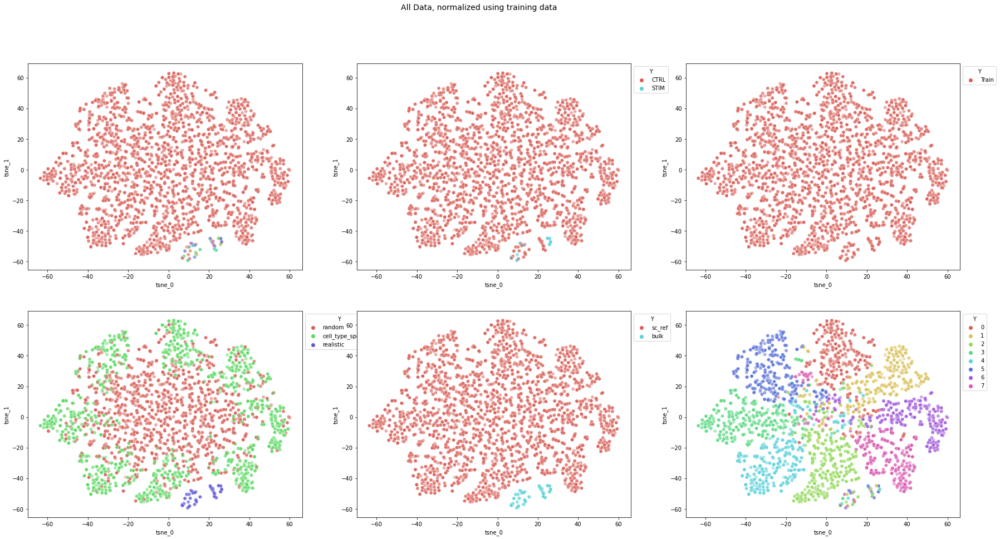

In [558]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_temp)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_tsne(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)


fig.show()

(7500, 2)
(7500, 2)


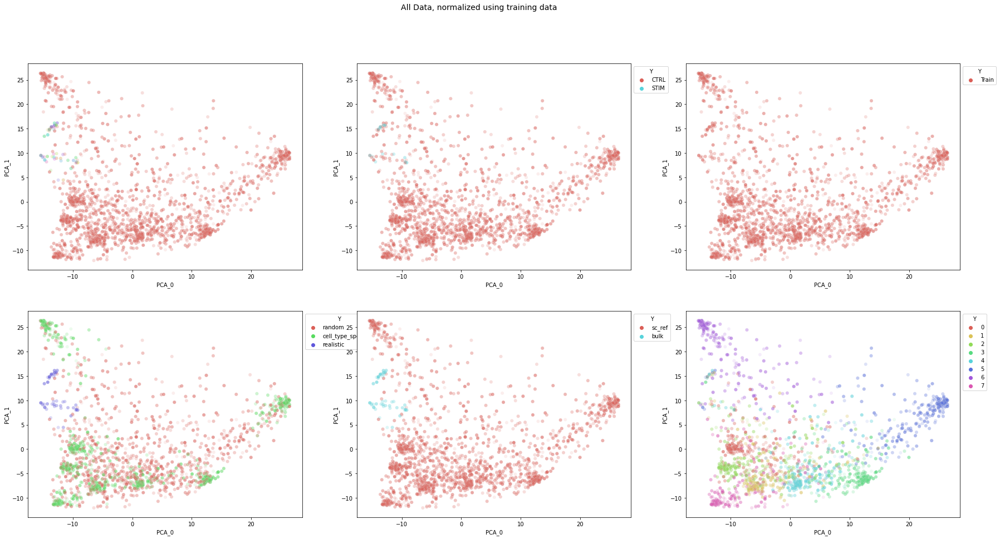

In [559]:
## plot samples
plot_df = vp.get_pca_for_plotting(X_temp)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_pca(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)
axs[0,0].legend([],[], frameon=False)

fig.show()

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 7500 samples in 0.051s...
[t-SNE] Computed neighbors for 7500 samples in 6.295s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7500
[t-SNE] Computed conditional probabilities for sample 2000 / 7500
[t-SNE] Computed conditional probabilities for sample 3000 / 7500
[t-SNE] Computed conditional probabilities for sample 4000 / 7500
[t-SNE] Computed conditional probabilities for sample 5000 / 7500
[t-SNE] Computed conditional probabilities for sample 6000 / 7500
[t-SNE] Computed conditional probabilities for sample 7000 / 7500
[t-SNE] Computed conditional probabilities for sample 7500 / 7500
[t-SNE] Mean sigma: 1.690960
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.917175
[t-SNE] KL divergence after 500 iterations: 1.766617
(7500, 2)
(7500, 2)


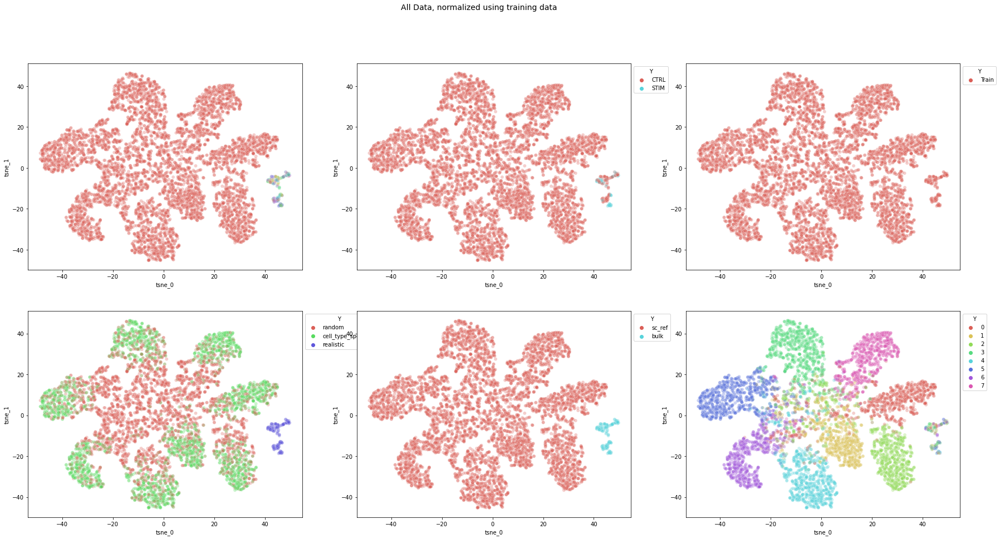

In [560]:
## plot samples
plot_df = vp.get_tsne_for_plotting(decoded_outputs)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_tsne(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)
axs[0,0].legend([],[], frameon=False)

fig.show()

(7500, 2)
(7500, 2)


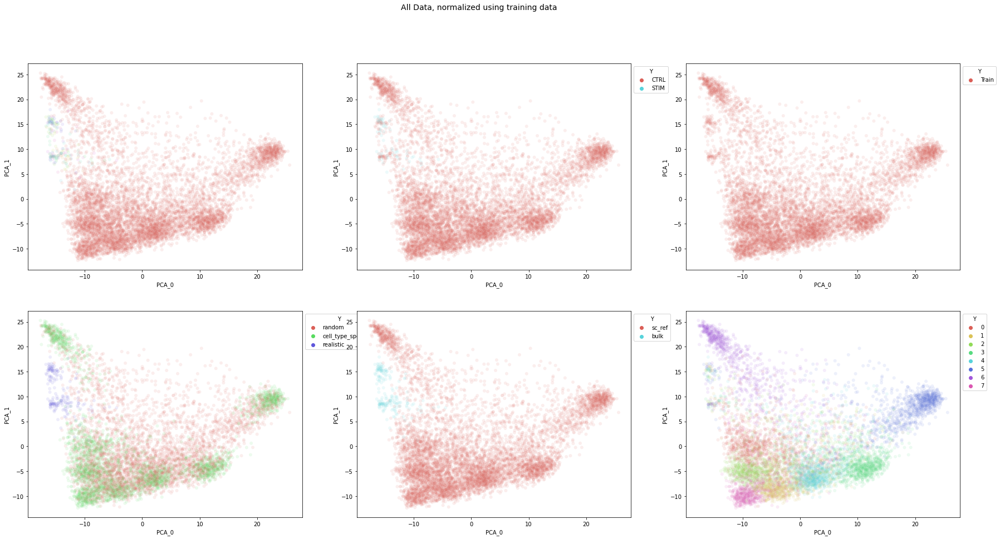

In [561]:
## plot samples
plot_df = vp.get_pca_for_plotting(decoded_outputs)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

vp.plot_pca(plot_df, meta_temp.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_temp.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_temp.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_temp.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_temp.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)
axs[0,0].legend([],[], frameon=False)

fig.show()

(15000, 2)
(15000, 2)


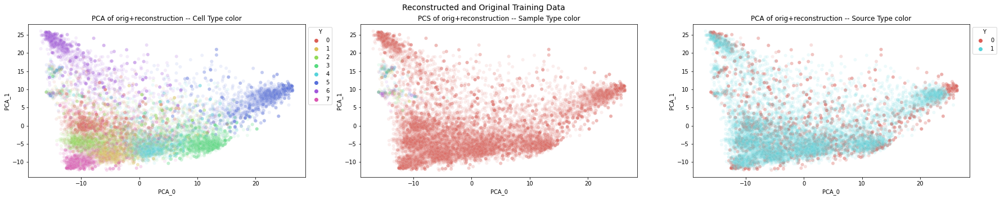

In [562]:
# make duplicated
X_dup = np.vstack([X_temp, decoded_outputs])


Y_dup = np.append(Y_temp, Y_temp)

label_dup = np.append(label_temp, label_temp)
perturb_dup = np.append(perturb_temp, perturb_temp)
source_dup = np.asarray(np.append([0]*7500, [1]*7500))

fig, axs = plt.subplots(1, 3, figsize=(30,5))

plot_df = vp.get_pca_for_plotting(np.asarray(X_dup))
vp.plot_pca(plot_df, color_vec=Y_dup, ax=axs[0], title="PCA of orig+reconstruction -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_dup, ax=axs[1], title="PCS of orig+reconstruction -- Sample Type color")
vp.plot_pca(plot_df, color_vec=source_dup, ax=axs[2], title="PCA of orig+reconstruction -- Source Type color")


fig.suptitle("Reconstructed and Original Training Data", fontsize=14)
axs[1].legend([],[], frameon=False)

fig.show()

In [563]:
recon_idx = np.where(meta_df.isTraining == "Test")[0]
recon_idx = np.random.choice(recon_idx, 7500, replace=True)


Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)


label_temp = np.copy(Label_full[recon_idx])
perturb_temp = Drug_full[recon_idx]

# need duplicates
len_recon_idx = len(recon_idx)
recon_idx = np.tile(recon_idx, 5)
X_temp = np.copy(X_full[recon_idx])


prop_outputs = classifier.predict(X_temp, batch_size=batch_size)



# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug, z_bulk, mu_bulk, l_sigma_bulk = encoder_unlab.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)

decoded_outputs = decoded_outputs[0:len_recon_idx]
X_temp = X_temp[0:len_recon_idx]


(15000, 2)
(15000, 2)


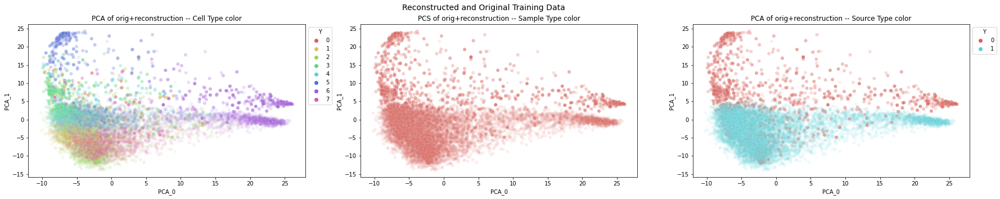

In [564]:
# make duplicated
X_dup = np.vstack([X_temp, decoded_outputs])


Y_dup = np.append(Y_temp, Y_temp)

label_dup = np.append(label_temp, label_temp)
perturb_dup = np.append(perturb_temp, perturb_temp)
source_dup = np.asarray(np.append([0]*7500, [1]*7500))

fig, axs = plt.subplots(1, 3, figsize=(30,5))

plot_df = vp.get_pca_for_plotting(np.asarray(X_dup))
vp.plot_pca(plot_df, color_vec=Y_dup, ax=axs[0], title="PCA of orig+reconstruction -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_dup, ax=axs[1], title="PCS of orig+reconstruction -- Sample Type color")
vp.plot_pca(plot_df, color_vec=source_dup, ax=axs[2], title="PCA of orig+reconstruction -- Source Type color")


fig.suptitle("Reconstructed and Original Training Data", fontsize=14)
axs[1].legend([],[], frameon=False)

fig.show()

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 15000 samples in 0.086s...
[t-SNE] Computed neighbors for 15000 samples in 19.186s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15000
[t-SNE] Computed conditional probabilities for sample 2000 / 15000
[t-SNE] Computed conditional probabilities for sample 3000 / 15000
[t-SNE] Computed conditional probabilities for sample 4000 / 15000
[t-SNE] Computed conditional probabilities for sample 5000 / 15000
[t-SNE] Computed conditional probabilities for sample 6000 / 15000
[t-SNE] Computed conditional probabilities for sample 7000 / 15000
[t-SNE] Computed conditional probabilities for sample 8000 / 15000
[t-SNE] Computed conditional probabilities for sample 9000 / 15000
[t-SNE] Computed conditional probabilities for sample 10000 / 15000
[t-SNE] Computed conditional probabilities for sample 11000 / 15000
[t-SNE] Computed conditional probabilities for sample 12000 / 15000
[t-SNE] Computed conditional probabilities for sa

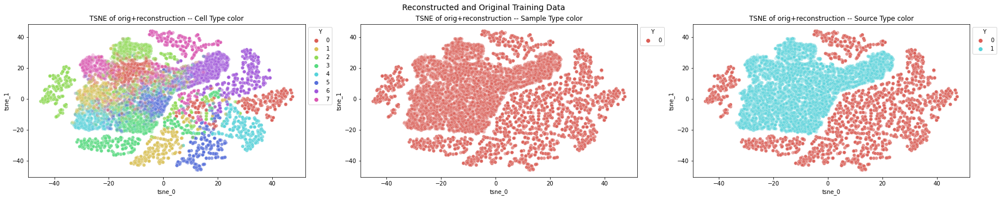

In [565]:

fig, axs = plt.subplots(1, 3, figsize=(30,5))

plot_df = vp.get_tsne_for_plotting(np.asarray(X_dup))
vp.plot_tsne(plot_df, color_vec=Y_dup, ax=axs[0], title="TSNE of orig+reconstruction -- Cell Type color")
vp.plot_tsne(plot_df, color_vec=label_dup, ax=axs[1], title="TSNE of orig+reconstruction -- Sample Type color")
vp.plot_tsne(plot_df, color_vec=source_dup, ax=axs[2], title="TSNE of orig+reconstruction -- Source Type color")


fig.suptitle("Reconstructed and Original Training Data", fontsize=14)

fig.show()

### Plot latent spaces

In [566]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max
0,30-M-5,CTRL,Train,random,sc_ref,myeloid_leukocyte
1,30-M-5,CTRL,Train,random,sc_ref,hepatocyte
2,30-M-5,CTRL,Train,random,sc_ref,hepatic_stellate
3,30-M-5,CTRL,Train,random,sc_ref,hepatic_stellate
4,30-M-5,CTRL,Train,random,sc_ref,NK
...,...,...,...,...,...,...
Liver_7,Liver_7,CTRL,Train,realistic,bulk,NK
Liver_35,Liver_35,CTRL,Train,realistic,bulk,hepatic_stellate
Liver_2,Liver_2,STIM,Train,realistic,bulk,hepatic_sinusoid
Liver_5,Liver_5,CTRL,Train,realistic,bulk,plasmacytoid_dendritic_cell


In [567]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,1835,14


In [568]:

tab = meta_df.iloc[idx_train].groupby(['sample_id', 'cell_prop_type']).size()
tab.unstack()

cell_prop_type,cell_type_specific,random,realistic
sample_id,,,
30-M-5,800.0,1000.0,NaN
Liver_1,NaN,NaN,1.0
Liver_10,NaN,NaN,1.0
Liver_11,NaN,NaN,1.0
Liver_12,NaN,NaN,1.0
Liver_13,NaN,NaN,1.0
Liver_14,NaN,NaN,1.0
Liver_16,NaN,NaN,1.0
Liver_17,NaN,NaN,1.0


In [569]:
idx_tmp = np.where(meta_df.isTraining == "Train")[0]
len_idx = idx_tmp.shape[0]
len_idx

1849

Number unique Y: 8
plotting
plotting1
(10000, 2)
(10000, 2)
plotting2
(10000, 2)
(10000, 2)
plotting3
(10000, 2)
(10000, 2)
plotting4
(10000, 2)
(10000, 2)


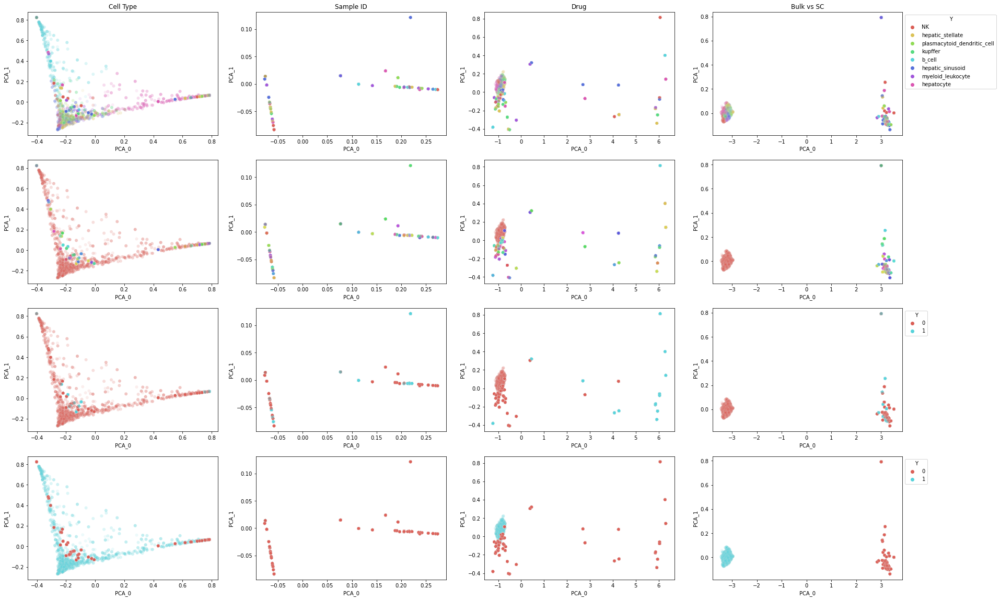

In [570]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = true_prop_df.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, _, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)

"""
z_slack = z_slack[0:len_idx]
z_rot = z_rot[0:len_idx]
mu_rot = mu_rot[0:len_idx]
z_drug = z_drug[0:len_idx]
mu_drug = mu_drug[0:len_idx]
z_bulk = z_bulk[0:len_idx]
mu_bulk = mu_bulk[0:len_idx]
prop_outputs = prop_outputs[0:len_idx]
decoded_outputs = decoded_outputs[0:len_idx]

Y_temp = Y_temp[0:len_idx]
label_temp = label_temp[0:len_idx]
perturb_temp = perturb_temp[0:len_idx]
bulk_temp = bulk_temp[0:len_idx]
"""

print("plotting")


fig, axs = plt.subplots(4, 4, figsize=(30,20))
print("plotting1")

plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell Type")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,0], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,0], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,0], title="")
print("plotting2")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_rot))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,1], title="Sample ID")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,1], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,1], title="")
print("plotting3")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,2], title="Drug")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,2], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,2], title="")

print("plotting4")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_bulk))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,3], title="Bulk vs SC")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,3], title="")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,3], title="")
vp.plot_pca(plot_df, color_vec=bulk_temp, ax=axs[3,3], title="")


#fig.suptitle("Training Data", fontsize=14)
count_idx = 0
for ax1 in axs:
    inner_count_idx = 0
    for ax2 in ax1:
        if count_idx == 1 or inner_count_idx < 3:
            ax2.get_legend().remove()
        inner_count_idx = inner_count_idx + 1

    count_idx = count_idx + 1
fig.show()

#out_plot = os.path.join(res_data_path, f"output1.pdf")
#fig.savefig(out_plot, dpi=300)


    
#out_plot = os.path.join(res_data_path, f"output2.pdf")
#fig.savefig(out_plot, dpi=300)

In [571]:
idx_tmp = np.where(meta_df.isTraining=="Test")[0]
meta_df.iloc[idx_tmp].cell_prop_type.value_counts()

random                1000
cell_type_specific     800
Name: cell_prop_type, dtype: int64

In [572]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Test", meta_df.cell_prop_type == "cell_type_specific"))[0]
len_idx = idx_tmp.shape[0]
len_idx

800

In [573]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Test", meta_df.cell_prop_type != "cell_type_specific"))[0]
len_idx = idx_tmp.shape[0]
len_idx

1000

## Do latent space projectsions

### drug perturbation

In [574]:

def calc_buddi_perturbation(meta_df, X_full, scaler, encoder_unlab, decoder, batch_size):

    # get the training data
    # so we can use it to get the latent codes

    # get the points we are interested in
    # we will use their codes and only change the perturbation codes
    subset_idx = np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "cell_type_specific")
    subset_idx = np.where(subset_idx)[0] 
    subset_idx = np.random.choice(subset_idx, 8000, replace=True)

    temp_meta_df = meta_df.iloc[subset_idx]

    X_temp = np.copy(X_full)
    X_unpert = X_temp[subset_idx,]

    Y_temp = np.copy(Y_full)
    Y_temp = Y_temp[subset_idx]


    #####
    # get cell type specific latent codes
    #####

    _, _, _, _, _, _, z_unpert, _, _, _, _, _  = encoder_unlab.predict(X_unpert, batch_size=batch_size)


    #####
    # get perturbation latent codes
    #####

    # get the index to get the perturbation latent codes
    pert_code_idx = np.logical_and(meta_df.isTraining == "Train", meta_df.stim == "STIM")
    pert_code_idx = np.where(pert_code_idx)[0] 
    pert_code_idx = np.random.choice(pert_code_idx, len(subset_idx), replace=True)
    z_slack, _, _, z_samples, _, _, z_pert, _, _, z_bulk, _, _  = encoder_unlab.predict(X_temp[pert_code_idx,], batch_size=batch_size)



    # make the metadata table 
    temp_meta_df = meta_df.iloc[subset_idx]
    temp_meta_df.isTraining = "Test"
    temp_meta_df.cell_prop_type = "cell_type_specific"


    ######
    # now put it all together
    ######

    # now concatenate together and add the stim codes to the latent
    z_concat_perturb = np.hstack([z_slack, Y_temp, z_samples, z_pert, z_bulk])
    decoded_0_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
    decoded_0_1 = scaler.inverse_transform(decoded_0_1)

    # now concatenate together and add the stim codes to the latent
    z_concat_unperturb = np.hstack([z_slack, Y_temp, z_samples, z_unpert, z_bulk])
    decoded_0_0 = decoder.predict(z_concat_unperturb, batch_size=batch_size)
    decoded_0_0 = scaler.inverse_transform(decoded_0_0)




    return (temp_meta_df, decoded_0_0, decoded_0_1)


In [575]:

ctrl_test_meta_df, decoded_0_0, decoded_0_1 = calc_buddi_perturbation(meta_df, X_full, scaler, encoder_unlab, decoder, batch_size)


<ipython-input-574-a17fad3de5cc>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.isTraining = "Test"
<ipython-input-574-a17fad3de5cc>:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_meta_df.cell_prop_type = "cell_type_specific"


In [576]:
ctrl_test_meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max
1154,30-M-5,CTRL,Test,cell_type_specific,sc_ref,hepatic_sinusoid
1787,30-M-5,CTRL,Test,cell_type_specific,sc_ref,myeloid_leukocyte
1140,30-M-5,CTRL,Test,cell_type_specific,sc_ref,hepatic_sinusoid
1744,30-M-5,CTRL,Test,cell_type_specific,sc_ref,myeloid_leukocyte
1786,30-M-5,CTRL,Test,cell_type_specific,sc_ref,myeloid_leukocyte
...,...,...,...,...,...,...
1707,30-M-5,CTRL,Test,cell_type_specific,sc_ref,myeloid_leukocyte
1143,30-M-5,CTRL,Test,cell_type_specific,sc_ref,hepatic_sinusoid
1546,30-M-5,CTRL,Test,cell_type_specific,sc_ref,plasmacytoid_dendritic_cell
1765,30-M-5,CTRL,Test,cell_type_specific,sc_ref,myeloid_leukocyte


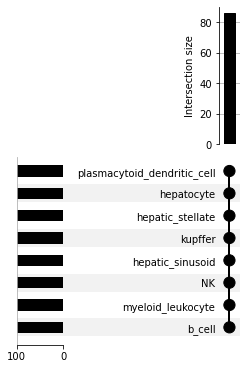

In [577]:
from scipy.stats import rankdata


top_lim = 100

top_genes = {}
de_genes_all = None
for curr_cell_type in Y_full.columns:


    # this is for the "projected" expression
    curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
    proj_ctrl = decoded_0_0[curr_idx]
    proj_stim = decoded_0_1[curr_idx]

    # take the median for nomalization

    proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
    proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
    #proj_ctrl = np.median(proj_ctrl, axis=0)
    #proj_stim = np.median(proj_stim, axis=0)
    proj_log2FC = np.abs(proj_stim-proj_ctrl)

    # make into DF
    proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes)

    intersect_proj = proj_log2FC_df.loc[union_genes][0]
    top_proj_genes = intersect_proj.index[np.argsort(np.abs(intersect_proj))].tolist()[::-1][0:top_lim]

    top_genes[curr_cell_type] = top_proj_genes


cell_diff = from_contents(top_genes)
ax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()

#venn2([set(top_pub_genes), set(top_proj_genes)], set_labels = ('Top Pub Genes', 'Top Proj Genes'))
#plt.show()


In [578]:
top_genes["kupffer"]

['Cyp2a4',
 'Cyp2b9',
 'Cyp2c69',
 'Acot3',
 'A1bg',
 'Xist',
 'Cyp2b13',
 'Cyp2c40',
 'Cyp2d9',
 'Fmo3',
 'Hamp2',
 'Mup7',
 'Cyp3a41a',
 'Sult2a2',
 'Mup20',
 'Cyp17a1',
 'Sult2a1',
 'Prlr',
 'Slc22a26',
 'Cyp2c38',
 'Cyp4a14',
 'Actn2',
 'Hsd17b6',
 'C8a',
 'Selenbp2',
 'Pkia',
 'Pgam2',
 'Cyp4a10',
 'Ankrd23',
 'Acot4',
 'Cyp2c68',
 'Tmem38a',
 'Slc16a3',
 'Pygm',
 'Hspb6',
 'Cox6a2',
 'Cyp7a1',
 'Nt5e',
 'Fgl1',
 'Tpm2',
 'Eno3',
 'Tmem229a',
 'Srl',
 'Hacl1',
 'Pkhd1',
 'Mylpf',
 'Asb2',
 'Ugt1a5',
 'Sult3a1',
 'Cyp2d12',
 'Akr1d1',
 'Tnni2',
 'Klk1',
 'Phka1',
 'Nudt7',
 'Nr1i3',
 'C6',
 'Ryr1',
 'Cacna1s',
 'Myom1',
 'Gm4952',
 'Aox3',
 'Pth1r',
 'Des',
 'Slco1a4',
 'Acnat2',
 'Serpina1e',
 'Bicc1',
 'Dpys',
 'Aldh8a1',
 'Mup21',
 'Cyp7b1',
 'Arg2',
 'Ttc39c',
 'Rragd',
 'Ada',
 'Mef2c',
 'Gpc1',
 'Hao2',
 'Igfbp1',
 'C9',
 'Kcnj15',
 'Ifi27l2b',
 'Igsf9',
 'Ckm',
 'Sik2',
 'Smtnl2',
 'Maoa',
 'B3gnt3',
 'Neb',
 'Rpl3l',
 'Klhdc7a',
 'Lyz1',
 'Tnnt3',
 'Tm4sf5',
 'Col4a3',
 'Sc

In [579]:
de_genes_all = None
cell_type_interest = "hepatocyte"
for curr_cell_type in Y_full.columns:
    if curr_cell_type == cell_type_interest:
        continue

    top_proj_genes = top_genes[curr_cell_type]
    if de_genes_all is None:
        de_genes_all = top_proj_genes
    else:
        de_genes_all = np.union1d(de_genes_all, top_proj_genes)

ct_specific = np.setdiff1d(top_genes[cell_type_interest], de_genes_all)
ct_specific.tolist()


['Sorcs2']

In [580]:
from sklearn.metrics import r2_score, explained_variance_score, mean_squared_error

def plot_effect_size_corr(xval, yval, ax, title, xlab, ylab, class_id, style_id, alpha=0.5):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id,
        alpha= alpha,
        style=style_id
    )
    #g.set(ylim=(min_val, max_val))
    #g.set(xlim=(min_val, max_val))
    #g.plot([min_val, max_val], [min_val, max_val], transform=g.transAxes)
    sns.set_palette("Set2")

    ax.set_title(title)
    return g


### gene lists

In [581]:

union_genes_cap = [x.upper() for x in union_genes]

Pub_male_DE = ["CSMD1", "GALNT15", "NC_INTER_C14_25214", "NC_INTER_C19_31822", "NC_INTER_C6_41991", "NC_INTRA_C4_39314", "TRPC3", "APOE", "CLEC4A3", "HSD17B13", "ITIH4", "PIM3", "2310040G07RIK", "5330417C22RIK", "ACYP1", "ADAM11", "ADAMTS7", "AK4", "AMDHD2", "ANKRD31", "ARRDC3", "ASNS", "ATG16L2", "ATP8B4", "BMP7", "CAPN8", "CCDC146", "CDH2", "CIDEC", "CLN6", "CLSTN3", "CNNM1", "CRIM1", "CTSZ", "CYP1A2", "CYP2A5", "CYP2C55", "CYP2D12", "CYP2F2", "CYP2J9", "CYP3A59", "DDIT3", "DMAC2", "EPHB4", "ESCO2", "ESRRA", "ETNPPL", "EVA1A", "EXTL1", "F2RL2", "FBXO31", "FKBP11", "FST", "FTCD", "GAS2", "GBE1", "GDF15", "GM13238", "GM17090", "GM17276", "GM28172", "GM29650", "GM32250", "GM39325", "GM44623", "GM45051", "GM5930", "GSE1", "GSTA3", "GUCY2C", "GYS2", "HMOX1", "HNMT", "KCNK5", "KLHDC7A", "LMOD2", "LRP4", "MAB21L3", "MARCKSL1-PS4", "MEIG1", "MTNR1A", "MUP10", "MUP14", "MUP2", "MUP7", "NAT8", "NAT8F5", "NAT8F6", "NC_AS_C10_19571", "NC_AS_C10_8460", "NC_AS_C10_8856", "NC_AS_C10_9138", "NC_AS_C11_10136", "NC_AS_C11_21133", "NC_AS_C11_9866", "NC_AS_C12_10529", "NC_AS_C12_10778", "NC_AS_C13_11022", "NC_AS_C13_11425", "NC_AS_C13_23293", "NC_AS_C14_25013", "NC_AS_C15_12697", "NC_AS_C15_12848", "NC_AS_C15_12874", "NC_AS_C16_28194", "NC_AS_C17_13820", "NC_AS_C17_14024", "NC_AS_C17_29673", "NC_AS_C19_14844", "NC_AS_C19_15130", "NC_AS_C2_1233", "NC_AS_C2_1543", "NC_AS_C2_1778", "NC_AS_C2_1965", "NC_AS_C2_35105", "NC_AS_C3_2800", "NC_AS_C4_3532", "NC_AS_C4_3897", "NC_AS_C5_4051", "NC_AS_C5_41104", "NC_AS_C5_41479", "NC_AS_C5_41482", "NC_AS_C5_41483", "NC_AS_C5_4237", "NC_AS_C5_4257", "NC_AS_C5_4613", "NC_AS_C5_4719", "NC_AS_C6_43055", "NC_AS_C6_43544", "NC_AS_C6_4824", "NC_AS_C6_5604", "NC_AS_C6_5718", "NC_AS_C7_44087", "NC_AS_C7_45051", "NC_AS_C7_5921", "NC_AS_C7_5965", "NC_AS_C7_6065", "NC_AS_C7_6204", "NC_AS_C7_6377", "NC_AS_C8_46875", "NC_AS_C8_47354", "NC_AS_C8_7337", "NC_INTER_C1_1001", "NC_INTER_C1_166", "NC_INTER_C1_17618", "NC_INTER_C1_196", "NC_INTER_C1_274", "NC_INTER_C1_366", "NC_INTER_C1_406", "NC_INTER_C1_526", "NC_INTER_C1_588", "NC_INTER_C1_924", "NC_INTER_C1_931", "NC_INTER_C1_976", "NC_INTER_C10_17923", "NC_INTER_C10_19012", "NC_INTER_C10_19427", "NC_INTER_C10_19433", "NC_INTER_C10_19436", "NC_INTER_C10_19600", "NC_INTER_C10_8690", "NC_INTER_C10_8881", "NC_INTER_C10_9302", "NC_INTER_C10_9350", "NC_INTER_C11_10078", "NC_INTER_C11_10159", "NC_INTER_C11_10162", "NC_INTER_C11_10218", "NC_INTER_C11_19811", "NC_INTER_C11_20045", "NC_INTER_C11_20750", "NC_INTER_C11_20754", "NC_INTER_C11_21059", "NC_INTER_C11_21271", "NC_INTER_C11_21634", "NC_INTER_C12_10243", "NC_INTER_C12_10273", "NC_INTER_C12_10276", "NC_INTER_C12_10445", "NC_INTER_C12_10644", "NC_INTER_C12_10925", "NC_INTER_C12_21741", "NC_INTER_C12_21747", "NC_INTER_C12_21907", "NC_INTER_C12_22126", "NC_INTER_C13_11141", "NC_INTER_C13_11226", "NC_INTER_C13_11236", "NC_INTER_C13_11562", "NC_INTER_C13_23241", "NC_INTER_C13_23567", "NC_INTER_C14_12201", "NC_INTER_C14_25326", "NC_INTER_C14_25422", "NC_INTER_C14_25970", "NC_INTER_C15_12341", "NC_INTER_C15_26385", "NC_INTER_C15_26545", "NC_INTER_C15_26737", "NC_INTER_C15_27072", "NC_INTER_C15_27197", "NC_INTER_C15_27246", "NC_INTER_C15_27604", "NC_INTER_C15_27605", "NC_INTER_C16_13168", "NC_INTER_C16_13481", "NC_INTER_C16_28109", "NC_INTER_C16_28214", "NC_INTER_C16_28305", "NC_INTER_C16_28503", "NC_INTER_C17_13938", "NC_INTER_C17_14087", "NC_INTER_C17_14113", "NC_INTER_C17_29151", "NC_INTER_C17_29437", "NC_INTER_C17_29461", "NC_INTER_C18_30929", "NC_INTER_C18_31338", "NC_INTER_C18_31396", "NC_INTER_C19_14758", "NC_INTER_C19_14967", "NC_INTER_C19_15004", "NC_INTER_C19_15182", "NC_INTER_C19_31671", "NC_INTER_C19_32377", "NC_INTER_C19_32381", "NC_INTER_C19_32383", "NC_INTER_C19_32539", "NC_INTER_C2_1121", "NC_INTER_C2_1161", "NC_INTER_C2_2000", "NC_INTER_C2_33152", "NC_INTER_C2_33876", "NC_INTER_C3_2168", "NC_INTER_C3_2630", "NC_INTER_C3_2797", "NC_INTER_C3_2922", "NC_INTER_C3_2942", "NC_INTER_C3_35342", "NC_INTER_C3_35348", "NC_INTER_C3_35349", "NC_INTER_C3_35359", "NC_INTER_C3_35556", "NC_INTER_C3_36231", "NC_INTER_C3_36265", "NC_INTER_C3_37079", "NC_INTER_C3_37178", "NC_INTER_C4_3086", "NC_INTER_C4_3533", "NC_INTER_C4_3549", "NC_INTER_C4_3579", "NC_INTER_C4_3775", "NC_INTER_C4_37854", "NC_INTER_C4_38023", "NC_INTER_C4_38403", "NC_INTER_C4_38427", "NC_INTER_C4_38509", "NC_INTER_C4_39163", "NC_INTER_C5_39934", "NC_INTER_C5_40222", "NC_INTER_C5_4048", "NC_INTER_C5_4055", "NC_INTER_C5_40800", "NC_INTER_C5_41123", "NC_INTER_C5_41259", "NC_INTER_C5_41621", "NC_INTER_C5_4379", "NC_INTER_C5_4474", "NC_INTER_C5_4651", "NC_INTER_C5_4788", "NC_INTER_C5_4819", "NC_INTER_C6_41969", "NC_INTER_C6_41970", "NC_INTER_C6_5193", "NC_INTER_C6_5309", "NC_INTER_C6_5310", "NC_INTER_C6_5316", "NC_INTER_C6_5846", "NC_INTER_C6_5862", "NC_INTER_C7_43801", "NC_INTER_C7_43842", "NC_INTER_C7_43873", "NC_INTER_C7_44280", "NC_INTER_C7_45606", "NC_INTER_C7_45613", "NC_INTER_C7_45614", "NC_INTER_C7_6068", "NC_INTER_C7_6094", "NC_INTER_C7_6294", "NC_INTER_C7_6392", "NC_INTER_C7_6508", "NC_INTER_C7_6509", "NC_INTER_C7_6595", "NC_INTER_C8_45937", "NC_INTER_C8_47239", "NC_INTER_C8_47251", "NC_INTER_C8_6944", "NC_INTER_C8_7176", "NC_INTER_C8_7350", "NC_INTER_C8_7605", "NC_INTER_C8_7610", "NC_INTER_C9_48130", "NC_INTER_C9_48783", "NC_INTER_C9_49383", "NC_INTER_C9_7885", "NC_INTER_C9_7892", "NC_INTER_C9_8122", "NC_INTER_CX_49514", "NC_INTER_CX_50093", "NC_INTER_CX_50188", "NC_INTER_CY_50499", "NC_INTRA_C1_16454", "NC_INTRA_C16_28090", "NC_INTRA_C4_38600", "NHEJ1", "NRG4", "PAK6", "PAX8", "PCGF2", "PDGFA", "PELI3", "PFKFB3", "PKDREJ", "PKNOX2", "PLD6", "PPARGC1B", "PREX2", "PROCA1", "PTCH2", "PXYLP1", "R3HDML", "RAB3D", "RANBP17", "Ranbp3l", "RAP2A", "RBMS2", "RENBP", "RIBC1", "RIPOR2", "RPS6KA1", "RUNDC3B", "SCARB1", "SCN1B", "SEC22C", "SERPINA12", "SERPINE2", "SH3BGRL2", "SH3RF1", "SIPA1L2", "SLC18A2", "SLC22A22", "SLC22A4", "SLC24A5", "SLC2A5", "SLC35E3", "SPAG16", "SULT2A8", "SUSD4", "TAFA2", "TC2N", "THRSP", "TIMM9", "TOMM40L", "TRIB3", "TXNDC5", "VCL", "VEGFD", "WNK4", "ZBTB12", "ZFR2", "ABCB1B", "ANK1", "APBA2", "BDH2", "BDNF", "BID", "BIRC5", "BMP4", "BRINP3", "CCDC151", "CCDC152", "CCDC158", "CERS5", "COL4A2", "CRYM", "DAB1", "DNAH8", "ENPP3", "EPB41L1", "EPHB6", "EZR", "GAL3ST1", "GM10701", "GM14146", "GRM7", "GTSE1", "HS1BP3", "HSD3B2", "IHH", "KEG1", "LRRC14B", "METTL7A1", "MUP1", "MUP11", "NC_AS_C1_16117", "NC_AS_C1_221", "NC_AS_C10_9290", "NC_AS_C10_9351", "NC_AS_C11_10168", "NC_AS_C11_10193", "NC_AS_C11_10227", "NC_AS_C13_11185", "NC_AS_C14_11991", "NC_AS_C14_12074", "NC_AS_C14_12111", "NC_AS_C2_33533", "NC_AS_C4_3824", "NC_AS_C7_6162", "NC_INTER_C1_1038", "NC_INTER_C1_15751", "NC_INTER_C1_17121", "NC_INTER_C10_18779", "NC_INTER_C10_8745", "NC_INTER_C10_8846", "NC_INTER_C11_10211", "NC_INTER_C11_10213", "NC_INTER_C11_19797", "NC_INTER_C11_9434", "NC_INTER_C12_10431", "NC_INTER_C13_11090", "NC_INTER_C13_23303", "NC_INTER_C13_24436", "NC_INTER_C14_11858", "NC_INTER_C14_11989", "NC_INTER_C14_24999", "NC_INTER_C15_12954", "NC_INTER_C15_27082", "NC_INTER_C16_13185", "NC_INTER_C16_13421", "NC_INTER_C16_28146", "NC_INTER_C17_13568", "NC_INTER_C17_14025", "NC_INTER_C18_14330", "NC_INTER_C19_14874", "NC_INTER_C3_2413", "NC_INTER_C3_2733", "NC_INTER_C3_2895", "NC_INTER_C3_35370", "NC_INTER_C3_35424", "NC_INTER_C4_3471", "NC_INTER_C4_3794", "NC_INTER_C4_38029", "NC_INTER_C4_38331", "NC_INTER_C4_38853", "NC_INTER_C5_39709", "NC_INTER_C5_41620", "NC_INTER_C6_42157", "NC_INTER_C6_42580", "NC_INTER_C6_43331", "NC_INTER_C6_43700", "NC_INTER_C6_4868", "NC_INTER_C7_43894", "NC_INTER_C7_43994", "NC_INTER_C7_44119", "NC_INTER_C7_44889", "NC_INTER_C7_5922", "NC_INTER_C7_6558", "NC_INTER_C8_46126", "NC_INTER_C8_47237", "NC_INTER_C8_47241", "NC_INTER_C8_7259", "NC_INTER_C8_7273", "NC_INTER_C9_47875", "NC_INTER_C9_49372", "NC_INTER_CX_50211", "NC_INTRA_C12_22588", "NC_INTRA_C3_2640", "NC_INTRA_C3_35408", "NC_INTRA_C5_4750", "NCAM2", "P2RX4", "PDE6A", "PER3", "PGP", "PIP5K1B", "PLCB4", "PLEKHF1", "POGK", "PPFIA3", "PPP1R42", "PRDM16", "RNF227", "SEL1L3", "SELENBP2", "SLC12A3", "SLC39A11", "SLC8A3", "SPACA6", "STEAP4", "TLE3", "TMEM19", "TNFSF15", "TRHDE", "TTC7B", "UGT2B36", "UNC119", "VMN2R22", "XLR3A", "ZFP37", "ZYG11A", "ADAMTSL2", "NC_INTER_C2_33847", "OLFR39", "OLFR872", "PLXDC2", "MYO5A", "NC_INTER_C11_10188", "1600014C10RIK", "1810064F22RIK", "2610507I01RIK", "A930033H14RIK", "AA986860", "ABCG2", "ABCG8", "ADGRV1", "ADORA1", "AKR1C19", "ALAS2", "ALPL", "ANG4", "AOX1", "AOX3", "ARL3", "ARSA", "BCL6", "BHLHE41", "C6", "C8A", "C8B", "C9", "CABYR", "CAMK2B", "CAR3", "CDC42EP1", "CES1F", "CFAP53", "CHPT1", "CHRM3", "CIART", "CIB3", "CLEC2H", "COL27A1", "COL5A3", "CREG1", "CRYL1", "CSAD", "CSPG5", "CTSE", "CXCL1", "CYP2C23", "CYP2D9", "CYP2U1", "CYP3A25", "CYP4A12A", "CYP4A12B", "DBP", "DDX3Y", "DIO1", "DSG1C", "EIF2S3Y", "ELOVL3", "ENPP6", "EPHX1", "FAM171B", "FHITOS", "FITM1", "FMO5", "FTL1", "GCK", "GCLC", "GM11967", "GM19951", "Gm21064", "GM34408", "GM38102", "GM39469", "GM47551", "GNA14", "GPR155", "GSTA2", "GSTM1", "GSTP1", "HAMP", "HERPUD1", "HES6", "HSD3B5", "IL1R1", "IL1RAP", "KDM5D", "KLF13", "LAMA3", "LNC-LFAR1", "LOC102631993", "LPL", "MAP2K6", "MAPK4", "MBD1", "MBNL2", "MCM10", "MN1", "MT1", "MTHFD1L", "MUP12", "MUP13", "MUP16", "MUP17", "MUP20", "MUP21", "Mup22", "MUP3", "MUP9", "NAT8F2", "NC_AS_C1_103", "NC_AS_C1_16455", "NC_AS_C1_222", "NC_AS_C1_252", "NC_AS_C1_367", "NC_AS_C1_419", "NC_AS_C1_645", "NC_AS_C10_18831", "NC_AS_C11_10090", "NC_AS_C11_20789", "NC_AS_C12_10800", "NC_AS_C13_23641", "NC_AS_C15_12340", "NC_AS_C15_12817", "NC_AS_C15_12818", "NC_AS_C17_13708", "NC_AS_C17_13924", "NC_AS_C17_29511", "NC_AS_C18_14287", "NC_AS_C18_14596", "NC_AS_C19_14823", "NC_AS_C2_1101", "NC_AS_C2_1339", "NC_AS_C3_2474", "NC_AS_C3_2633", "NC_AS_C3_2894", "NC_AS_C4_3288", "NC_AS_C4_3297", "NC_AS_C4_3300", "NC_AS_C4_3559", "NC_AS_C4_38502", "NC_AS_C5_41477", "NC_AS_C5_41478", "NC_AS_C5_41480", "NC_AS_C6_5601", "NC_AS_C7_6100", "NC_AS_C7_6302", "NC_AS_C8_7331", "NC_AS_C8_7359", "NC_AS_C9_48159", "NC_AS_CX_15436", "NC_INTER_C1_15752", "NC_INTER_C1_17117", "NC_INTER_C1_17119", "NC_INTER_C1_365", "NC_INTER_C1_630", "NC_INTER_C1_636", "NC_INTER_C10_18780", "NC_INTER_C10_18890", "NC_INTER_C10_19650", "NC_INTER_C10_8999", "NC_INTER_C10_9000", "NC_INTER_C10_9349", "NC_INTER_C11_10109", "NC_INTER_C11_10215", "NC_INTER_C11_20471", "NC_INTER_C11_21358", "NC_INTER_C11_21411", "NC_INTER_C11_9924", "NC_INTER_C11_9926", "NC_INTER_C12_10419", "NC_INTER_C12_10423", "NC_INTER_C12_10462", "NC_INTER_C12_10973", "NC_INTER_C13_11221", "NC_INTER_C13_11665", "NC_INTER_C13_11669", "NC_INTER_C13_11670", "NC_INTER_C13_11769", "NC_INTER_C13_23227", "NC_INTER_C13_24759", "NC_INTER_C14_11820", "NC_INTER_C14_12199", "NC_INTER_C14_25003", "NC_INTER_C14_25517", "NC_INTER_C15_12324", "NC_INTER_C15_12436", "NC_INTER_C15_26512", "NC_INTER_C15_27100", "NC_INTER_C15_27619", "NC_INTER_C16_13211", "NC_INTER_C16_27915", "NC_INTER_C17_13939", "NC_INTER_C17_13983", "NC_INTER_C17_13987", "NC_INTER_C17_14010", "NC_INTER_C17_30317", "NC_INTER_C17_30318", "NC_INTER_C18_14328", "NC_INTER_C18_14341", "NC_INTER_C18_30753", "NC_INTER_C18_30760", "NC_INTER_C18_30872", "NC_INTER_C18_31487", "NC_INTER_C19_14746", "NC_INTER_C19_14822", "NC_INTER_C19_14873", "NC_INTER_C19_31686", "NC_INTER_C19_31755", "NC_INTER_C2_33077", "NC_INTER_C2_33519", "NC_INTER_C2_33955", "NC_INTER_C2_34787", "NC_INTER_C2_35077", "NC_INTER_C3_2156", "NC_INTER_C3_2410", "NC_INTER_C3_2411", "NC_INTER_C3_2504", "NC_INTER_C3_2988", "NC_INTER_C3_35415", "NC_INTER_C3_36176", "NC_INTER_C3_36400", "NC_INTER_C3_36463", "NC_INTER_C3_36914", "NC_INTER_C3_37077", "NC_INTER_C3_37078", "NC_INTER_C4_3468", "NC_INTER_C4_37486", "NC_INTER_C4_38016", "NC_INTER_C4_38021", "NC_INTER_C4_38024", "NC_INTER_C4_38026", "NC_INTER_C4_38027", "NC_INTER_C4_38028", "NC_INTER_C4_38488", "NC_INTER_C4_38503", "NC_INTER_C4_38506", "NC_INTER_C4_39237", "NC_INTER_C5_40535", "NC_INTER_C5_40777", "NC_INTER_C5_40778", "NC_INTER_C5_41212", "NC_INTER_C5_41624", "NC_INTER_C5_4376", "NC_INTER_C5_4405", "NC_INTER_C5_4464", "NC_INTER_C5_4467", "NC_INTER_C5_4616", "NC_INTER_C5_4639", "NC_INTER_C6_41966", "NC_INTER_C6_43708", "NC_INTER_C6_4887", "NC_INTER_C6_5025", "NC_INTER_C6_5277", "NC_INTER_C6_5551", "NC_INTER_C6_5711", "NC_INTER_C6_5864", "NC_INTER_C7_43892", "NC_INTER_C7_44316", "NC_INTER_C7_44356", "NC_INTER_C7_44357", "NC_INTER_C7_45335", "NC_INTER_C7_6073", "NC_INTER_C7_6074", "NC_INTER_C7_6076", "NC_INTER_C8_46989", "NC_INTER_C8_46996", "NC_INTER_C8_47253", "NC_INTER_C8_6876", "NC_INTER_C8_6981", "NC_INTER_C8_6984", "NC_INTER_C8_6985", "NC_INTER_C8_6990", "NC_INTER_C8_7178", "NC_INTER_C8_7179", "NC_INTER_C8_7180", "NC_INTER_C8_7423", "NC_INTER_C9_48844", "NC_INTER_C9_49223", "NC_INTER_CX_15266", "NC_INTER_CX_15297", "NC_INTER_CX_15444", "NC_INTER_CX_15445", "NC_INTER_CX_15448", "NC_INTER_CX_15450", "NC_INTER_CX_50094", "NC_INTER_CX_50215", "NC_INTER_CX_50216", "NC_INTER_CX_50217", "NC_INTER_CY_15553", "NC_INTER_CY_50477", "NC_INTER_CY_50479", "NC_INTER_CY_50484", "NC_INTER_CY_50485", "NC_INTRA_C15_27471", "NC_INTRA_C17_13875", "NC_INTRA_C18_30761", "NC_INTRA_C2_34452", "NC_INTRA_C3_2638", "NC_INTRA_C4_37977", "NC_INTRA_CX_15428", "NC_INTRA_CX_15430", "NOX4", "NR1D1", "NUDT7", "NUGGC", "NYAP2", "OLFM2", "OSBPL3", "OSBPL5", "PARD3B", "PARD3BOS1", "PDGFRL", "PER1", "PIM1", "POLR3H", "PRSS22", "RABAC1", "RASSF3", "RGS16", "SAA4", "SCARA5", "SCP2", "SGIP1", "SLC15A5", "SLC17A8", "SLC22A28", "SNHG3", "SNTB2", "SORBS2OS", "SPATC1L", "SRD5A1", "STBD1", "STON2", "SYCP3", "TDO2", "TMC7", "TMEM181A", "TRAF5", "TRPM3", "TSKU", "TTC39C", "UGDH", "UGT1A9", "UGT2B35", "UGT2B38", "UGT2B5", "UPP2", "USP2", "UTY", "WDR86", "WEE1", "XDH", "XLR3B", "ZFP951", "NC_INTER_C12_22790"]

Pub_female_DE = ["CYP26B1", "KITL", "LSAMP", "NC_INTER_C10_19273", "NC_INTER_C10_8794", "NC_INTER_C5_4220", "2510009E07RIK", "9330182L06RIK", "ACAT2", "ACLY", "ACSL3", "ACSL5", "ADAMTS12", "ADAMTS14", "ADGRF1", "AIG1", "ALB", "ALPK1", "ANKRD55", "ARAP2", "ARHGAP24", "ASB2", "ATP2B2", "BTBD19", "CAMKK2", "CAMKMT", "CAPRIN2", "CCND1", "CD83", "CERKL", "CISH", "CLCN6", "COBL", "CYP39A1", "CYP3A57", "DDX59", "DDX60", "DHCR7", "DIPK1C", "DLGAP1", "DNMT3B", "DOCK10", "E130311K13RIK", "ECT2", "EGR1", "EHHADH", "EIF2S3X", "ENTPD8", "EVC2", "FABP5", "FAM110B", "FAM126A", "FAM3C", "FAP", "FDFT1", "FHL3", "GABRG3", "GM15611", "GM15818", "Gm32856", "GM41225", "GM4952", "GM609", "GNGT1", "H2-K1", "HSPA4L", "HSPH1", "IGSF23", "ILDR2", "INHBA", "INSIG1", "IRF5", "KLHL13", "LIPC", "LMO3", "MFSD2A", "MLLT3", "MMAB", "MSMO1", "MTMR11", "MVK", "NAIP2", "NC_AS_C1_92", "NC_AS_C11_19879", "NC_AS_C12_10697", "NC_AS_C13_11784", "NC_AS_C16_13515", "NC_AS_C17_29799", "NC_AS_C19_14977", "NC_AS_C19_31812", "NC_AS_C2_1343", "NC_AS_C2_1899", "NC_AS_C2_32850", "NC_AS_C5_40250", "NC_AS_C7_43867", "NC_AS_C8_47096", "NC_AS_C9_48148", "NC_AS_C9_7776", "NC_AS_C9_8100", "NC_INTER_C1_17338", "NC_INTER_C1_17496", "NC_INTER_C1_17500", "NC_INTER_C1_325", "NC_INTER_C1_444", "NC_INTER_C1_454", "NC_INTER_C1_48", "NC_INTER_C1_53", "NC_INTER_C1_591", "NC_INTER_C10_18315", "NC_INTER_C10_18327", "NC_INTER_C10_19387", "NC_INTER_C10_8711", "NC_INTER_C10_8776", "NC_INTER_C10_9199", "NC_INTER_C10_9202", "NC_INTER_C10_9203", "NC_INTER_C10_9224", "NC_INTER_C10_9422", "NC_INTER_C11_9555", "NC_INTER_C11_9734", "NC_INTER_C11_9999", "NC_INTER_C12_10312", "NC_INTER_C12_10335", "NC_INTER_C12_10347", "NC_INTER_C12_10367", "NC_INTER_C12_10931", "NC_INTER_C12_22068", "NC_INTER_C13_11030", "NC_INTER_C13_11070", "NC_INTER_C13_11074", "NC_INTER_C13_23471", "NC_INTER_C13_23472", "NC_INTER_C13_23473", "NC_INTER_C13_23474", "NC_INTER_C13_24552", "NC_INTER_C13_24647", "NC_INTER_C14_11945", "NC_INTER_C14_12281", "NC_INTER_C14_25241", "NC_INTER_C15_12564", "NC_INTER_C15_12565", "NC_INTER_C15_12589", "NC_INTER_C15_12609", "NC_INTER_C15_12630", "NC_INTER_C15_12632", "NC_INTER_C15_12956", "NC_INTER_C15_26283", "NC_INTER_C15_27540", "NC_INTER_C16_27879", "NC_INTER_C17_29578", "NC_INTER_C18_14398", "NC_INTER_C18_30857", "NC_INTER_C19_15067", "NC_INTER_C19_31735", "NC_INTER_C2_1421", "NC_INTER_C2_1422", "NC_INTER_C2_1423", "NC_INTER_C2_1426", "NC_INTER_C2_1502", "NC_INTER_C2_1781", "NC_INTER_C2_1933", "NC_INTER_C2_1938", "NC_INTER_C2_1958", "NC_INTER_C2_33603", "NC_INTER_C2_34512", "NC_INTER_C3_2140", "NC_INTER_C3_2161", "NC_INTER_C3_2162", "NC_INTER_C3_2165", "NC_INTER_C3_2166", "NC_INTER_C3_35361", "NC_INTER_C4_3119", "NC_INTER_C4_3120", "NC_INTER_C4_3138", "NC_INTER_C4_3291", "NC_INTER_C4_3651", "NC_INTER_C4_37561", "NC_INTER_C4_38003", "NC_INTER_C4_3935", "NC_INTER_C4_3936", "NC_INTER_C5_39578", "NC_INTER_C5_4008", "NC_INTER_C5_4065", "NC_INTER_C5_41475", "NC_INTER_C5_4336", "NC_INTER_C5_4367", "NC_INTER_C5_4681", "NC_INTER_C6_41674", "NC_INTER_C6_43593", "NC_INTER_C6_43599", "NC_INTER_C6_5023", "NC_INTER_C6_5626", "NC_INTER_C6_5687", "NC_INTER_C6_5744", "NC_INTER_C6_5751", "NC_INTER_C6_5782", "NC_INTER_C6_5794", "NC_INTER_C6_5799", "NC_INTER_C6_5803", "NC_INTER_C6_5805", "NC_INTER_C6_5808", "NC_INTER_C6_5810", "NC_INTER_C7_43881", "NC_INTER_C7_43883", "NC_INTER_C7_43999", "NC_INTER_C7_6011", "NC_INTER_C7_6118", "NC_INTER_C7_6269", "NC_INTER_C8_46098", "NC_INTER_C8_6826", "NC_INTER_C8_7286", "NC_INTER_C9_48997", "NC_INTER_C9_7992", "NC_INTER_C9_8044", "NC_INTER_C9_8104", "NC_INTER_C9_8147", "NC_INTER_CX_15245", "NC_INTER_CX_49475", "NC_INTER_CX_49493", "NC_INTER_CX_50203", "NC_INTRA_C10_18641", "NC_INTRA_C11_21509", "NC_INTRA_C17_13887", "NC_INTRA_C17_14049", "NC_INTRA_C17_14052", "NC_INTRA_C17_14059", "NC_INTRA_C8_7686", "NC_INTRA_C9_48616", "NEB", "NHS", "NODAL", "NREP", "NXN", "OPHN1", "P2RY4", "PAK7", "PCK1", "PIGR", "PLCE1", "PLD1", "PLPP1", "PPARGC1A", "PTPRM", "PYGB", "RASSF4", "RBP1", "RECK", "REEP1", "RRAGB", "RTN4", "SC5D", "SCAP", "SHANK2", "SKI", "SLC22A7", "SLC24A3", "SLC25A27", "SLC9A9", "SPRED1", "SRL", "ST6GALNAC3", "SULT2A6", "TEAD1", "TET2", "TGM1", "TGTP1", "TM7SF2", "Tmem267", "TOB1", "TRPM6", "TSC22D4", "TSPAN15", "Ulbp1", "USH2A", "XAF1", "ZBTB7C", "ZFP292", "ZFP583", "ZFP641", "ZFP933", "ZFP982", "ABLIM3", "ADAMTS17", "ADAMTSL1", "ALDH3A2", "AOC1", "AR", "ARRB1", "AVPR1A", "BHMT", "BTG2", "CC2D2A", "CENPH", "CTH", "CYP17A1", "CYP2A22", "CYP2B10", "CYP7A1", "DCDC2A", "DCT", "DUSP1", "EGFL7", "ENOX1", "FBXL7", "GM15622", "GPCPD1", "GPX7", "GSTT3", "HEXB", "HSD3B1", "IGFBP2", "IGFBP3", "IQCG", "KCNB2", "KLB", "LDB2", "LECT2", "LGALS9", "LGR5", "LPIN1", "LRATD2", "MAS1", "MKX", "NC_AS_C1_18", "NC_AS_C11_21353", "NC_AS_C12_10922", "NC_AS_C14_26179", "NC_AS_C17_30442", "NC_AS_C19_32266", "NC_AS_C4_3033", "NC_AS_C4_3841", "NC_AS_C5_4370", "NC_AS_C6_5340", "NC_AS_C7_44810", "NC_AS_C7_6288", "NC_AS_C9_7752", "NC_INTER_C1_15603", "NC_INTER_C1_16178", "NC_INTER_C1_16243", "NC_INTER_C10_19563", "NC_INTER_C10_9362", "NC_INTER_C11_19823", "NC_INTER_C11_19975", "NC_INTER_C11_19981", "NC_INTER_C11_20507", "NC_INTER_C11_20981", "NC_INTER_C11_21019", "NC_INTER_C11_9624", "NC_INTER_C11_9778", "NC_INTER_C12_10621", "NC_INTER_C12_22906", "NC_INTER_C13_11189", "NC_INTER_C13_11200", "NC_INTER_C13_23469", "NC_INTER_C13_23766", "NC_INTER_C13_24734", "NC_INTER_C14_12181", "NC_INTER_C14_26121", "NC_INTER_C15_12600", "NC_INTER_C15_12685", "NC_INTER_C15_26840", "NC_INTER_C15_26848", "NC_INTER_C15_27404", "NC_INTER_C16_13232", "NC_INTER_C16_13329", "NC_INTER_C16_27725", "NC_INTER_C18_14356", "NC_INTER_C18_14373", "NC_INTER_C18_31434", "NC_INTER_C19_14947", "NC_INTER_C19_15023", "NC_INTER_C19_32418", "NC_INTER_C19_32427", "NC_INTER_C2_1042", "NC_INTER_C2_1099", "NC_INTER_C2_1316", "NC_INTER_C2_1430", "NC_INTER_C2_1522", "NC_INTER_C2_2089", "NC_INTER_C2_34674", "NC_INTER_C4_3294", "NC_INTER_C4_3344", "NC_INTER_C4_3641", "NC_INTER_C4_37571", "NC_INTER_C4_37971", "NC_INTER_C4_38130", "NC_INTER_C4_38548", "NC_INTER_C4_38720", "NC_INTER_C5_3986", "NC_INTER_C5_40867", "NC_INTER_C6_43596", "NC_INTER_C6_4853", "NC_INTER_C6_5736", "NC_INTER_C6_5774", "NC_INTER_C6_5798", "NC_INTER_C7_43803", "NC_INTER_C7_44065", "NC_INTER_C7_44068", "NC_INTER_C7_44514", "NC_INTER_C7_6044", "NC_INTER_C8_6946", "NC_INTER_C8_7685", "NC_INTER_C9_7878", "NC_INTER_C9_8301", "NC_INTER_C9_8371", "NC_INTER_CX_50068", "NC_INTRA_C17_14048", "NC_INTRA_C18_14434", "NC_INTRA_C4_3293", "NEDD9", "NR1I3", "NRP2", "NRXN1", "PAQR9", "PDGFC", "PKLR", "PLS1", "PPARG", "PTGDS", "RAB27A", "RAP1GAP2", "RAPGEF4", "SLC16A11", "SLC16A5", "SLC22A15", "SLC25A47", "SLC38A2", "SLC45A3", "SORT1", "SRC", "STK32A", "TAGAP1", "TBC1D1", "TBX3", "TCIM", "TENM3", "TGFBR3", "TKFC", "TRP53INP1", "UBE4BOS1", "ZGRF1", "CCN1", "CDH12", "NC_AS_C3_2968", "NPR3", "TPM1", "CIT", "MIS18BP1", "NC_INTRA_C4_3825", "A1BG", "A930002C04RIK", "AACS", "ABCD2", "ABHD2", "ACACB", "ACNAT2", "ACOT3", "ACSS2", "ACSS3", "ACTG1", "ADAMTS6", "ADCY1", "ADRB3", "ALDH3B3", "ANGPT1", "ARHGAP6", "ARNTL", "ARRDC4", "ASAP2", "ATP6V0D2", "BMPER", "CABLES1", "CAP2", "CATSPERE1", "CATSPERE2", "CCDC68", "CD274", "CDCP1", "CDH4", "CENPM", "CES3B", "CHIC1", "CLPX", "COL4A5", "CORIN", "CROT", "CTSC", "CUX2", "CYP2A4", "CYP2B13", "CYP2B9", "CYP2C37", "CYP2C38", "CYP2C39", "CYP2C40", "CYP2C50", "CYP2C54", "CYP2C68", "CYP2C69", "CYP3A16", "CYP3A41A", "CYP3A44", "CYP4A10", "CYP4A14", "CYP51", "DAPK1", "DMBT1", "DNAH7A", "DNTT", "DPF3", "ECI3", "EDNRB", "EGFR", "EGFROS", "ELMO1", "ELOVL5", "ELOVL6", "Erdr1", "ESR1", "ESRRG", "FABP12", "FASN", "FBXO44", "FDPS", "FGL1", "FMN1", "FMO1", "FMO2", "FMO3", "FMO4", "FUT8", "G6PC", "GASK1A", "GBP11", "GBP7", "GM11541", "GM32036", "GM48342", "GOT1", "GPC6", "GRB10", "GREB1L", "GRID1", "GSTP3", "H2-Q1", "H2-Q4", "H2-Q6", "H2-T22", "H2-T23", "HACL1", "HAMP2", "HAO2", "HMGCR", "HMGCS1", "HMGCS2", "HNF4G", "HORMAD2", "HSD17B7", "HSP90AA1", "HSPA8", "IDI1", "IGFBP1", "IL7", "IRS2", "ITGA6", "ITIH5", "JAZF1", "KCNIP3", "KCNT2", "LEKR1", "LEPR", "LIFR", "LNX1", "LRMDA", "LRP2BP", "LRTM1", "LSS", "MAMDC2", "MEIOB", "MIIP", "MROH9", "MVD", "NC_AS_C1_746", "NC_AS_C1_752", "NC_AS_C1_757", "NC_AS_C1_782", "NC_AS_C11_10075", "NC_AS_C11_9512", "NC_AS_C17_13865", "NC_AS_C18_14297", "NC_AS_C19_14740", "NC_AS_C19_14882", "NC_AS_C19_14883", "NC_AS_C19_14976", "NC_AS_C19_15007", "NC_AS_C19_32392", "NC_AS_C19_32393", "NC_AS_C2_1457", "NC_AS_C2_34310", "NC_AS_C3_2128", "NC_AS_C4_3281", "NC_AS_C4_3292", "NC_AS_C5_40248", "NC_AS_C5_4727", "NC_AS_C7_43865", "NC_AS_C7_43866", "NC_AS_C7_5999", "NC_AS_C7_6007", "NC_AS_C7_6192", "NC_AS_C7_6194", "NC_AS_C8_46905", "NC_AS_C9_47947", "NC_AS_CX_49461", "NC_INTER_C1_15689", "NC_INTER_C1_15897", "NC_INTER_C1_17289", "NC_INTER_C1_17811", "NC_INTER_C1_290", "NC_INTER_C1_292", "NC_INTER_C1_47", "NC_INTER_C1_51", "NC_INTER_C1_55", "NC_INTER_C1_595", "NC_INTER_C1_848", "NC_INTER_C1_852", "NC_INTER_C1_853", "NC_INTER_C1_983", "NC_INTER_C1_987", "NC_INTER_C10_17890", "NC_INTER_C10_18051", "NC_INTER_C10_18326", "NC_INTER_C10_18328", "NC_INTER_C10_19192", "NC_INTER_C10_8468", "NC_INTER_C10_8696", "NC_INTER_C10_9178", "NC_INTER_C10_9181", "NC_INTER_C10_9183", "NC_INTER_C10_9288", "NC_INTER_C10_9418", "NC_INTER_C11_19982", "NC_INTER_C11_20837", "NC_INTER_C11_20839", "NC_INTER_C11_21076", "NC_INTER_C11_21077", "NC_INTER_C11_21246", "NC_INTER_C11_9631", "NC_INTER_C11_9967", "NC_INTER_C11_9995", "NC_INTER_C11_9998", "NC_INTER_C12_10421", "NC_INTER_C12_10476", "NC_INTER_C12_10699", "NC_INTER_C12_22352", "NC_INTER_C13_11028", "NC_INTER_C13_11031", "NC_INTER_C13_11437", "NC_INTER_C13_11438", "NC_INTER_C13_11602", "NC_INTER_C13_23278", "NC_INTER_C13_23280", "NC_INTER_C13_23281", "NC_INTER_C13_23664", "NC_INTER_C13_24247", "NC_INTER_C13_24603", "NC_INTER_C14_11847", "NC_INTER_C14_11911", "NC_INTER_C14_12191", "NC_INTER_C14_12192", "NC_INTER_C14_12193", "NC_INTER_C14_25235", "NC_INTER_C14_25263", "NC_INTER_C14_25943", "NC_INTER_C14_25944", "NC_INTER_C14_26126", "NC_INTER_C15_12560", "NC_INTER_C15_12562", "NC_INTER_C15_12563", "NC_INTER_C15_12566", "NC_INTER_C15_12585", "NC_INTER_C15_12588", "NC_INTER_C15_12590", "NC_INTER_C15_12591", "NC_INTER_C15_12592", "NC_INTER_C15_12595", "NC_INTER_C15_12633", "NC_INTER_C15_12824", "NC_INTER_C15_26305", "NC_INTER_C15_26833", "NC_INTER_C15_26835", "NC_INTER_C15_26838", "NC_INTER_C15_26844", "NC_INTER_C16_12998", "NC_INTER_C16_13407", "NC_INTER_C16_28664", "NC_INTER_C17_13692", "NC_INTER_C17_13743", "NC_INTER_C17_13843", "NC_INTER_C17_13857", "NC_INTER_C17_29278", "NC_INTER_C19_14769", "NC_INTER_C19_14770", "NC_INTER_C19_14771", "NC_INTER_C19_32041", "NC_INTER_C19_32421", "NC_INTER_C2_1077", "NC_INTER_C2_1097", "NC_INTER_C2_1156", "NC_INTER_C2_1451", "NC_INTER_C2_1827", "NC_INTER_C2_1936", "NC_INTER_C2_2084", "NC_INTER_C2_33443", "NC_INTER_C2_33444", "NC_INTER_C2_33606", "NC_INTER_C2_35083", "NC_INTER_C3_2351", "NC_INTER_C3_2369", "NC_INTER_C3_2736", "NC_INTER_C3_2915", "NC_INTER_C3_2937", "NC_INTER_C3_36953", "NC_INTER_C4_37582", "NC_INTER_C4_37970", "NC_INTER_C4_37972", "NC_INTER_C4_37973", "NC_INTER_C4_38000", "NC_INTER_C4_38002", "NC_INTER_C4_3819", "NC_INTER_C4_38269", "NC_INTER_C4_38547", "NC_INTER_C5_39581", "NC_INTER_C5_3972", "NC_INTER_C5_40676", "NC_INTER_C5_4114", "NC_INTER_C5_4115", "NC_INTER_C5_4335", "NC_INTER_C5_4421", "NC_INTER_C5_4593", "NC_INTER_C5_4763", "NC_INTER_C6_42004", "NC_INTER_C6_42056", "NC_INTER_C6_43600", "NC_INTER_C6_43602", "NC_INTER_C6_43604", "NC_INTER_C6_43605", "NC_INTER_C6_5137", "NC_INTER_C6_5138", "NC_INTER_C6_5253", "NC_INTER_C6_5651", "NC_INTER_C6_5738", "NC_INTER_C6_5746", "NC_INTER_C6_5748", "NC_INTER_C6_5750", "NC_INTER_C6_5753", "NC_INTER_C6_5754", "NC_INTER_C6_5755", "NC_INTER_C6_5756", "NC_INTER_C6_5757", "NC_INTER_C6_5759", "NC_INTER_C6_5762", "NC_INTER_C6_5763", "NC_INTER_C6_5764", "NC_INTER_C6_5765", "NC_INTER_C6_5766", "NC_INTER_C6_5768", "NC_INTER_C6_5769", "NC_INTER_C6_5770", "NC_INTER_C6_5771", "NC_INTER_C6_5772", "NC_INTER_C6_5775", "NC_INTER_C6_5778", "NC_INTER_C6_5779", "NC_INTER_C6_5783", "NC_INTER_C6_5784", "NC_INTER_C6_5785", "NC_INTER_C6_5792", "NC_INTER_C6_5817", "NC_INTER_C7_43869", "NC_INTER_C7_44067", "NC_INTER_C7_44507", "NC_INTER_C7_6110", "NC_INTER_C7_6114", "NC_INTER_C7_6117", "NC_INTER_C7_6189", "NC_INTER_C7_6190", "NC_INTER_C7_6708", "NC_INTER_C8_7105", "NC_INTER_C8_7512", "NC_INTER_C8_7682", "NC_INTER_C9_48147", "NC_INTER_C9_48872", "NC_INTER_C9_7989", "NC_INTER_C9_8097", "NC_INTER_C9_8249", "NC_INTER_CX_15240", "NC_INTER_CX_15242", "NC_INTER_CX_15243", "NC_INTER_CX_15244", "NC_INTER_CX_15246", "NC_INTER_CX_15247", "NC_INTER_CX_15248", "NC_INTER_CX_15249", "NC_INTER_CX_15256", "NC_INTER_CX_15394", "NC_INTER_CX_15547", "NC_INTER_CX_15550", "NC_INTER_CX_49470", "NC_INTER_CX_49472", "NC_INTER_CX_49474", "NC_INTER_CX_49477", "NC_INTER_CX_49549", "NC_INTER_CX_50075", "NC_INTER_CX_50183", "NC_INTRA_C1_397", "NC_INTRA_C10_8970", "NC_INTRA_C11_19880", "NC_INTRA_C11_19881", "NC_INTRA_C11_19882", "NC_INTRA_C11_19883", "NC_INTRA_C11_19884", "NC_INTRA_C13_23971", "NC_INTRA_C15_12684", "NC_INTRA_C19_15006", "NC_INTRA_C19_15011", "NC_INTRA_C19_15012", "NC_INTRA_C4_38721", "NC_INTRA_C5_4726", "NC_INTRA_C7_5919", "NC_INTRA_C7_5920", "NC_INTRA_C7_6001", "NCALD", "NCEH1", "NCKAP5", "NCMAP", "NDRG1", "NIPAL1", "NNMT", "NPAS2", "NRP1", "NSDHL", "NT5E", "NTM", "ONECUT1", "ORM3", "PADI4", "PBX1", "PCLO", "PDE4B", "PDK4", "PDZRN3", "PEG3", "PKHD1", "PLEKHM3", "PLPPR1", "PLTP", "PMVK", "PNP2", "PNPLA3", "PRKG1", "PRLR", "PROK1", "PROM1", "PROM2", "PTGER3", "PYGO1", "RAB30", "RAPGEF5", "RARB", "RBFOX1", "RCAN2", "RCAN3", "RDH11", "RDH16F2", "RFX4", "RNF144B", "RSPH4A", "SALL1", "SAMD9L", "SETBP1", "SGSM1", "SH2D4A", "SIK1", "SLC22A26", "SLC22A27", "SLC25A25", "SLC34A2", "SLCO1A4", "SOCS2", "SORL1", "SQLE", "STAMBPL1", "STK39", "SULT1D1", "SULT2A1", "SULT2A2", "SULT2A3", "SULT2A4", "SULT2A5", "SULT3A1", "SULT3A2", "SYBU", "SYTL5", "TAT", "TNIK", "TOX", "TRIM24", "TRIM68", "TTC28", "TTLL10", "UBE2E2", "UBE2U", "UGT2B37", "VEPH1", "VNN1", "WDR63", "ZBP1", "ZC2HC1A"]



Pub_DE = ["CSMD1", "CYP26B1", "GALNT15", "KITL", "LSAMP", "NC_INTER_C10_19273", "NC_INTER_C10_8794", "NC_INTER_C14_25214", "NC_INTER_C19_31822", "NC_INTER_C5_4220", "NC_INTER_C6_41991", "NC_INTRA_C4_39314", "TRPC3", "APOE", "CLEC4A3", "HSD17B13", "ITIH4", "PIM3", "2310040G07RIK", "2510009E07RIK", "5330417C22RIK", "9330182L06RIK", "ACAT2", "ACLY", "ACSL3", "ACSL5", "ACYP1", "ADAM11", "ADAMTS12", "ADAMTS14", "ADAMTS7", "ADGRF1", "AIG1", "AK4", "ALB", "ALPK1", "AMDHD2", "ANKRD31", "ANKRD55", "ARAP2", "ARHGAP24", "ARRDC3", "ASB2", "ASNS", "ATG16L2", "ATP2B2", "ATP8B4", "BMP7", "BTBD19", "CAMKK2", "CAMKMT", "CAPN8", "CAPRIN2", "CCDC146", "CCND1", "CD83", "CDH2", "CERKL", "CIDEC", "CISH", "CLCN6", "CLN6", "CLSTN3", "CNNM1", "COBL", "CRIM1", "CTSZ", "CYP1A2", "CYP2A5", "CYP2C55", "CYP2D12", "CYP2F2", "CYP2J9", "CYP39A1", "CYP3A57", "CYP3A59", "DDIT3", "DDX59", "DDX60", "DHCR7", "DIPK1C", "DLGAP1", "DMAC2", "DNMT3B", "DOCK10", "E130311K13RIK", "ECT2", "EGR1", "EHHADH", "EIF2S3X", "ENTPD8", "EPHB4", "ESCO2", "ESRRA", "ETNPPL", "EVA1A", "EVC2", "EXTL1", "F2RL2", "FABP5", "FAM110B", "FAM126A", "FAM3C", "FAP", "FBXO31", "FDFT1", "FHL3", "FKBP11", "FST", "FTCD", "GABRG3", "GAS2", "GBE1", "GDF15", "GM13238", "GM15611", "GM15818", "GM17090", "GM17276", "GM28172", "GM29650", "GM32250", "Gm32856", "GM39325", "GM41225", "GM44623", "GM45051", "GM4952", "GM5930", "GM609", "GNGT1", "GSE1", "GSTA3", "GUCY2C", "GYS2", "H2-K1", "HMOX1", "HNMT", "HSPA4L", "HSPH1", "IGSF23", "ILDR2", "INHBA", "INSIG1", "IRF5", "KCNK5", "KLHDC7A", "KLHL13", "LIPC", "LMO3", "LMOD2", "LRP4", "MAB21L3", "MARCKSL1-PS4", "MEIG1", "MFSD2A", "MLLT3", "MMAB", "MSMO1", "MTMR11", "MTNR1A", "MUP10", "MUP14", "MUP2", "MUP7", "MVK", "NAIP2", "NAT8", "NAT8F5", "NAT8F6", "NC_AS_C1_92", "NC_AS_C10_19571", "NC_AS_C10_8460", "NC_AS_C10_8856", "NC_AS_C10_9138", "NC_AS_C11_10136", "NC_AS_C11_19879", "NC_AS_C11_21133", "NC_AS_C11_9866", "NC_AS_C12_10529", "NC_AS_C12_10697", "NC_AS_C12_10778", "NC_AS_C13_11022", "NC_AS_C13_11425", "NC_AS_C13_11784", "NC_AS_C13_23293", "NC_AS_C14_25013", "NC_AS_C15_12697", "NC_AS_C15_12848", "NC_AS_C15_12874", "NC_AS_C16_13515", "NC_AS_C16_28194", "NC_AS_C17_13820", "NC_AS_C17_14024", "NC_AS_C17_29673", "NC_AS_C17_29799", "NC_AS_C19_14844", "NC_AS_C19_14977", "NC_AS_C19_15130", "NC_AS_C19_31812", "NC_AS_C2_1233", "NC_AS_C2_1343", "NC_AS_C2_1543", "NC_AS_C2_1778", "NC_AS_C2_1899", "NC_AS_C2_1965", "NC_AS_C2_32850", "NC_AS_C2_35105", "NC_AS_C3_2800", "NC_AS_C4_3532", "NC_AS_C4_3897", "NC_AS_C5_40250", "NC_AS_C5_4051", "NC_AS_C5_41104", "NC_AS_C5_41479", "NC_AS_C5_41482", "NC_AS_C5_41483", "NC_AS_C5_4237", "NC_AS_C5_4257", "NC_AS_C5_4613", "NC_AS_C5_4719", "NC_AS_C6_43055", "NC_AS_C6_43544", "NC_AS_C6_4824", "NC_AS_C6_5604", "NC_AS_C6_5718", "NC_AS_C7_43867", "NC_AS_C7_44087", "NC_AS_C7_45051", "NC_AS_C7_5921", "NC_AS_C7_5965", "NC_AS_C7_6065", "NC_AS_C7_6204", "NC_AS_C7_6377", "NC_AS_C8_46875", "NC_AS_C8_47096", "NC_AS_C8_47354", "NC_AS_C8_7337", "NC_AS_C9_48148", "NC_AS_C9_7776", "NC_AS_C9_8100", "NC_INTER_C1_1001", "NC_INTER_C1_166", "NC_INTER_C1_17338", "NC_INTER_C1_17496", "NC_INTER_C1_17500", "NC_INTER_C1_17618", "NC_INTER_C1_196", "NC_INTER_C1_274", "NC_INTER_C1_325", "NC_INTER_C1_366", "NC_INTER_C1_406", "NC_INTER_C1_444", "NC_INTER_C1_454", "NC_INTER_C1_48", "NC_INTER_C1_526", "NC_INTER_C1_53", "NC_INTER_C1_588", "NC_INTER_C1_591", "NC_INTER_C1_924", "NC_INTER_C1_931", "NC_INTER_C1_976", "NC_INTER_C10_17923", "NC_INTER_C10_18315", "NC_INTER_C10_18327", "NC_INTER_C10_19012", "NC_INTER_C10_19387", "NC_INTER_C10_19427", "NC_INTER_C10_19433", "NC_INTER_C10_19436", "NC_INTER_C10_19600", "NC_INTER_C10_8690", "NC_INTER_C10_8711", "NC_INTER_C10_8776", "NC_INTER_C10_8881", "NC_INTER_C10_9199", "NC_INTER_C10_9202", "NC_INTER_C10_9203", "NC_INTER_C10_9224", "NC_INTER_C10_9302", "NC_INTER_C10_9350", "NC_INTER_C10_9422", "NC_INTER_C11_10078", "NC_INTER_C11_10159", "NC_INTER_C11_10162", "NC_INTER_C11_10218", "NC_INTER_C11_19811", "NC_INTER_C11_20045", "NC_INTER_C11_20750", "NC_INTER_C11_20754", "NC_INTER_C11_21059", "NC_INTER_C11_21271", "NC_INTER_C11_21634", "NC_INTER_C11_9555", "NC_INTER_C11_9734", "NC_INTER_C11_9999", "NC_INTER_C12_10243", "NC_INTER_C12_10273", "NC_INTER_C12_10276", "NC_INTER_C12_10312", "NC_INTER_C12_10335", "NC_INTER_C12_10347", "NC_INTER_C12_10367", "NC_INTER_C12_10445", "NC_INTER_C12_10644", "NC_INTER_C12_10925", "NC_INTER_C12_10931", "NC_INTER_C12_21741", "NC_INTER_C12_21747", "NC_INTER_C12_21907", "NC_INTER_C12_22068", "NC_INTER_C12_22126", "NC_INTER_C13_11030", "NC_INTER_C13_11070", "NC_INTER_C13_11074", "NC_INTER_C13_11141", "NC_INTER_C13_11226", "NC_INTER_C13_11236", "NC_INTER_C13_11562", "NC_INTER_C13_23241", "NC_INTER_C13_23471", "NC_INTER_C13_23472", "NC_INTER_C13_23473", "NC_INTER_C13_23474", "NC_INTER_C13_23567", "NC_INTER_C13_24552", "NC_INTER_C13_24647", "NC_INTER_C14_11945", "NC_INTER_C14_12201", "NC_INTER_C14_12281", "NC_INTER_C14_25241", "NC_INTER_C14_25326", "NC_INTER_C14_25422", "NC_INTER_C14_25970", "NC_INTER_C15_12341", "NC_INTER_C15_12564", "NC_INTER_C15_12565", "NC_INTER_C15_12589", "NC_INTER_C15_12609", "NC_INTER_C15_12630", "NC_INTER_C15_12632", "NC_INTER_C15_12956", "NC_INTER_C15_26283", "NC_INTER_C15_26385", "NC_INTER_C15_26545", "NC_INTER_C15_26737", "NC_INTER_C15_27072", "NC_INTER_C15_27197", "NC_INTER_C15_27246", "NC_INTER_C15_27540", "NC_INTER_C15_27604", "NC_INTER_C15_27605", "NC_INTER_C16_13168", "NC_INTER_C16_13481", "NC_INTER_C16_27879", "NC_INTER_C16_28109", "NC_INTER_C16_28214", "NC_INTER_C16_28305", "NC_INTER_C16_28503", "NC_INTER_C17_13938", "NC_INTER_C17_14087", "NC_INTER_C17_14113", "NC_INTER_C17_29151", "NC_INTER_C17_29437", "NC_INTER_C17_29461", "NC_INTER_C17_29578", "NC_INTER_C18_14398", "NC_INTER_C18_30857", "NC_INTER_C18_30929", "NC_INTER_C18_31338", "NC_INTER_C18_31396", "NC_INTER_C19_14758", "NC_INTER_C19_14967", "NC_INTER_C19_15004", "NC_INTER_C19_15067", "NC_INTER_C19_15182", "NC_INTER_C19_31671", "NC_INTER_C19_31735", "NC_INTER_C19_32377", "NC_INTER_C19_32381", "NC_INTER_C19_32383", "NC_INTER_C19_32539", "NC_INTER_C2_1121", "NC_INTER_C2_1161", "NC_INTER_C2_1421", "NC_INTER_C2_1422", "NC_INTER_C2_1423", "NC_INTER_C2_1426", "NC_INTER_C2_1502", "NC_INTER_C2_1781", "NC_INTER_C2_1933", "NC_INTER_C2_1938", "NC_INTER_C2_1958", "NC_INTER_C2_2000", "NC_INTER_C2_33152", "NC_INTER_C2_33603", "NC_INTER_C2_33876", "NC_INTER_C2_34512", "NC_INTER_C3_2140", "NC_INTER_C3_2161", "NC_INTER_C3_2162", "NC_INTER_C3_2165", "NC_INTER_C3_2166", "NC_INTER_C3_2168", "NC_INTER_C3_2630", "NC_INTER_C3_2797", "NC_INTER_C3_2922", "NC_INTER_C3_2942", "NC_INTER_C3_35342", "NC_INTER_C3_35348", "NC_INTER_C3_35349", "NC_INTER_C3_35359", "NC_INTER_C3_35361", "NC_INTER_C3_35556", "NC_INTER_C3_36231", "NC_INTER_C3_36265", "NC_INTER_C3_37079", "NC_INTER_C3_37178", "NC_INTER_C4_3086", "NC_INTER_C4_3119", "NC_INTER_C4_3120", "NC_INTER_C4_3138", "NC_INTER_C4_3291", "NC_INTER_C4_3533", "NC_INTER_C4_3549", "NC_INTER_C4_3579", "NC_INTER_C4_3651", "NC_INTER_C4_37561", "NC_INTER_C4_3775", "NC_INTER_C4_37854", "NC_INTER_C4_38003", "NC_INTER_C4_38023", "NC_INTER_C4_38403", "NC_INTER_C4_38427", "NC_INTER_C4_38509", "NC_INTER_C4_39163", "NC_INTER_C4_3935", "NC_INTER_C4_3936", "NC_INTER_C5_39578", "NC_INTER_C5_39934", "NC_INTER_C5_4008", "NC_INTER_C5_40222", "NC_INTER_C5_4048", "NC_INTER_C5_4055", "NC_INTER_C5_4065", "NC_INTER_C5_40800", "NC_INTER_C5_41123", "NC_INTER_C5_41259", "NC_INTER_C5_41475", "NC_INTER_C5_41621", "NC_INTER_C5_4336", "NC_INTER_C5_4367", "NC_INTER_C5_4379", "NC_INTER_C5_4474", "NC_INTER_C5_4651", "NC_INTER_C5_4681", "NC_INTER_C5_4788", "NC_INTER_C5_4819", "NC_INTER_C6_41674", "NC_INTER_C6_41969", "NC_INTER_C6_41970", "NC_INTER_C6_43593", "NC_INTER_C6_43599", "NC_INTER_C6_5023", "NC_INTER_C6_5193", "NC_INTER_C6_5309", "NC_INTER_C6_5310", "NC_INTER_C6_5316", "NC_INTER_C6_5626", "NC_INTER_C6_5687", "NC_INTER_C6_5744", "NC_INTER_C6_5751", "NC_INTER_C6_5782", "NC_INTER_C6_5794", "NC_INTER_C6_5799", "NC_INTER_C6_5803", "NC_INTER_C6_5805", "NC_INTER_C6_5808", "NC_INTER_C6_5810", "NC_INTER_C6_5846", "NC_INTER_C6_5862", "NC_INTER_C7_43801", "NC_INTER_C7_43842", "NC_INTER_C7_43873", "NC_INTER_C7_43881", "NC_INTER_C7_43883", "NC_INTER_C7_43999", "NC_INTER_C7_44280", "NC_INTER_C7_45606", "NC_INTER_C7_45613", "NC_INTER_C7_45614", "NC_INTER_C7_6011", "NC_INTER_C7_6068", "NC_INTER_C7_6094", "NC_INTER_C7_6118", "NC_INTER_C7_6269", "NC_INTER_C7_6294", "NC_INTER_C7_6392", "NC_INTER_C7_6508", "NC_INTER_C7_6509", "NC_INTER_C7_6595", "NC_INTER_C8_45937", "NC_INTER_C8_46098", "NC_INTER_C8_47239", "NC_INTER_C8_47251", "NC_INTER_C8_6826", "NC_INTER_C8_6944", "NC_INTER_C8_7176", "NC_INTER_C8_7286", "NC_INTER_C8_7350", "NC_INTER_C8_7605", "NC_INTER_C8_7610", "NC_INTER_C9_48130", "NC_INTER_C9_48783", "NC_INTER_C9_48997", "NC_INTER_C9_49383", "NC_INTER_C9_7885", "NC_INTER_C9_7892", "NC_INTER_C9_7992", "NC_INTER_C9_8044", "NC_INTER_C9_8104", "NC_INTER_C9_8122", "NC_INTER_C9_8147", "NC_INTER_CX_15245", "NC_INTER_CX_49475", "NC_INTER_CX_49493", "NC_INTER_CX_49514", "NC_INTER_CX_50093", "NC_INTER_CX_50188", "NC_INTER_CX_50203", "NC_INTER_CY_50499", "NC_INTRA_C1_16454", "NC_INTRA_C10_18641", "NC_INTRA_C11_21509", "NC_INTRA_C16_28090", "NC_INTRA_C17_13887", "NC_INTRA_C17_14049", "NC_INTRA_C17_14052", "NC_INTRA_C17_14059", "NC_INTRA_C4_38600", "NC_INTRA_C8_7686", "NC_INTRA_C9_48616", "NEB", "NHEJ1", "NHS", "NODAL", "NREP", "NRG4", "NXN", "OPHN1", "P2RY4", "PAK6", "PAK7", "PAX8", "PCGF2", "PCK1", "PDGFA", "PELI3", "PFKFB3", "PIGR", "PKDREJ", "PKNOX2", "PLCE1", "PLD1", "PLD6", "PLPP1", "PPARGC1A", "PPARGC1B", "PREX2", "PROCA1", "PTCH2", "PTPRM", "PXYLP1", "PYGB", "R3HDML", "RAB3D", "RANBP17", "Ranbp3l", "RAP2A", "RASSF4", "RBMS2", "RBP1", "RECK", "REEP1", "RENBP", "RIBC1", "RIPOR2", "RPS6KA1", "RRAGB", "RTN4", "RUNDC3B", "SC5D", "SCAP", "SCARB1", "SCN1B", "SEC22C", "SERPINA12", "SERPINE2", "SH3BGRL2", "SH3RF1", "SHANK2", "SIPA1L2", "SKI", "SLC18A2", "SLC22A22", "SLC22A4", "SLC22A7", "SLC24A3", "SLC24A5", "SLC25A27", "SLC2A5", "SLC35E3", "SLC9A9", "SPAG16", "SPRED1", "SRL", "ST6GALNAC3", "SULT2A6", "SULT2A8", "SUSD4", "TAFA2", "TC2N", "TEAD1", "TET2", "TGM1", "TGTP1", "THRSP", "TIMM9", "TM7SF2", "Tmem267", "TOB1", "TOMM40L", "TRIB3", "TRPM6", "TSC22D4", "TSPAN15", "TXNDC5", "Ulbp1", "USH2A", "VCL", "VEGFD", "WNK4", "XAF1", "ZBTB12", "ZBTB7C", "ZFP292", "ZFP583", "ZFP641", "ZFP933", "ZFP982", "ZFR2", "ABCB1B", "ABLIM3", "ADAMTS17", "ADAMTSL1", "ALDH3A2", "ANK1", "AOC1", "APBA2", "AR", "ARRB1", "AVPR1A", "BDH2", "BDNF", "BHMT", "BID", "BIRC5", "BMP4", "BRINP3", "BTG2", "CC2D2A", "CCDC151", "CCDC152", "CCDC158", "CENPH", "CERS5", "COL4A2", "CRYM", "CTH", "CYP17A1", "CYP2A22", "CYP2B10", "CYP7A1", "DAB1", "DCDC2A", "DCT", "DNAH8", "DUSP1", "EGFL7", "ENOX1", "ENPP3", "EPB41L1", "EPHB6", "EZR", "FBXL7", "GAL3ST1", "GM10701", "GM14146", "GM15622", "GPCPD1", "GPX7", "GRM7", "GSTT3", "GTSE1", "HEXB", "HS1BP3", "HSD3B1", "HSD3B2", "IGFBP2", "IGFBP3", "IHH", "IQCG", "KCNB2", "KEG1", "KLB", "LDB2", "LECT2", "LGALS9", "LGR5", "LPIN1", "LRATD2", "LRRC14B", "MAS1", "METTL7A1", "MKX", "MUP1", "MUP11", "NC_AS_C1_16117", "NC_AS_C1_18", "NC_AS_C1_221", "NC_AS_C10_9290", "NC_AS_C10_9351", "NC_AS_C11_10168", "NC_AS_C11_10193", "NC_AS_C11_10227", "NC_AS_C11_21353", "NC_AS_C12_10922", "NC_AS_C13_11185", "NC_AS_C14_11991", "NC_AS_C14_12074", "NC_AS_C14_12111", "NC_AS_C14_26179", "NC_AS_C17_30442", "NC_AS_C19_32266", "NC_AS_C2_33533", "NC_AS_C4_3033", "NC_AS_C4_3824", "NC_AS_C4_3841", "NC_AS_C5_4370", "NC_AS_C6_5340", "NC_AS_C7_44810", "NC_AS_C7_6162", "NC_AS_C7_6288", "NC_AS_C9_7752", "NC_INTER_C1_1038", "NC_INTER_C1_15603", "NC_INTER_C1_15751", "NC_INTER_C1_16178", "NC_INTER_C1_16243", "NC_INTER_C1_17121", "NC_INTER_C10_18779", "NC_INTER_C10_19563", "NC_INTER_C10_8745", "NC_INTER_C10_8846", "NC_INTER_C10_9362", "NC_INTER_C11_10211", "NC_INTER_C11_10213", "NC_INTER_C11_19797", "NC_INTER_C11_19823", "NC_INTER_C11_19975", "NC_INTER_C11_19981", "NC_INTER_C11_20507", "NC_INTER_C11_20981", "NC_INTER_C11_21019", "NC_INTER_C11_9434", "NC_INTER_C11_9624", "NC_INTER_C11_9778", "NC_INTER_C12_10431", "NC_INTER_C12_10621", "NC_INTER_C12_22906", "NC_INTER_C13_11090", "NC_INTER_C13_11189", "NC_INTER_C13_11200", "NC_INTER_C13_23303", "NC_INTER_C13_23469", "NC_INTER_C13_23766", "NC_INTER_C13_24436", "NC_INTER_C13_24734", "NC_INTER_C14_11858", "NC_INTER_C14_11989", "NC_INTER_C14_12181", "NC_INTER_C14_24999", "NC_INTER_C14_26121", "NC_INTER_C15_12600", "NC_INTER_C15_12685", "NC_INTER_C15_12954", "NC_INTER_C15_26840", "NC_INTER_C15_26848", "NC_INTER_C15_27082", "NC_INTER_C15_27404", "NC_INTER_C16_13185", "NC_INTER_C16_13232", "NC_INTER_C16_13329", "NC_INTER_C16_13421", "NC_INTER_C16_27725", "NC_INTER_C16_28146", "NC_INTER_C17_13568", "NC_INTER_C17_14025", "NC_INTER_C18_14330", "NC_INTER_C18_14356", "NC_INTER_C18_14373", "NC_INTER_C18_31434", "NC_INTER_C19_14874", "NC_INTER_C19_14947", "NC_INTER_C19_15023", "NC_INTER_C19_32418", "NC_INTER_C19_32427", "NC_INTER_C2_1042", "NC_INTER_C2_1099", "NC_INTER_C2_1316", "NC_INTER_C2_1430", "NC_INTER_C2_1522", "NC_INTER_C2_2089", "NC_INTER_C2_34674", "NC_INTER_C3_2413", "NC_INTER_C3_2733", "NC_INTER_C3_2895", "NC_INTER_C3_35370", "NC_INTER_C3_35424", "NC_INTER_C4_3294", "NC_INTER_C4_3344", "NC_INTER_C4_3471", "NC_INTER_C4_3641", "NC_INTER_C4_37571", "NC_INTER_C4_3794", "NC_INTER_C4_37971", "NC_INTER_C4_38029", "NC_INTER_C4_38130", "NC_INTER_C4_38331", "NC_INTER_C4_38548", "NC_INTER_C4_38720", "NC_INTER_C4_38853", "NC_INTER_C5_39709", "NC_INTER_C5_3986", "NC_INTER_C5_40867", "NC_INTER_C5_41620", "NC_INTER_C6_42157", "NC_INTER_C6_42580", "NC_INTER_C6_43331", "NC_INTER_C6_43596", "NC_INTER_C6_43700", "NC_INTER_C6_4853", "NC_INTER_C6_4868", "NC_INTER_C6_5736", "NC_INTER_C6_5774", "NC_INTER_C6_5798", "NC_INTER_C7_43803", "NC_INTER_C7_43894", "NC_INTER_C7_43994", "NC_INTER_C7_44065", "NC_INTER_C7_44068", "NC_INTER_C7_44119", "NC_INTER_C7_44514", "NC_INTER_C7_44889", "NC_INTER_C7_5922", "NC_INTER_C7_6044", "NC_INTER_C7_6558", "NC_INTER_C8_46126", "NC_INTER_C8_47237", "NC_INTER_C8_47241", "NC_INTER_C8_6946", "NC_INTER_C8_7259", "NC_INTER_C8_7273", "NC_INTER_C8_7685", "NC_INTER_C9_47875", "NC_INTER_C9_49372", "NC_INTER_C9_7878", "NC_INTER_C9_8301", "NC_INTER_C9_8371", "NC_INTER_CX_50068", "NC_INTER_CX_50211", "NC_INTRA_C12_22588", "NC_INTRA_C17_14048", "NC_INTRA_C18_14434", "NC_INTRA_C3_2640", "NC_INTRA_C3_35408", "NC_INTRA_C4_3293", "NC_INTRA_C5_4750", "NCAM2", "NEDD9", "NR1I3", "NRP2", "NRXN1", "P2RX4", "PAQR9", "PDE6A", "PDGFC", "PER3", "PGP", "PIP5K1B", "PKLR", "PLCB4", "PLEKHF1", "PLS1", "POGK", "PPARG", "PPFIA3", "PPP1R42", "PRDM16", "PTGDS", "RAB27A", "RAP1GAP2", "RAPGEF4", "RNF227", "SEL1L3", "SELENBP2", "SLC12A3", "SLC16A11", "SLC16A5", "SLC22A15", "SLC25A47", "SLC38A2", "SLC39A11", "SLC45A3", "SLC8A3", "SORT1", "SPACA6", "SRC", "STEAP4", "STK32A", "TAGAP1", "TBC1D1", "TBX3", "TCIM", "TENM3", "TGFBR3", "TKFC", "TLE3", "TMEM19", "TNFSF15", "TRHDE", "TRP53INP1", "TTC7B", "UBE4BOS1", "UGT2B36", "UNC119", "VMN2R22", "XLR3A", "ZFP37", "ZGRF1", "ZYG11A", "ADAMTSL2", "CCN1", "CDH12", "NC_AS_C3_2968", "NC_INTER_C2_33847", "NPR3", "OLFR39", "OLFR872", "PLXDC2", "TPM1", "CIT", "MIS18BP1", "MYO5A", "NC_INTER_C11_10188", "NC_INTRA_C4_3825", "1600014C10RIK", "1810064F22RIK", "2610507I01RIK", "A1BG", "A930002C04RIK", "A930033H14RIK", "AA986860", "AACS", "ABCD2", "ABCG2", "ABCG8", "ABHD2", "ACACB", "ACNAT2", "ACOT3", "ACSS2", "ACSS3", "ACTG1", "ADAMTS6", "ADCY1", "ADGRV1", "ADORA1", "ADRB3", "AKR1C19", "ALAS2", "ALDH3B3", "ALPL", "ANG4", "ANGPT1", "AOX1", "AOX3", "ARHGAP6", "ARL3", "ARNTL", "ARRDC4", "ARSA", "ASAP2", "ATP6V0D2", "BCL6", "BHLHE41", "BMPER", "C6", "C8A", "C8B", "C9", "CABLES1", "CABYR", "CAMK2B", "CAP2", "CAR3", "CATSPERE1", "CATSPERE2", "CCDC68", "CD274", "CDC42EP1", "CDCP1", "CDH4", "CENPM", "CES1F", "CES3B", "CFAP53", "CHIC1", "CHPT1", "CHRM3", "CIART", "CIB3", "CLEC2H", "CLPX", "COL27A1", "COL4A5", "COL5A3", "CORIN", "CREG1", "CROT", "CRYL1", "CSAD", "CSPG5", "CTSC", "CTSE", "CUX2", "CXCL1", "CYP2A4", "CYP2B13", "CYP2B9", "CYP2C23", "CYP2C29", "CYP2C37", "CYP2C38", "CYP2C39", "CYP2C40", "CYP2C50", "CYP2C54", "CYP2C68", "CYP2C69", "CYP2D9", "CYP2U1", "CYP3A16", "CYP3A25", "CYP3A41A", "CYP3A44", "CYP4A10", "CYP4A12A", "CYP4A12B", "CYP4A14", "CYP51", "DAPK1", "DBP", "DDX3Y", "DIO1", "DMBT1", "DNAH7A", "DNTT", "DPF3", "DSG1C", "ECI3", "EDNRB", "EGFR", "EGFROS", "EIF2S3Y", "ELMO1", "ELOVL3", "ELOVL5", "ELOVL6", "ENPP6", "EPHX1", "Erdr1", "ESR1", "ESRRG", "FABP12", "FAM171B", "FASN", "FBXO44", "FDPS", "FGL1", "FHITOS", "FITM1", "FMN1", "FMO1", "FMO2", "FMO3", "FMO4", "FMO5", "FTL1", "FUT8", "G6PC", "GASK1A", "GBP11", "GBP7", "GCK", "GCLC", "GM11541", "GM11967", "GM19951", "Gm21064", "GM32036", "GM34408", "GM38102", "GM39469", "GM47551", "GM48342", "GNA14", "GOT1", "GPC6", "GPR155", "GRB10", "GREB1L", "GRID1", "GSTA2", "GSTM1", "GSTP1", "GSTP3", "H2-Q1", "H2-Q4", "H2-Q6", "H2-T22", "H2-T23", "HACL1", "HAMP", "HAMP2", "HAO2", "HERPUD1", "HES6", "HMGCR", "HMGCS1", "HMGCS2", "HNF4G", "HORMAD2", "HSD17B7", "HSD3B5", "HSP90AA1", "HSPA8", "IDI1", "IGFBP1", "IL1R1", "IL1RAP", "IL7", "IRS2", "ITGA6", "ITIH5", "JAZF1", "KCNIP3", "KCNT2", "KDM5D", "KLF13", "LAMA3", "LEKR1", "LEPR", "LIFR", "LNC-LFAR1", "LNX1", "LOC102631993", "LPL", "LRMDA", "LRP2BP", "LRTM1", "LSS", "MAMDC2", "MAP2K6", "MAPK4", "MBD1", "MBNL2", "MCM10", "MEIOB", "MIIP", "MN1", "MROH9", "MT1", "MTHFD1L", "MUP12", "MUP13", "MUP16", "MUP17", "MUP20", "MUP21", "Mup22", "MUP3", "MUP9", "MVD", "NAT8F2", "NC_AS_C1_103", "NC_AS_C1_16455", "NC_AS_C1_222", "NC_AS_C1_252", "NC_AS_C1_367", "NC_AS_C1_419", "NC_AS_C1_645", "NC_AS_C1_746", "NC_AS_C1_752", "NC_AS_C1_757", "NC_AS_C1_782", "NC_AS_C10_18831", "NC_AS_C11_10075", "NC_AS_C11_10090", "NC_AS_C11_20789", "NC_AS_C11_9512", "NC_AS_C12_10800", "NC_AS_C13_23641", "NC_AS_C15_12340", "NC_AS_C15_12817", "NC_AS_C15_12818", "NC_AS_C17_13708", "NC_AS_C17_13865", "NC_AS_C17_13924", "NC_AS_C17_29511", "NC_AS_C18_14287", "NC_AS_C18_14297", "NC_AS_C18_14596", "NC_AS_C19_14740", "NC_AS_C19_14823", "NC_AS_C19_14882", "NC_AS_C19_14883", "NC_AS_C19_14976", "NC_AS_C19_15007", "NC_AS_C19_32392", "NC_AS_C19_32393", "NC_AS_C2_1101", "NC_AS_C2_1339", "NC_AS_C2_1457", "NC_AS_C2_34310", "NC_AS_C3_2128", "NC_AS_C3_2474", "NC_AS_C3_2633", "NC_AS_C3_2894", "NC_AS_C4_3281", "NC_AS_C4_3288", "NC_AS_C4_3292", "NC_AS_C4_3297", "NC_AS_C4_3300", "NC_AS_C4_3559", "NC_AS_C4_38502", "NC_AS_C5_40248", "NC_AS_C5_41477", "NC_AS_C5_41478", "NC_AS_C5_41480", "NC_AS_C5_4727", "NC_AS_C6_5601", "NC_AS_C7_43865", "NC_AS_C7_43866", "NC_AS_C7_5999", "NC_AS_C7_6007", "NC_AS_C7_6100", "NC_AS_C7_6192", "NC_AS_C7_6194", "NC_AS_C7_6302", "NC_AS_C8_46905", "NC_AS_C8_7331", "NC_AS_C8_7359", "NC_AS_C9_47947", "NC_AS_C9_48159", "NC_AS_CX_15436", "NC_AS_CX_49461", "NC_INTER_C1_15689", "NC_INTER_C1_15752", "NC_INTER_C1_15897", "NC_INTER_C1_17117", "NC_INTER_C1_17119", "NC_INTER_C1_17289", "NC_INTER_C1_17811", "NC_INTER_C1_290", "NC_INTER_C1_292", "NC_INTER_C1_365", "NC_INTER_C1_47", "NC_INTER_C1_51", "NC_INTER_C1_55", "NC_INTER_C1_595", "NC_INTER_C1_630", "NC_INTER_C1_636", "NC_INTER_C1_848", "NC_INTER_C1_852", "NC_INTER_C1_853", "NC_INTER_C1_983", "NC_INTER_C1_987", "NC_INTER_C10_17890", "NC_INTER_C10_18051", "NC_INTER_C10_18326", "NC_INTER_C10_18328", "NC_INTER_C10_18780", "NC_INTER_C10_18890", "NC_INTER_C10_19192", "NC_INTER_C10_19650", "NC_INTER_C10_8468", "NC_INTER_C10_8696", "NC_INTER_C10_8999", "NC_INTER_C10_9000", "NC_INTER_C10_9178", "NC_INTER_C10_9181", "NC_INTER_C10_9183", "NC_INTER_C10_9288", "NC_INTER_C10_9349", "NC_INTER_C10_9418", "NC_INTER_C11_10109", "NC_INTER_C11_10215", "NC_INTER_C11_19982", "NC_INTER_C11_20471", "NC_INTER_C11_20837", "NC_INTER_C11_20839", "NC_INTER_C11_21076", "NC_INTER_C11_21077", "NC_INTER_C11_21246", "NC_INTER_C11_21358", "NC_INTER_C11_21411", "NC_INTER_C11_9631", "NC_INTER_C11_9924", "NC_INTER_C11_9926", "NC_INTER_C11_9967", "NC_INTER_C11_9995", "NC_INTER_C11_9998", "NC_INTER_C12_10419", "NC_INTER_C12_10421", "NC_INTER_C12_10423", "NC_INTER_C12_10462", "NC_INTER_C12_10476", "NC_INTER_C12_10699", "NC_INTER_C12_10973", "NC_INTER_C12_22352", "NC_INTER_C13_11028", "NC_INTER_C13_11031", "NC_INTER_C13_11221", "NC_INTER_C13_11437", "NC_INTER_C13_11438", "NC_INTER_C13_11602", "NC_INTER_C13_11665", "NC_INTER_C13_11669", "NC_INTER_C13_11670", "NC_INTER_C13_11769", "NC_INTER_C13_23227", "NC_INTER_C13_23278", "NC_INTER_C13_23280", "NC_INTER_C13_23281", "NC_INTER_C13_23664", "NC_INTER_C13_24247", "NC_INTER_C13_24603", "NC_INTER_C13_24759", "NC_INTER_C14_11820", "NC_INTER_C14_11847", "NC_INTER_C14_11911", "NC_INTER_C14_12191", "NC_INTER_C14_12192", "NC_INTER_C14_12193", "NC_INTER_C14_12199", "NC_INTER_C14_25003", "NC_INTER_C14_25235", "NC_INTER_C14_25263", "NC_INTER_C14_25517", "NC_INTER_C14_25943", "NC_INTER_C14_25944", "NC_INTER_C14_26126", "NC_INTER_C15_12324", "NC_INTER_C15_12436", "NC_INTER_C15_12560", "NC_INTER_C15_12562", "NC_INTER_C15_12563", "NC_INTER_C15_12566", "NC_INTER_C15_12585", "NC_INTER_C15_12588", "NC_INTER_C15_12590", "NC_INTER_C15_12591", "NC_INTER_C15_12592", "NC_INTER_C15_12595", "NC_INTER_C15_12633", "NC_INTER_C15_12824", "NC_INTER_C15_26305", "NC_INTER_C15_26512", "NC_INTER_C15_26833", "NC_INTER_C15_26835", "NC_INTER_C15_26838", "NC_INTER_C15_26844", "NC_INTER_C15_27100", "NC_INTER_C15_27619", "NC_INTER_C16_12998", "NC_INTER_C16_13211", "NC_INTER_C16_13407", "NC_INTER_C16_27915", "NC_INTER_C16_28664", "NC_INTER_C17_13692", "NC_INTER_C17_13743", "NC_INTER_C17_13843", "NC_INTER_C17_13857", "NC_INTER_C17_13939", "NC_INTER_C17_13983", "NC_INTER_C17_13987", "NC_INTER_C17_14010", "NC_INTER_C17_29278", "NC_INTER_C17_30317", "NC_INTER_C17_30318", "NC_INTER_C18_14328", "NC_INTER_C18_14341", "NC_INTER_C18_30753", "NC_INTER_C18_30760", "NC_INTER_C18_30872", "NC_INTER_C18_31487", "NC_INTER_C19_14746", "NC_INTER_C19_14769", "NC_INTER_C19_14770", "NC_INTER_C19_14771", "NC_INTER_C19_14822", "NC_INTER_C19_14873", "NC_INTER_C19_31686", "NC_INTER_C19_31755", "NC_INTER_C19_32041", "NC_INTER_C19_32421", "NC_INTER_C2_1077", "NC_INTER_C2_1097", "NC_INTER_C2_1156", "NC_INTER_C2_1451", "NC_INTER_C2_1827", "NC_INTER_C2_1936", "NC_INTER_C2_2084", "NC_INTER_C2_33077", "NC_INTER_C2_33443", "NC_INTER_C2_33444", "NC_INTER_C2_33519", "NC_INTER_C2_33606", "NC_INTER_C2_33955", "NC_INTER_C2_34787", "NC_INTER_C2_35077", "NC_INTER_C2_35083", "NC_INTER_C3_2156", "NC_INTER_C3_2351", "NC_INTER_C3_2369", "NC_INTER_C3_2410", "NC_INTER_C3_2411", "NC_INTER_C3_2504", "NC_INTER_C3_2736", "NC_INTER_C3_2915", "NC_INTER_C3_2937", "NC_INTER_C3_2988", "NC_INTER_C3_35415", "NC_INTER_C3_36176", "NC_INTER_C3_36400", "NC_INTER_C3_36463", "NC_INTER_C3_36914", "NC_INTER_C3_36953", "NC_INTER_C3_37077", "NC_INTER_C3_37078", "NC_INTER_C4_3468", "NC_INTER_C4_37486", "NC_INTER_C4_37582", "NC_INTER_C4_37970", "NC_INTER_C4_37972", "NC_INTER_C4_37973", "NC_INTER_C4_38000", "NC_INTER_C4_38002", "NC_INTER_C4_38016", "NC_INTER_C4_38021", "NC_INTER_C4_38024", "NC_INTER_C4_38026", "NC_INTER_C4_38027", "NC_INTER_C4_38028", "NC_INTER_C4_3819", "NC_INTER_C4_38269", "NC_INTER_C4_38488", "NC_INTER_C4_38503", "NC_INTER_C4_38506", "NC_INTER_C4_38547", "NC_INTER_C4_39237", "NC_INTER_C5_39581", "NC_INTER_C5_3972", "NC_INTER_C5_40535", "NC_INTER_C5_40676", "NC_INTER_C5_40777", "NC_INTER_C5_40778", "NC_INTER_C5_4114", "NC_INTER_C5_4115", "NC_INTER_C5_41212", "NC_INTER_C5_41624", "NC_INTER_C5_4335", "NC_INTER_C5_4376", "NC_INTER_C5_4405", "NC_INTER_C5_4421", "NC_INTER_C5_4464", "NC_INTER_C5_4467", "NC_INTER_C5_4593", "NC_INTER_C5_4616", "NC_INTER_C5_4639", "NC_INTER_C5_4763", "NC_INTER_C6_41966", "NC_INTER_C6_42004", "NC_INTER_C6_42056", "NC_INTER_C6_43600", "NC_INTER_C6_43602", "NC_INTER_C6_43604", "NC_INTER_C6_43605", "NC_INTER_C6_43708", "NC_INTER_C6_4887", "NC_INTER_C6_5025", "NC_INTER_C6_5137", "NC_INTER_C6_5138", "NC_INTER_C6_5253", "NC_INTER_C6_5277", "NC_INTER_C6_5551", "NC_INTER_C6_5651", "NC_INTER_C6_5711", "NC_INTER_C6_5738", "NC_INTER_C6_5746", "NC_INTER_C6_5748", "NC_INTER_C6_5750", "NC_INTER_C6_5753", "NC_INTER_C6_5754", "NC_INTER_C6_5755", "NC_INTER_C6_5756", "NC_INTER_C6_5757", "NC_INTER_C6_5759", "NC_INTER_C6_5762", "NC_INTER_C6_5763", "NC_INTER_C6_5764", "NC_INTER_C6_5765", "NC_INTER_C6_5766", "NC_INTER_C6_5768", "NC_INTER_C6_5769", "NC_INTER_C6_5770", "NC_INTER_C6_5771", "NC_INTER_C6_5772", "NC_INTER_C6_5775", "NC_INTER_C6_5778", "NC_INTER_C6_5779", "NC_INTER_C6_5783", "NC_INTER_C6_5784", "NC_INTER_C6_5785", "NC_INTER_C6_5792", "NC_INTER_C6_5817", "NC_INTER_C6_5864", "NC_INTER_C7_43869", "NC_INTER_C7_43892", "NC_INTER_C7_44067", "NC_INTER_C7_44316", "NC_INTER_C7_44356", "NC_INTER_C7_44357", "NC_INTER_C7_44507", "NC_INTER_C7_45335", "NC_INTER_C7_6073", "NC_INTER_C7_6074", "NC_INTER_C7_6076", "NC_INTER_C7_6110", "NC_INTER_C7_6114", "NC_INTER_C7_6117", "NC_INTER_C7_6189", "NC_INTER_C7_6190", "NC_INTER_C7_6708", "NC_INTER_C8_46989", "NC_INTER_C8_46996", "NC_INTER_C8_47253", "NC_INTER_C8_6876", "NC_INTER_C8_6981", "NC_INTER_C8_6984", "NC_INTER_C8_6985", "NC_INTER_C8_6990", "NC_INTER_C8_7105", "NC_INTER_C8_7178", "NC_INTER_C8_7179", "NC_INTER_C8_7180", "NC_INTER_C8_7423", "NC_INTER_C8_7512", "NC_INTER_C8_7682", "NC_INTER_C9_48147", "NC_INTER_C9_48844", "NC_INTER_C9_48872", "NC_INTER_C9_49223", "NC_INTER_C9_7989", "NC_INTER_C9_8097", "NC_INTER_C9_8249", "NC_INTER_CX_15240", "NC_INTER_CX_15242", "NC_INTER_CX_15243", "NC_INTER_CX_15244", "NC_INTER_CX_15246", "NC_INTER_CX_15247", "NC_INTER_CX_15248", "NC_INTER_CX_15249", "NC_INTER_CX_15256", "NC_INTER_CX_15266", "NC_INTER_CX_15297", "NC_INTER_CX_15394", "NC_INTER_CX_15444", "NC_INTER_CX_15445", "NC_INTER_CX_15448", "NC_INTER_CX_15450", "NC_INTER_CX_15547", "NC_INTER_CX_15550", "NC_INTER_CX_49470", "NC_INTER_CX_49472", "NC_INTER_CX_49474", "NC_INTER_CX_49477", "NC_INTER_CX_49549", "NC_INTER_CX_50075", "NC_INTER_CX_50094", "NC_INTER_CX_50183", "NC_INTER_CX_50215", "NC_INTER_CX_50216", "NC_INTER_CX_50217", "NC_INTER_CY_15553", "NC_INTER_CY_50477", "NC_INTER_CY_50479", "NC_INTER_CY_50484", "NC_INTER_CY_50485", "NC_INTRA_C1_397", "NC_INTRA_C10_8970", "NC_INTRA_C11_19880", "NC_INTRA_C11_19881", "NC_INTRA_C11_19882", "NC_INTRA_C11_19883", "NC_INTRA_C11_19884", "NC_INTRA_C13_23971", "NC_INTRA_C15_12684", "NC_INTRA_C15_27471", "NC_INTRA_C17_13875", "NC_INTRA_C18_30761", "NC_INTRA_C19_15006", "NC_INTRA_C19_15011", "NC_INTRA_C19_15012", "NC_INTRA_C2_34452", "NC_INTRA_C3_2638", "NC_INTRA_C4_37977", "NC_INTRA_C4_38721", "NC_INTRA_C5_4726", "NC_INTRA_C7_5919", "NC_INTRA_C7_5920", "NC_INTRA_C7_6001", "NC_INTRA_CX_15428", "NC_INTRA_CX_15430", "NCALD", "NCEH1", "NCKAP5", "NCMAP", "NDRG1", "NIPAL1", "NNMT", "NOX4", "NPAS2", "NR1D1", "NRP1", "NSDHL", "NT5E", "NTM", "NUDT7", "NUGGC", "NYAP2", "OLFM2", "ONECUT1", "ORM3", "OSBPL3", "OSBPL5", "PADI4", "PARD3B", "PARD3BOS1", "PBX1", "PCLO", "PDE4B", "PDGFRL", "PDK4", "PDZRN3", "PEG3", "PER1", "PIM1", "PKHD1", "PLEKHM3", "PLPPR1", "PLTP", "PMVK", "PNP2", "PNPLA3", "POLR3H", "PRKG1", "PRLR", "PROK1", "PROM1", "PROM2", "PRSS22", "PTGER3", "PYGO1", "RAB30", "RABAC1", "RAPGEF5", "RARB", "RASSF3", "RBFOX1", "RCAN2", "RCAN3", "RDH11", "RDH16F2", "RFX4", "RGS16", "RNF144B", "RSPH4A", "SAA4", "SALL1", "SAMD9L", "SCARA5", "SCP2", "SETBP1", "SGIP1", "SGSM1", "SH2D4A", "SIK1", "SLC15A5", "SLC17A8", "SLC22A26", "SLC22A27", "SLC22A28", "SLC25A25", "SLC34A2", "SLCO1A4", "SNHG3", "SNTB2", "SOCS2", "SORBS2OS", "SORL1", "SPATC1L", "SQLE", "SRD5A1", "STAMBPL1", "STBD1", "STK39", "STON2", "SULT1D1", "SULT2A1", "SULT2A2", "SULT2A3", "SULT2A4", "SULT2A5", "SULT3A1", "SULT3A2", "SYBU", "SYCP3", "SYTL5", "TAT", "TDO2", "TMC7", "TMEM181A", "TNIK", "TOX", "TRAF5", "TRIM24", "TRIM68", "TRPM3", "TSKU", "TTC28", "TTC39C", "TTLL10", "UBE2E2", "UBE2U", "UGDH", "UGT1A9", "UGT2B35", "UGT2B37", "UGT2B38", "UGT2B5", "UPP2", "USP2", "UTY", "VEPH1", "VNN1", "WDR63", "WDR86", "WEE1", "XDH", "XLR3B", "ZBP1", "ZC2HC1A", "ZFP951", "NC_INTER_C12_22790"]

kupffer_DE = ["CIT", "MIS18BP1", "NC_INTRA_C4_3825", "A1BG", "CYP2B9", "CYP2C39", "CYP2C69", "CYP3A44", "EGFR", "ESRRG", "FMO3", "HAMP2", "NC_AS_C5_4727", "NC_AS_C7_5999", "NC_INTER_C10_8696", "NC_INTER_C16_13407", "NC_INTER_CX_15394", "NC_INTER_CX_50075", "NC_INTRA_C11_19883", "NC_INTRA_C19_15006", "NC_INTRA_C5_4726", "PRLR", "SULT3A1", "TOX", "MYO5A", "NC_INTER_C11_10188", "CYP2D9", "CYP4A12A", "DDX3Y", "EIF2S3Y", "HSD3B5", "KDM5D", "MUP12", "MUP20", "MUP3", "NC_INTER_C19_14873", "NC_INTER_C2_33077", "NC_INTER_C2_33519", "NC_INTER_C4_38016", "NC_INTER_CX_15445", "NC_INTER_CY_50484", "NOX4", "TRAF5", "UTY", "NC_INTER_C12_22790"]

hsc_DE = ["A1BG", "CCN1", "CDH12", "CYP2B9", "CYP2C39", "CYP2C40", "CYP2C50", "CYP2C69", "CYP3A44", "EGFR", "ESRRG", "FMO3", "G6PC", "HACL1", "HAMP2", "NC_AS_C2_1457", "NC_AS_C3_2968", "NC_AS_C5_4727", "NC_AS_C7_5999", "NC_AS_C7_6194", "NC_INTER_C2_1077", "NC_INTER_C5_4421", "NC_INTER_CX_15394", "NC_INTER_CX_50075", "NC_INTRA_C11_19881", "NC_INTRA_C11_19883", "NC_INTRA_C15_12684", "NC_INTRA_C19_15006", "NC_INTRA_C19_15011", "NC_INTRA_C5_4726", "NPR3", "PRLR", "RDH16F2", "SULT3A1", "TPM1", "ADAMTSL2", "CYP2D9", "CYP4A12A", "DDX3Y", "EIF2S3Y", "KDM5D", "MUP12", "MUP17", "MUP20", "MUP3", "MUP9", "NC_INTER_C10_18890", "NC_INTER_C19_14873", "NC_INTER_C2_33077", "NC_INTER_C2_33519", "NC_INTER_C2_33847", "NC_INTER_C4_38016", "NC_INTER_CY_50484", "OLFR39", "OLFR872", "PLXDC2", "STON2", "TTC39C", "UGT2B5", "UTY"]

Pub_hepatic_DE = ["ABLIM3", "ADAMTS17", "ADAMTSL1", "ALDH3A2", "AOC1", "AR", "ARRB1", "AVPR1A", "BHMT", "BTG2", "CC2D2A", "CENPH", "CTH", "CYP17A1", "CYP2A22", "CYP2B10", "CYP7A1", "DCDC2A", "DCT", "DUSP1", "EGFL7", "ENOX1", "FBXL7", "GM15622", "GPCPD1", "GPX7", "GSTT3", "HEXB", "HSD3B1", "IGFBP2", "IGFBP3", "IQCG", "KCNB2", "KLB", "LDB2", "LECT2", "LGALS9", "LGR5", "LPIN1", "LRATD2", "MAS1", "MKX", "NC_AS_C1_18", "NC_AS_C11_21353", "NC_AS_C12_10922", "NC_AS_C14_26179", "NC_AS_C17_30442", "NC_AS_C19_32266", "NC_AS_C4_3033", "NC_AS_C4_3841", "NC_AS_C5_4370", "NC_AS_C6_5340", "NC_AS_C7_44810", "NC_AS_C7_6288", "NC_AS_C9_7752", "NC_INTER_C1_15603", "NC_INTER_C1_16178", "NC_INTER_C1_16243", "NC_INTER_C10_19563", "NC_INTER_C10_9362", "NC_INTER_C11_19823", "NC_INTER_C11_19975", "NC_INTER_C11_19981", "NC_INTER_C11_20507", "NC_INTER_C11_20981", "NC_INTER_C11_21019", "NC_INTER_C11_9624", "NC_INTER_C11_9778", "NC_INTER_C12_10621", "NC_INTER_C12_22906", "NC_INTER_C13_11189", "NC_INTER_C13_11200", "NC_INTER_C13_23469", "NC_INTER_C13_23766", "NC_INTER_C13_24734", "NC_INTER_C14_12181", "NC_INTER_C14_26121", "NC_INTER_C15_12600", "NC_INTER_C15_12685", "NC_INTER_C15_26840", "NC_INTER_C15_26848", "NC_INTER_C15_27404", "NC_INTER_C16_13232", "NC_INTER_C16_13329", "NC_INTER_C16_27725", "NC_INTER_C18_14356", "NC_INTER_C18_14373", "NC_INTER_C18_31434", "NC_INTER_C19_14947", "NC_INTER_C19_15023", "NC_INTER_C19_32418", "NC_INTER_C19_32427", "NC_INTER_C2_1042", "NC_INTER_C2_1099", "NC_INTER_C2_1316", "NC_INTER_C2_1430", "NC_INTER_C2_1522", "NC_INTER_C2_2089", "NC_INTER_C2_34674", "NC_INTER_C4_3294", "NC_INTER_C4_3344", "NC_INTER_C4_3641", "NC_INTER_C4_37571", "NC_INTER_C4_37971", "NC_INTER_C4_38130", "NC_INTER_C4_38548", "NC_INTER_C4_38720", "NC_INTER_C5_3986", "NC_INTER_C5_40867", "NC_INTER_C6_43596", "NC_INTER_C6_4853", "NC_INTER_C6_5736", "NC_INTER_C6_5774", "NC_INTER_C6_5798", "NC_INTER_C7_43803", "NC_INTER_C7_44065", "NC_INTER_C7_44068", "NC_INTER_C7_44514", "NC_INTER_C7_6044", "NC_INTER_C8_6946", "NC_INTER_C8_7685", "NC_INTER_C9_7878", "NC_INTER_C9_8301", "NC_INTER_C9_8371", "NC_INTER_CX_50068", "NC_INTRA_C17_14048", "NC_INTRA_C18_14434", "NC_INTRA_C4_3293", "NEDD9", "NR1I3", "NRP2", "NRXN1", "PAQR9", "PDGFC", "PKLR", "PLS1", "PPARG", "PTGDS", "RAB27A", "RAP1GAP2", "RAPGEF4", "SLC16A11", "SLC16A5", "SLC22A15", "SLC25A47", "SLC38A2", "SLC45A3", "SORT1", "SRC", "STK32A", "TAGAP1", "TBC1D1", "TBX3", "TCIM", "TENM3", "TGFBR3", "TKFC", "TRP53INP1", "UBE4BOS1", "ZGRF1", "A1BG", "CYP2B9", "CYP2C39", "CYP2C69", "CYP3A44", "EGFR", "ESRRG", "FMO3", "HAMP2", "NC_AS_C5_4727", "NC_AS_C7_5999", "NC_INTER_C10_8696", "NC_INTER_C16_13407", "NC_INTER_CX_15394", "NC_INTER_CX_50075", "NC_INTRA_C11_19883", "NC_INTRA_C19_15006", "NC_INTRA_C5_4726", "PRLR", "SULT3A1", "TOX", "A930002C04RIK", "AACS", "ABCD2", "ABHD2", "ACACB", "ACNAT2", "ACOT3", "ACSS2", "ACSS3", "ACTG1", "ADAMTS6", "ADCY1", "ADRB3", "ALDH3B3", "ANGPT1", "ARNTL", "ARRDC4", "ASAP2", "ATP6V0D2", "BMPER", "CABLES1", "CAP2", "CATSPERE1", "CATSPERE2", "CCDC68", "CD274", "CDCP1", "CDH4", "CENPM", "CES3B", "CHIC1", "CLPX", "COL4A5", "CORIN", "CROT", "CTSC", "CUX2", "CYP2A4", "CYP2B13", "CYP2C37", "CYP2C38", "CYP2C40", "CYP2C50", "CYP2C54", "CYP2C68", "CYP3A16", "CYP3A41A", "CYP4A10", "CYP4A14", "CYP51", "DAPK1", "DMBT1", "DNAH7A", "DNTT", "DPF3", "ECI3", "EGFROS", "ELMO1", "ELOVL5", "ELOVL6", "Erdr1", "ESR1", "FABP12", "FASN", "FBXO44", "FDPS", "FGL1", "FMN1", "FMO1", "FMO2", "FMO4", "FUT8", "G6PC", "GASK1A", "GBP11", "GBP7", "GM11541", "GM32036", "GM48342", "GOT1", "GPC6", "GRB10", "GREB1L", "GRID1", "GSTP3", "H2-Q1", "H2-Q4", "H2-Q6", "H2-T22", "H2-T23", "HACL1", "HAO2", "HMGCR", "HMGCS1", "HMGCS2", "HNF4G", "HORMAD2", "HSD17B7", "HSP90AA1", "HSPA8", "IDI1", "IGFBP1", "IL7", "IRS2", "ITGA6", "ITIH5", "JAZF1", "KCNIP3", "KCNT2", "LEKR1", "LEPR", "LIFR", "LNX1", "LRMDA", "LRP2BP", "LRTM1", "LSS", "MAMDC2", "MEIOB", "MIIP", "MROH9", "MVD", "NC_AS_C1_746", "NC_AS_C1_752", "NC_AS_C1_757", "NC_AS_C1_782", "NC_AS_C11_10075", "NC_AS_C11_9512", "NC_AS_C17_13865", "NC_AS_C18_14297", "NC_AS_C19_14740", "NC_AS_C19_14882", "NC_AS_C19_14883", "NC_AS_C19_14976", "NC_AS_C19_15007", "NC_AS_C19_32392", "NC_AS_C19_32393", "NC_AS_C2_1457", "NC_AS_C2_34310", "NC_AS_C3_2128", "NC_AS_C4_3281", "NC_AS_C4_3292", "NC_AS_C5_40248", "NC_AS_C7_43865", "NC_AS_C7_43866", "NC_AS_C7_6007", "NC_AS_C7_6192", "NC_AS_C7_6194", "NC_AS_C8_46905", "NC_AS_C9_47947", "NC_AS_CX_49461", "NC_INTER_C1_15689", "NC_INTER_C1_15897", "NC_INTER_C1_17289", "NC_INTER_C1_17811", "NC_INTER_C1_290", "NC_INTER_C1_292", "NC_INTER_C1_47", "NC_INTER_C1_51", "NC_INTER_C1_55", "NC_INTER_C1_595", "NC_INTER_C1_848", "NC_INTER_C1_852", "NC_INTER_C1_853", "NC_INTER_C1_983", "NC_INTER_C1_987", "NC_INTER_C10_17890", "NC_INTER_C10_18051", "NC_INTER_C10_18326", "NC_INTER_C10_18328", "NC_INTER_C10_19192", "NC_INTER_C10_8468", "NC_INTER_C10_9178", "NC_INTER_C10_9181", "NC_INTER_C10_9183", "NC_INTER_C10_9288", "NC_INTER_C10_9418", "NC_INTER_C11_19982", "NC_INTER_C11_20837", "NC_INTER_C11_20839", "NC_INTER_C11_21076", "NC_INTER_C11_21077", "NC_INTER_C11_21246", "NC_INTER_C11_9631", "NC_INTER_C11_9967", "NC_INTER_C11_9995", "NC_INTER_C11_9998", "NC_INTER_C12_10421", "NC_INTER_C12_10476", "NC_INTER_C12_10699", "NC_INTER_C12_22352", "NC_INTER_C13_11028", "NC_INTER_C13_11031", "NC_INTER_C13_11437", "NC_INTER_C13_11438", "NC_INTER_C13_11602", "NC_INTER_C13_23278", "NC_INTER_C13_23280", "NC_INTER_C13_23281", "NC_INTER_C13_23664", "NC_INTER_C13_24247", "NC_INTER_C13_24603", "NC_INTER_C14_11847", "NC_INTER_C14_11911", "NC_INTER_C14_12191", "NC_INTER_C14_12192", "NC_INTER_C14_12193", "NC_INTER_C14_25235", "NC_INTER_C14_25263", "NC_INTER_C14_25943", "NC_INTER_C14_25944", "NC_INTER_C14_26126", "NC_INTER_C15_12560", "NC_INTER_C15_12562", "NC_INTER_C15_12563", "NC_INTER_C15_12566", "NC_INTER_C15_12585", "NC_INTER_C15_12588", "NC_INTER_C15_12590", "NC_INTER_C15_12591", "NC_INTER_C15_12592", "NC_INTER_C15_12595", "NC_INTER_C15_12633", "NC_INTER_C15_12824", "NC_INTER_C15_26305", "NC_INTER_C15_26833", "NC_INTER_C15_26835", "NC_INTER_C15_26838", "NC_INTER_C15_26844", "NC_INTER_C16_12998", "NC_INTER_C16_28664", "NC_INTER_C17_13692", "NC_INTER_C17_13743", "NC_INTER_C17_13843", "NC_INTER_C17_13857", "NC_INTER_C17_29278", "NC_INTER_C19_14769", "NC_INTER_C19_14770", "NC_INTER_C19_14771", "NC_INTER_C19_32041", "NC_INTER_C19_32421", "NC_INTER_C2_1077", "NC_INTER_C2_1097", "NC_INTER_C2_1156", "NC_INTER_C2_1451", "NC_INTER_C2_1827", "NC_INTER_C2_1936", "NC_INTER_C2_2084", "NC_INTER_C2_33443", "NC_INTER_C2_33444", "NC_INTER_C2_33606", "NC_INTER_C2_35083", "NC_INTER_C3_2369", "NC_INTER_C3_2736", "NC_INTER_C3_2915", "NC_INTER_C3_2937", "NC_INTER_C3_36953", "NC_INTER_C4_37582", "NC_INTER_C4_37970", "NC_INTER_C4_37972", "NC_INTER_C4_37973", "NC_INTER_C4_38000", "NC_INTER_C4_38002", "NC_INTER_C4_3819", "NC_INTER_C4_38269", "NC_INTER_C4_38547", "NC_INTER_C5_39581", "NC_INTER_C5_3972", "NC_INTER_C5_40676", "NC_INTER_C5_4114", "NC_INTER_C5_4115", "NC_INTER_C5_4335", "NC_INTER_C5_4593", "NC_INTER_C5_4763", "NC_INTER_C6_42004", "NC_INTER_C6_42056", "NC_INTER_C6_43600", "NC_INTER_C6_43602", "NC_INTER_C6_43604", "NC_INTER_C6_43605", "NC_INTER_C6_5137", "NC_INTER_C6_5138", "NC_INTER_C6_5253", "NC_INTER_C6_5651", "NC_INTER_C6_5738", "NC_INTER_C6_5746", "NC_INTER_C6_5748", "NC_INTER_C6_5750", "NC_INTER_C6_5753", "NC_INTER_C6_5754", "NC_INTER_C6_5755", "NC_INTER_C6_5756", "NC_INTER_C6_5757", "NC_INTER_C6_5759", "NC_INTER_C6_5762", "NC_INTER_C6_5763", "NC_INTER_C6_5764", "NC_INTER_C6_5765", "NC_INTER_C6_5766", "NC_INTER_C6_5768", "NC_INTER_C6_5769", "NC_INTER_C6_5770", "NC_INTER_C6_5771", "NC_INTER_C6_5772", "NC_INTER_C6_5775", "NC_INTER_C6_5778", "NC_INTER_C6_5779", "NC_INTER_C6_5783", "NC_INTER_C6_5784", "NC_INTER_C6_5785", "NC_INTER_C6_5792", "NC_INTER_C6_5817", "NC_INTER_C7_43869", "NC_INTER_C7_44067", "NC_INTER_C7_44507", "NC_INTER_C7_6110", "NC_INTER_C7_6114", "NC_INTER_C7_6117", "NC_INTER_C7_6189", "NC_INTER_C7_6190", "NC_INTER_C7_6708", "NC_INTER_C8_7105", "NC_INTER_C8_7512", "NC_INTER_C8_7682", "NC_INTER_C9_48147", "NC_INTER_C9_48872", "NC_INTER_C9_7989", "NC_INTER_C9_8249", "NC_INTER_CX_15240", "NC_INTER_CX_15242", "NC_INTER_CX_15243", "NC_INTER_CX_15244", "NC_INTER_CX_15246", "NC_INTER_CX_15247", "NC_INTER_CX_15248", "NC_INTER_CX_15249", "NC_INTER_CX_15256", "NC_INTER_CX_15547", "NC_INTER_CX_15550", "NC_INTER_CX_49470", "NC_INTER_CX_49472", "NC_INTER_CX_49474", "NC_INTER_CX_49477", "NC_INTER_CX_49549", "NC_INTER_CX_50183", "NC_INTRA_C1_397", "NC_INTRA_C10_8970", "NC_INTRA_C11_19880", "NC_INTRA_C11_19881", "NC_INTRA_C11_19882", "NC_INTRA_C11_19884", "NC_INTRA_C13_23971", "NC_INTRA_C15_12684", "NC_INTRA_C19_15011", "NC_INTRA_C19_15012", "NC_INTRA_C4_38721", "NC_INTRA_C7_5919", "NC_INTRA_C7_5920", "NC_INTRA_C7_6001", "NCALD", "NCEH1", "NCKAP5", "NCMAP", "NDRG1", "NIPAL1", "NNMT", "NPAS2", "NRP1", "NSDHL", "NT5E", "NTM", "ORM3", "PADI4", "PBX1", "PCLO", "PDE4B", "PDK4", "PEG3", "PKHD1", "PLEKHM3", "PLPPR1", "PLTP", "PMVK", "PNP2", "PNPLA3", "PRKG1", "PROK1", "PROM1", "PROM2", "PTGER3", "PYGO1", "RAB30", "RAPGEF5", "RARB", "RBFOX1", "RCAN3", "RDH11", "RDH16F2", "RFX4", "RNF144B", "RSPH4A", "SALL1", "SAMD9L", "SETBP1", "SGSM1", "SH2D4A", "SIK1", "SLC22A26", "SLC22A27", "SLC25A25", "SLC34A2", "SLCO1A4", "SOCS2", "SORL1", "SQLE", "STAMBPL1", "STK39", "SULT1D1", "SULT2A1", "SULT2A2", "SULT2A3", "SULT2A4", "SULT2A5", "SULT3A2", "SYBU", "SYTL5", "TAT", "TNIK", "TRIM24", "TRIM68", "TTC28", "TTLL10", "UBE2E2", "UBE2U", "UGT2B37", "VEPH1", "VNN1", "WDR63", "ZBP1", "ZC2HC1A", "CYP2C29", "ABCB1B", "ANK1", "APBA2", "BDH2", "BDNF", "BID", "BIRC5", "BMP4", "BRINP3", "CCDC151", "CCDC152", "CCDC158", "CERS5", "COL4A2", "CRYM", "DAB1", "DNAH8", "ENPP3", "EPB41L1", "EPHB6", "EZR", "GAL3ST1", "GM10701", "GM14146", "GRM7", "GTSE1", "HS1BP3", "HSD3B2", "IHH", "KEG1", "LRRC14B", "METTL7A1", "MUP1", "MUP11", "NC_AS_C1_16117", "NC_AS_C1_221", "NC_AS_C10_9290", "NC_AS_C10_9351", "NC_AS_C11_10168", "NC_AS_C11_10193", "NC_AS_C11_10227", "NC_AS_C13_11185", "NC_AS_C14_11991", "NC_AS_C14_12074", "NC_AS_C14_12111", "NC_AS_C2_33533", "NC_AS_C4_3824", "NC_AS_C7_6162", "NC_INTER_C1_1038", "NC_INTER_C1_15751", "NC_INTER_C1_17121", "NC_INTER_C10_18779", "NC_INTER_C10_8745", "NC_INTER_C10_8846", "NC_INTER_C11_10211", "NC_INTER_C11_10213", "NC_INTER_C11_19797", "NC_INTER_C11_9434", "NC_INTER_C12_10431", "NC_INTER_C13_11090", "NC_INTER_C13_23303", "NC_INTER_C13_24436", "NC_INTER_C14_11858", "NC_INTER_C14_11989", "NC_INTER_C14_24999", "NC_INTER_C15_12954", "NC_INTER_C15_27082", "NC_INTER_C16_13185", "NC_INTER_C16_13421", "NC_INTER_C16_28146", "NC_INTER_C17_13568", "NC_INTER_C17_14025", "NC_INTER_C18_14330", "NC_INTER_C19_14874", "NC_INTER_C3_2413", "NC_INTER_C3_2733", "NC_INTER_C3_2895", "NC_INTER_C3_35370", "NC_INTER_C3_35424", "NC_INTER_C4_3471", "NC_INTER_C4_3794", "NC_INTER_C4_38029", "NC_INTER_C4_38331", "NC_INTER_C4_38853", "NC_INTER_C5_39709", "NC_INTER_C5_41620", "NC_INTER_C6_42157", "NC_INTER_C6_42580", "NC_INTER_C6_43331", "NC_INTER_C6_43700", "NC_INTER_C6_4868", "NC_INTER_C7_43894", "NC_INTER_C7_43994", "NC_INTER_C7_44119", "NC_INTER_C7_44889", "NC_INTER_C7_5922", "NC_INTER_C7_6558", "NC_INTER_C8_46126", "NC_INTER_C8_47237", "NC_INTER_C8_47241", "NC_INTER_C8_7259", "NC_INTER_C8_7273", "NC_INTER_C9_47875", "NC_INTER_C9_49372", "NC_INTER_CX_50211", "NC_INTRA_C12_22588", "NC_INTRA_C3_2640", "NC_INTRA_C3_35408", "NC_INTRA_C5_4750", "NCAM2", "P2RX4", "PDE6A", "PER3", "PGP", "PIP5K1B", "PLCB4", "PLEKHF1", "POGK", "PPFIA3", "PPP1R42", "PRDM16", "RNF227", "SEL1L3", "SELENBP2", "SLC12A3", "SLC39A11", "SLC8A3", "SPACA6", "STEAP4", "TLE3", "TMEM19", "TNFSF15", "TRHDE", "TTC7B", "UGT2B36", "UNC119", "VMN2R22", "XLR3A", "ZFP37", "ZYG11A", "CYP2D9", "CYP4A12A", "DDX3Y", "EIF2S3Y", "HSD3B5", "KDM5D", "MUP12", "MUP20", "MUP3", "NC_INTER_C19_14873", "NC_INTER_C2_33077", "NC_INTER_C2_33519", "NC_INTER_C4_38016", "NC_INTER_CX_15445", "NC_INTER_CY_50484", "NOX4", "TRAF5", "UTY", "1600014C10RIK", "1810064F22RIK", "2610507I01RIK", "A930033H14RIK", "AA986860", "ABCG2", "ABCG8", "ADGRV1", "ADORA1", "AKR1C19", "ALAS2", "ALPL", "ANG4", "AOX1", "AOX3", "ARL3", "ARSA", "BCL6", "BHLHE41", "C6", "C8A", "C8B", "C9", "CABYR", "CAMK2B", "CAR3", "CDC42EP1", "CES1F", "CFAP53", "CHPT1", "CHRM3", "CIART", "CIB3", "CLEC2H", "COL27A1", "COL5A3", "CREG1", "CRYL1", "CSAD", "CSPG5", "CTSE", "CXCL1", "CYP2C23", "CYP2U1", "CYP3A25", "CYP4A12B", "DBP", "DIO1", "DSG1C", "ELOVL3", "ENPP6", "EPHX1", "FAM171B", "FHITOS", "FITM1", "FMO5", "GCK", "GCLC", "GM11967", "GM19951", "Gm21064", "GM34408", "GM38102", "GM39469", "GM47551", "GNA14", "GPR155", "GSTA2", "GSTM1", "GSTP1", "HAMP", "HES6", "IL1R1", "IL1RAP", "LAMA3", "LNC-LFAR1", "LOC102631993", "LPL", "MAP2K6", "MAPK4", "MBD1", "MBNL2", "MCM10", "MN1", "MT1", "MTHFD1L", "MUP13", "MUP16", "MUP17", "MUP21", "Mup22", "MUP9", "NAT8F2", "NC_AS_C1_103", "NC_AS_C1_16455", "NC_AS_C1_222", "NC_AS_C1_252", "NC_AS_C1_367", "NC_AS_C1_419", "NC_AS_C1_645", "NC_AS_C10_18831", "NC_AS_C11_10090", "NC_AS_C11_20789", "NC_AS_C12_10800", "NC_AS_C13_23641", "NC_AS_C15_12340", "NC_AS_C15_12817", "NC_AS_C15_12818", "NC_AS_C17_13708", "NC_AS_C17_13924", "NC_AS_C17_29511", "NC_AS_C18_14287", "NC_AS_C18_14596", "NC_AS_C19_14823", "NC_AS_C2_1101", "NC_AS_C2_1339", "NC_AS_C3_2474", "NC_AS_C3_2633", "NC_AS_C3_2894", "NC_AS_C4_3288", "NC_AS_C4_3297", "NC_AS_C4_3300", "NC_AS_C4_3559", "NC_AS_C4_38502", "NC_AS_C5_41477", "NC_AS_C5_41478", "NC_AS_C5_41480", "NC_AS_C6_5601", "NC_AS_C7_6100", "NC_AS_C7_6302", "NC_AS_C8_7331", "NC_AS_C8_7359", "NC_AS_C9_48159", "NC_AS_CX_15436", "NC_INTER_C1_15752", "NC_INTER_C1_17117", "NC_INTER_C1_17119", "NC_INTER_C1_365", "NC_INTER_C1_630", "NC_INTER_C1_636", "NC_INTER_C10_18780", "NC_INTER_C10_19650", "NC_INTER_C10_8999", "NC_INTER_C10_9000", "NC_INTER_C10_9349", "NC_INTER_C11_10109", "NC_INTER_C11_10215", "NC_INTER_C11_20471", "NC_INTER_C11_21358", "NC_INTER_C11_21411", "NC_INTER_C11_9924", "NC_INTER_C11_9926", "NC_INTER_C12_10419", "NC_INTER_C12_10423", "NC_INTER_C12_10462", "NC_INTER_C12_10973", "NC_INTER_C13_11221", "NC_INTER_C13_11665", "NC_INTER_C13_11669", "NC_INTER_C13_11670", "NC_INTER_C13_11769", "NC_INTER_C13_23227", "NC_INTER_C13_24759", "NC_INTER_C14_11820", "NC_INTER_C14_12199", "NC_INTER_C14_25003", "NC_INTER_C14_25517", "NC_INTER_C15_12324", "NC_INTER_C15_12436", "NC_INTER_C15_26512", "NC_INTER_C15_27100", "NC_INTER_C15_27619", "NC_INTER_C16_13211", "NC_INTER_C16_27915", "NC_INTER_C17_13939", "NC_INTER_C17_13983", "NC_INTER_C17_13987", "NC_INTER_C17_14010", "NC_INTER_C17_30317", "NC_INTER_C17_30318", "NC_INTER_C18_14328", "NC_INTER_C18_14341", "NC_INTER_C18_30753", "NC_INTER_C18_30760", "NC_INTER_C18_30872", "NC_INTER_C18_31487", "NC_INTER_C19_14746", "NC_INTER_C19_14822", "NC_INTER_C19_31686", "NC_INTER_C19_31755", "NC_INTER_C2_33955", "NC_INTER_C2_34787", "NC_INTER_C2_35077", "NC_INTER_C3_2156", "NC_INTER_C3_2410", "NC_INTER_C3_2411", "NC_INTER_C3_2504", "NC_INTER_C3_2988", "NC_INTER_C3_35415", "NC_INTER_C3_36176", "NC_INTER_C3_36400", "NC_INTER_C3_36463", "NC_INTER_C3_36914", "NC_INTER_C3_37077", "NC_INTER_C3_37078", "NC_INTER_C4_3468", "NC_INTER_C4_37486", "NC_INTER_C4_38021", "NC_INTER_C4_38024", "NC_INTER_C4_38026", "NC_INTER_C4_38027", "NC_INTER_C4_38028", "NC_INTER_C4_38488", "NC_INTER_C4_38503", "NC_INTER_C4_38506", "NC_INTER_C4_39237", "NC_INTER_C5_40535", "NC_INTER_C5_40777", "NC_INTER_C5_40778", "NC_INTER_C5_41212", "NC_INTER_C5_41624", "NC_INTER_C5_4376", "NC_INTER_C5_4405", "NC_INTER_C5_4464", "NC_INTER_C5_4467", "NC_INTER_C5_4616", "NC_INTER_C5_4639", "NC_INTER_C6_41966", "NC_INTER_C6_43708", "NC_INTER_C6_4887", "NC_INTER_C6_5025", "NC_INTER_C6_5277", "NC_INTER_C6_5551", "NC_INTER_C6_5711", "NC_INTER_C6_5864", "NC_INTER_C7_43892", "NC_INTER_C7_44316", "NC_INTER_C7_44356", "NC_INTER_C7_44357", "NC_INTER_C7_45335", "NC_INTER_C7_6073", "NC_INTER_C7_6074", "NC_INTER_C7_6076", "NC_INTER_C8_46989", "NC_INTER_C8_46996", "NC_INTER_C8_47253", "NC_INTER_C8_6876", "NC_INTER_C8_6981", "NC_INTER_C8_6984", "NC_INTER_C8_6985", "NC_INTER_C8_6990", "NC_INTER_C8_7178", "NC_INTER_C8_7179", "NC_INTER_C8_7180", "NC_INTER_C8_7423", "NC_INTER_C9_48844", "NC_INTER_C9_49223", "NC_INTER_CX_15266", "NC_INTER_CX_15297", "NC_INTER_CX_15444", "NC_INTER_CX_15448", "NC_INTER_CX_15450", "NC_INTER_CX_50094", "NC_INTER_CX_50215", "NC_INTER_CX_50216", "NC_INTER_CX_50217", "NC_INTER_CY_15553", "NC_INTER_CY_50477", "NC_INTER_CY_50479", "NC_INTER_CY_50485", "NC_INTRA_C15_27471", "NC_INTRA_C17_13875", "NC_INTRA_C18_30761", "NC_INTRA_C2_34452", "NC_INTRA_C3_2638", "NC_INTRA_C4_37977", "NC_INTRA_CX_15428", "NC_INTRA_CX_15430", "NR1D1", "NUDT7", "NUGGC", "NYAP2", "OLFM2", "OSBPL3", "OSBPL5", "PARD3B", "PARD3BOS1", "PDGFRL", "PER1", "PIM1", "POLR3H", "PRSS22", "RABAC1", "RASSF3", "RGS16", "SAA4", "SCARA5", "SCP2", "SGIP1", "SLC15A5", "SLC17A8", "SLC22A28", "SNHG3", "SNTB2", "SORBS2OS", "SPATC1L", "SRD5A1", "STBD1", "STON2", "SYCP3", "TDO2", "TMC7", "TMEM181A", "TRPM3", "TSKU", "TTC39C", "UGDH", "UGT1A9", "UGT2B35", "UGT2B38", "UGT2B5", "UPP2", "USP2", "WDR86", "WEE1", "XDH", "XLR3B", "ZFP951", "2510009E07RIK", "9330182L06RIK", "ACAT2", "ACLY", "ACSL3", "ACSL5", "ADAMTS12", "ADAMTS14", "ADGRF1", "AIG1", "ALB", "ALPK1", "ANKRD55", "ARAP2", "ARHGAP24", "ASB2", "ATP2B2", "BTBD19", "CAMKK2", "CAMKMT", "CAPRIN2", "CCND1", "CD83", "CERKL", "CISH", "CLCN6", "COBL", "CYP39A1", "CYP3A57", "DDX59", "DDX60", "DHCR7", "DIPK1C", "DLGAP1", "DNMT3B", "DOCK10", "E130311K13RIK", "ECT2", "EGR1", "EHHADH", "EIF2S3X", "ENTPD8", "EVC2", "FABP5", "FAM110B", "FAM126A", "FAM3C", "FAP", "FDFT1", "FHL3", "GABRG3", "GM15611", "GM15818", "Gm32856", "GM41225", "GM4952", "GM609", "GNGT1", "H2-K1", "HSPA4L", "HSPH1", "IGSF23", "ILDR2", "INHBA", "INSIG1", "IRF5", "KLHL13", "LIPC", "LMO3", "MFSD2A", "MLLT3", "MMAB", "MSMO1", "MTMR11", "MVK", "NAIP2", "NC_AS_C1_92", "NC_AS_C11_19879", "NC_AS_C12_10697", "NC_AS_C13_11784", "NC_AS_C16_13515", "NC_AS_C17_29799", "NC_AS_C19_14977", "NC_AS_C19_31812", "NC_AS_C2_1343", "NC_AS_C2_1899", "NC_AS_C2_32850", "NC_AS_C5_40250", "NC_AS_C7_43867", "NC_AS_C8_47096", "NC_AS_C9_48148", "NC_AS_C9_7776", "NC_AS_C9_8100", "NC_INTER_C1_17338", "NC_INTER_C1_17496", "NC_INTER_C1_17500", "NC_INTER_C1_325", "NC_INTER_C1_444", "NC_INTER_C1_454", "NC_INTER_C1_48", "NC_INTER_C1_53", "NC_INTER_C1_591", "NC_INTER_C10_18315", "NC_INTER_C10_18327", "NC_INTER_C10_19387", "NC_INTER_C10_8711", "NC_INTER_C10_8776", "NC_INTER_C10_9199", "NC_INTER_C10_9202", "NC_INTER_C10_9203", "NC_INTER_C10_9224", "NC_INTER_C10_9422", "NC_INTER_C11_9555", "NC_INTER_C11_9734", "NC_INTER_C11_9999", "NC_INTER_C12_10312", "NC_INTER_C12_10335", "NC_INTER_C12_10347", "NC_INTER_C12_10367", "NC_INTER_C12_10931", "NC_INTER_C12_22068", "NC_INTER_C13_11030", "NC_INTER_C13_11070", "NC_INTER_C13_11074", "NC_INTER_C13_23471", "NC_INTER_C13_23472", "NC_INTER_C13_23473", "NC_INTER_C13_23474", "NC_INTER_C13_24552", "NC_INTER_C13_24647", "NC_INTER_C14_11945", "NC_INTER_C14_12281", "NC_INTER_C14_25241", "NC_INTER_C15_12564", "NC_INTER_C15_12565", "NC_INTER_C15_12589", "NC_INTER_C15_12609", "NC_INTER_C15_12630", "NC_INTER_C15_12632", "NC_INTER_C15_12956", "NC_INTER_C15_26283", "NC_INTER_C15_27540", "NC_INTER_C16_27879", "NC_INTER_C17_29578", "NC_INTER_C18_14398", "NC_INTER_C18_30857", "NC_INTER_C19_15067", "NC_INTER_C19_31735", "NC_INTER_C2_1421", "NC_INTER_C2_1422", "NC_INTER_C2_1423", "NC_INTER_C2_1426", "NC_INTER_C2_1502", "NC_INTER_C2_1781", "NC_INTER_C2_1933", "NC_INTER_C2_1938", "NC_INTER_C2_1958", "NC_INTER_C2_33603", "NC_INTER_C2_34512", "NC_INTER_C3_2140", "NC_INTER_C3_2161", "NC_INTER_C3_2162", "NC_INTER_C3_2165", "NC_INTER_C3_2166", "NC_INTER_C3_35361", "NC_INTER_C4_3119", "NC_INTER_C4_3120", "NC_INTER_C4_3138", "NC_INTER_C4_3291", "NC_INTER_C4_3651", "NC_INTER_C4_37561", "NC_INTER_C4_38003", "NC_INTER_C4_3935", "NC_INTER_C4_3936", "NC_INTER_C5_39578", "NC_INTER_C5_4008", "NC_INTER_C5_4065", "NC_INTER_C5_41475", "NC_INTER_C5_4336", "NC_INTER_C5_4367", "NC_INTER_C5_4681", "NC_INTER_C6_41674", "NC_INTER_C6_43593", "NC_INTER_C6_43599", "NC_INTER_C6_5023", "NC_INTER_C6_5626", "NC_INTER_C6_5687", "NC_INTER_C6_5744", "NC_INTER_C6_5751", "NC_INTER_C6_5782", "NC_INTER_C6_5794", "NC_INTER_C6_5799", "NC_INTER_C6_5803", "NC_INTER_C6_5805", "NC_INTER_C6_5808", "NC_INTER_C6_5810", "NC_INTER_C7_43881", "NC_INTER_C7_43883", "NC_INTER_C7_43999", "NC_INTER_C7_6011", "NC_INTER_C7_6118", "NC_INTER_C7_6269", "NC_INTER_C8_46098", "NC_INTER_C8_6826", "NC_INTER_C8_7286", "NC_INTER_C9_48997", "NC_INTER_C9_7992", "NC_INTER_C9_8044", "NC_INTER_C9_8104", "NC_INTER_C9_8147", "NC_INTER_CX_15245", "NC_INTER_CX_49475", "NC_INTER_CX_49493", "NC_INTER_CX_50203", "NC_INTRA_C10_18641", "NC_INTRA_C11_21509", "NC_INTRA_C17_13887", "NC_INTRA_C17_14049", "NC_INTRA_C17_14052", "NC_INTRA_C17_14059", "NC_INTRA_C8_7686", "NC_INTRA_C9_48616", "NEB", "NHS", "NODAL", "NREP", "NXN", "OPHN1", "P2RY4", "PAK7", "PCK1", "PIGR", "PLCE1", "PLD1", "PLPP1", "PPARGC1A", "PTPRM", "PYGB", "RASSF4", "RBP1", "RECK", "REEP1", "RRAGB", "RTN4", "SC5D", "SCAP", "SHANK2", "SKI", "SLC22A7", "SLC24A3", "SLC25A27", "SLC9A9", "SPRED1", "SRL", "ST6GALNAC3", "SULT2A6", "TEAD1", "TET2", "TGM1", "TGTP1", "TM7SF2", "Tmem267", "TOB1", "TRPM6", "TSC22D4", "TSPAN15", "Ulbp1", "USH2A", "XAF1", "ZBTB7C", "ZFP292", "ZFP583", "ZFP641", "ZFP933", "ZFP982", "2310040G07RIK", "5330417C22RIK", "ACYP1", "ADAM11", "ADAMTS7", "AK4", "AMDHD2", "ANKRD31", "ARRDC3", "ASNS", "ATG16L2", "ATP8B4", "BMP7", "CAPN8", "CCDC146", "CDH2", "CIDEC", "CLN6", "CLSTN3", "CNNM1", "CRIM1", "CTSZ", "CYP1A2", "CYP2A5", "CYP2C55", "CYP2D12", "CYP2F2", "CYP2J9", "CYP3A59", "DDIT3", "DMAC2", "EPHB4", "ESCO2", "ESRRA", "ETNPPL", "EVA1A", "EXTL1", "F2RL2", "FBXO31", "FKBP11", "FST", "FTCD", "GAS2", "GBE1", "GDF15", "GM13238", "GM17090", "GM17276", "GM28172", "GM29650", "GM32250", "GM39325", "GM44623", "GM45051", "GM5930", "GSE1", "GSTA3", "GUCY2C", "GYS2", "HMOX1", "HNMT", "KCNK5", "KLHDC7A", "LMOD2", "LRP4", "MAB21L3", "MARCKSL1-PS4", "MEIG1", "MTNR1A", "MUP10", "MUP14", "MUP2", "MUP7", "NAT8", "NAT8F5", "NAT8F6", "NC_AS_C10_19571", "NC_AS_C10_8460", "NC_AS_C10_8856", "NC_AS_C10_9138", "NC_AS_C11_10136", "NC_AS_C11_21133", "NC_AS_C11_9866", "NC_AS_C12_10529", "NC_AS_C12_10778", "NC_AS_C13_11022", "NC_AS_C13_11425", "NC_AS_C13_23293", "NC_AS_C14_25013", "NC_AS_C15_12697", "NC_AS_C15_12848", "NC_AS_C15_12874", "NC_AS_C16_28194", "NC_AS_C17_13820", "NC_AS_C17_14024", "NC_AS_C17_29673", "NC_AS_C19_14844", "NC_AS_C19_15130", "NC_AS_C2_1233", "NC_AS_C2_1543", "NC_AS_C2_1778", "NC_AS_C2_1965", "NC_AS_C2_35105", "NC_AS_C3_2800", "NC_AS_C4_3532", "NC_AS_C4_3897", "NC_AS_C5_4051", "NC_AS_C5_41104", "NC_AS_C5_41479", "NC_AS_C5_41482", "NC_AS_C5_41483", "NC_AS_C5_4237", "NC_AS_C5_4257", "NC_AS_C5_4613", "NC_AS_C5_4719", "NC_AS_C6_43055", "NC_AS_C6_43544", "NC_AS_C6_4824", "NC_AS_C6_5604", "NC_AS_C6_5718", "NC_AS_C7_44087", "NC_AS_C7_45051", "NC_AS_C7_5921", "NC_AS_C7_5965", "NC_AS_C7_6065", "NC_AS_C7_6204", "NC_AS_C7_6377", "NC_AS_C8_46875", "NC_AS_C8_47354", "NC_AS_C8_7337", "NC_INTER_C1_1001", "NC_INTER_C1_166", "NC_INTER_C1_17618", "NC_INTER_C1_196", "NC_INTER_C1_274", "NC_INTER_C1_366", "NC_INTER_C1_406", "NC_INTER_C1_526", "NC_INTER_C1_588", "NC_INTER_C1_924", "NC_INTER_C1_931", "NC_INTER_C1_976", "NC_INTER_C10_17923", "NC_INTER_C10_19012", "NC_INTER_C10_19427", "NC_INTER_C10_19433", "NC_INTER_C10_19436", "NC_INTER_C10_19600", "NC_INTER_C10_8690", "NC_INTER_C10_8881", "NC_INTER_C10_9302", "NC_INTER_C10_9350", "NC_INTER_C11_10078", "NC_INTER_C11_10159", "NC_INTER_C11_10162", "NC_INTER_C11_10218", "NC_INTER_C11_19811", "NC_INTER_C11_20045", "NC_INTER_C11_20750", "NC_INTER_C11_20754", "NC_INTER_C11_21059", "NC_INTER_C11_21271", "NC_INTER_C11_21634", "NC_INTER_C12_10243", "NC_INTER_C12_10273", "NC_INTER_C12_10276", "NC_INTER_C12_10445", "NC_INTER_C12_10644", "NC_INTER_C12_10925", "NC_INTER_C12_21741", "NC_INTER_C12_21747", "NC_INTER_C12_21907", "NC_INTER_C12_22126", "NC_INTER_C13_11141", "NC_INTER_C13_11226", "NC_INTER_C13_11236", "NC_INTER_C13_11562", "NC_INTER_C13_23241", "NC_INTER_C13_23567", "NC_INTER_C14_12201", "NC_INTER_C14_25326", "NC_INTER_C14_25422", "NC_INTER_C14_25970", "NC_INTER_C15_12341", "NC_INTER_C15_26385", "NC_INTER_C15_26545", "NC_INTER_C15_26737", "NC_INTER_C15_27072", "NC_INTER_C15_27197", "NC_INTER_C15_27246", "NC_INTER_C15_27604", "NC_INTER_C15_27605", "NC_INTER_C16_13168", "NC_INTER_C16_13481", "NC_INTER_C16_28109", "NC_INTER_C16_28214", "NC_INTER_C16_28305", "NC_INTER_C16_28503", "NC_INTER_C17_13938", "NC_INTER_C17_14087", "NC_INTER_C17_14113", "NC_INTER_C17_29151", "NC_INTER_C17_29437", "NC_INTER_C17_29461", "NC_INTER_C18_30929", "NC_INTER_C18_31338", "NC_INTER_C18_31396", "NC_INTER_C19_14758", "NC_INTER_C19_14967", "NC_INTER_C19_15004", "NC_INTER_C19_15182", "NC_INTER_C19_31671", "NC_INTER_C19_32377", "NC_INTER_C19_32381", "NC_INTER_C19_32383", "NC_INTER_C19_32539", "NC_INTER_C2_1121", "NC_INTER_C2_1161", "NC_INTER_C2_2000", "NC_INTER_C2_33152", "NC_INTER_C2_33876", "NC_INTER_C3_2168", "NC_INTER_C3_2630", "NC_INTER_C3_2797", "NC_INTER_C3_2922", "NC_INTER_C3_2942", "NC_INTER_C3_35342", "NC_INTER_C3_35348", "NC_INTER_C3_35349", "NC_INTER_C3_35359", "NC_INTER_C3_35556", "NC_INTER_C3_36231", "NC_INTER_C3_36265", "NC_INTER_C3_37079", "NC_INTER_C3_37178", "NC_INTER_C4_3086", "NC_INTER_C4_3533", "NC_INTER_C4_3549", "NC_INTER_C4_3579", "NC_INTER_C4_3775", "NC_INTER_C4_37854", "NC_INTER_C4_38023", "NC_INTER_C4_38403", "NC_INTER_C4_38427", "NC_INTER_C4_38509", "NC_INTER_C4_39163", "NC_INTER_C5_39934", "NC_INTER_C5_40222", "NC_INTER_C5_4048", "NC_INTER_C5_4055", "NC_INTER_C5_40800", "NC_INTER_C5_41123", "NC_INTER_C5_41259", "NC_INTER_C5_41621", "NC_INTER_C5_4379", "NC_INTER_C5_4474", "NC_INTER_C5_4651", "NC_INTER_C5_4788", "NC_INTER_C5_4819", "NC_INTER_C6_41969", "NC_INTER_C6_41970", "NC_INTER_C6_5193", "NC_INTER_C6_5309", "NC_INTER_C6_5310", "NC_INTER_C6_5316", "NC_INTER_C6_5846", "NC_INTER_C6_5862", "NC_INTER_C7_43801", "NC_INTER_C7_43842", "NC_INTER_C7_43873", "NC_INTER_C7_44280", "NC_INTER_C7_45606", "NC_INTER_C7_45613", "NC_INTER_C7_45614", "NC_INTER_C7_6068", "NC_INTER_C7_6094", "NC_INTER_C7_6294", "NC_INTER_C7_6392", "NC_INTER_C7_6508", "NC_INTER_C7_6509", "NC_INTER_C7_6595", "NC_INTER_C8_45937", "NC_INTER_C8_47239", "NC_INTER_C8_47251", "NC_INTER_C8_6944", "NC_INTER_C8_7176", "NC_INTER_C8_7350", "NC_INTER_C8_7605", "NC_INTER_C8_7610", "NC_INTER_C9_48130", "NC_INTER_C9_48783", "NC_INTER_C9_49383", "NC_INTER_C9_7885", "NC_INTER_C9_7892", "NC_INTER_C9_8122", "NC_INTER_CX_49514", "NC_INTER_CX_50093", "NC_INTER_CX_50188", "NC_INTER_CY_50499", "NC_INTRA_C1_16454", "NC_INTRA_C16_28090", "NC_INTRA_C4_38600", "NHEJ1", "NRG4", "PAK6", "PAX8", "PCGF2", "PDGFA", "PELI3", "PFKFB3", "PKDREJ", "PKNOX2", "PLD6", "PPARGC1B", "PREX2", "PROCA1", "PTCH2", "PXYLP1", "R3HDML", "RAB3D", "RANBP17", "Ranbp3l", "RAP2A", "RBMS2", "RENBP", "RIBC1", "RIPOR2", "RPS6KA1", "RUNDC3B", "SCARB1", "SCN1B", "SEC22C", "SERPINA12", "SERPINE2", "SH3BGRL2", "SH3RF1", "SIPA1L2", "SLC18A2", "SLC22A22", "SLC22A4", "SLC24A5", "SLC2A5", "SLC35E3", "SPAG16", "SULT2A8", "SUSD4", "TAFA2", "TC2N", "THRSP", "TIMM9", "TOMM40L", "TRIB3", "TXNDC5", "VCL", "VEGFD", "WNK4", "ZBTB12", "ZFR2", "ARHGAP6", "EDNRB", "NC_INTER_C3_2351", "NC_INTER_C5_4421", "NC_INTER_C9_8097", "ONECUT1", "PDZRN3", "RCAN2", "FTL1", "HERPUD1", "KLF13", "NC_INTER_C10_18890"]

GTEX_liver_sex = ["XIST", "KDM6A", "KDM5C", "PNPLA4", "PUDP", "ZFX", "EIF1AX", "ARSD", "RPS4X", "GYG2", "DDX3X", "SMC1A", "STS", "CLRN1-AS1", "ZRSR2", "TXLNG", "TRAPPC2", "JPX", "UBA1", "CD99", "FRG1BP", "DDX43", "VWCE", "USP9X", "OFD1", "PZP", "COL4A5", "NAA10", "LRP4", "EIF2S3", "FRG1CP", "TPT1P12", "ENPP2", "XG", "CUX2", "ILDR2", "ASCL1", "LINC00470", "TSPAN13", "SLC23A3", "C5AR2", "OOEP", "TLN2", "MED14", "IRF4", "CA5BP1", "CDK16", "PLEK2", "RPS4XP11", "KIAA0556", "RIBC1", "FRG1JP", "RPSAP47", "INE1", "PFN2", "NEBL", "MAST1", "FAM117B", "PCP4L1", "ARSE", "FRG1DP", "SIAE", "MIR4458HG", "FAM210B", "LINC02432", "FUNDC1", "PPP4R4", "TSPAN8", "RPS4XP6", "SGCE", "CD99P1", "SLC49A3", "POF1B", "NPY6R", "CDHR2", "EVC", "PPFIA3", "CXorf38", "FRG1EP", "EIF4E3", "AGMAT", "EVC2", "PCDH20", "CCDC9B", "WNK3", "GEMIN8", "H2AFY2", "CMAHP", "TENM3", "GLB1L", "PIN4", "LINC01554", "IL3RA", "B3GNT5", "LINC00987", "LTBP3", "CNTN3", "ZNF544", "SPESP1", "HKDC1", "RAB3B", "ABO", "RBBP9", "SLC41A1", "CYP4X1", "LINC01482", "LGALS1", "ARPC5", "TNFRSF14", "SMO", "CYP1A2", "AP1S2", "ZBED3", "HMOX2", "TRAPPC2L", "PLG", "IGF1", "DYNC1LI2", "APRT", "PCDHA13", "HENMT1", "GJB1", "PBX1", "CARD6", "RANBP17", "GPR15", "ADAMTS10", "SYAP1", "PHYHD1", "FAM19A5", "SSBP1", "VPS54", "CRMP1", "PAX8", "SERTM2", "PIP4P2", "R3HDM4", "GCGR", "LRP1", "ACER1", "NLRP2", "TCF7L1", "P2RY8", "KCNAB2", "H19", "ZNF135", "ABHD17C", "KLHL29", "PEX10", "FIGN", "CNTFR", "ZBED3-AS1", "RPP25L", "PXMP4", "ZNF256", "SRGAP1", "FHL3", "REEP6", "NKAPL", "TRPV4", "ZNF776", "FZD3", "OPHN1", "TM4SF5", "ALPK2", "LINC02575", "FAM24B", "NALCN", "SUN1", "WDR13", "MUM1L1", "CRLF1", "ZNF549", "CDH15", "PRKX", "SULF2", "COL5A2", "AURKC", "BLMH", "SLC25A12", "ITPKA", "MRC1", "COL8A2", "SLC46A3", "CUZD1", "PIR", "NEU3", "C5orf49", "BMS1P10", "CEP57", "SLC39A12", "HMGXB4", "FLG-AS1", "GLRX", "AGPAT5", "ZNF542P", "CLEC3B", "LAYN", "FAM228A", "STAG3", "ZMYM5", "MRPS36", "GDAP1", "ROBO1", "PRDX1", "CD40", "EFCAB13", "FN1", "RCBTB2", "PARP6", "RPSAP64", "CTBP2P8", "UTP4", "FAM217B", "ZNF75A", "ULBP2", "LINC01370", "SNHG6", "MAP7D2", "NDUFB4", "EXOSC5", "NID1", "ASMTL", "PTPN20", "KHDRBS3", "CYGB", "ANP32E", "LRRC37A7P", "CXCL16", "FMC1", "SYN1", "ZBTB33", "EHBP1L1", "NMNAT3", "RASSF6", "CSF2RA", "AKR1B1", "COX5A", "ANKRD22", "FAM84A", "CNPPD1", "FAM98A", "FBL", "ASTN1", "RAB40B", "ACP6", "GHRHR", "ZNF449", "TMEM243", "FAM83A-AS1", "PDLIM7", "SUSD4", "MFSD6", "ARL10", "NIPAL2", "GTF2A1L", "ARHGAP44", "SVIL-AS1", "GATA4", "TADA3", "CHCHD10", "SEM1", "PRRG2", "ZNF606", "ZNF274", "RAB9A", "CLBA1", "AURKAIP1", "CAMKMT", "PHTF1", "CIPC", "AXIN2", "PARG", "NPEPL1", "KRTCAP2", "ANO3", "SYCP2", "STAT3", "DOCK8", "ZNF671", "ZMYND15", "PSMB1", "RNF212", "IGHGP", "RBM19", "PRSS30P", "RPGRIP1L", "GFRA1", "GLRX2", "EEFSEC", "ZNF513", "NRAV", "BCL7C", "VPS11", "NUDT12", "PKDCC", "CCDC158", "TTC28", "ACVR1", "PRXL2A", "UPP1", "COX5B", "TEPSIN", "ZNF833P", "ATP5MPL", "TPSAB1", "FBLN7", "SHF", "ALOX15P1", "GNA12", "VIL1", "ALKBH2", "ZNF277", "CD24", "DUSP4", "WFDC2", "LRRC45", "ACSL4", "DZIP1", "ZNF433", "AS3MT", "ISM1", "TMPRSS3", "DLK1", "DGCR5", "ANKRD65", "FAM98C", "TP63", "ATP6V1F", "BCO2", "SPIRE2", "PURPL", "NCAM2", "SLC2A13", "EFEMP2", "ZNF772", "PNKP", "SRPK2", "ADGRD1", "UBFD1", "PPFIA4", "FAM189A2", "PADI1", "CMAS", "ADH4", "LSM2", "FN3K", "BBS1", "TREX1", "BBS5", "PSMB7", "KLHDC8B", "ZNF391", "NET1", "ZNF582", "HCG4", "OSCP1", "RASSF4", "SND1", "NPC2", "ASRGL1", "ALDH6A1", "CCNO", "C1QL1", "UGT2B7", "ZNF773", "PNMA6B", "CCNJ", "ETV1", "CDK5", "PIGB", "MYL5", "CPE", "IL20RA", "SLC39A13", "IGKV3-20", "CHST9", "THBD", "EIF2S3B", "COX7B", "HMGA1", "SEPT6", "ZNF8", "STX1A", "MICALL2", "S100A1", "RAP2A", "CLN3", "CNNM2", "ZNF419", "COX7C", "CPD", "TCEANC", "DELE1", "TTC28-AS1", "SLC16A4", "ANKRD40", "SLC16A12", "LRRC20", "NHEJ1", "PITPNB", "EPN1", "UGT2B15", "MTLN", "STAM", "PSEN2", "SLC25A5", "DGKH", "PCDHGA7", "HSD17B12", "CDH26", "SLC5A12", "CD109", "TMX4", "NSG1", "ABCA13", "PEG10", "ZNF582-AS1", "DEFB132", "CYP3A7", "ENTPD7", "SLC16A14", "STARD9", "C3", "RTL8A", "TMEM187", "RBM25", "ZNF418", "TRPC4", "ABCC1", "FAHD2B", "LINC00222", "FGD1", "HIC1", "WDR1", "WHAMMP2", "THEM6", "TPTEP1", "SCD", "KAZALD1", "SNX2", "MICAL3", "SLC16A11", "PIBF1", "YIF1A", "ZNF211", "KCNK3", "CPNE5", "TBL1X", "PCNX4", "TGFA", "SMIM5", "COPS8", "RAB29", "CCDC69", "ACOT13", "FNDC1", "AOX1", "KRBOX1", "CNNM1", "NME5", "ANKRD39", "NSMAF", "HES1", "FOXN4", "FCGR2B", "UTP14C", "MLH3", "INPP5E", "IGHV3-7"]

Pub_Endothelial = ["Dnase1l3", "Clec4g", "Fcgr2b", "Stab2", "Oit3", "Bmp2", "Aass", "Mrc1", "Plxnc1", "Wnt2", "Adam23", "Msr1", "Tmem132e", "Il1a", "Gata4", "Clec1b", "F8", "Serpina3f", "Gm4980", "Maf", "Gpr77", "Cd55", "Fam167b", "Serpina3g", "Masp1", "Enpep", "1700047M11Rik", "Ehd3", "Hgf", "Gm14023", "Slc9a9", "Dpp4", "Saa2", "Zbtb39", "Mup14", "Hmha1", "Tmem106a", "Saa1", "Mup7", "Mup20", "Gm2083", "Hs3st3b1", "Col13a1", "Fam124a", "Fgb", "Apob", "Cd84", "AI607873", "2310014F07Rik", "Gpr97", "Cnr2", "Akr1b8", "C1qtnf1", "Gpr182", "Itga9", "Mup3", "Apoa1", "Dse", "Alb", "Fga", "Myo7a", "Tns3", "Itga8", "Apoa2", "Cotl1", "Ifi204", "Arrb2", "Npl", "Ralgapa2", "Sgpp1", "Apoc1", "Serpina3k", "Ap1b1", "Iqgap2", "Man2a1", "Bace2", "Mug1", "Zmynd15", "Tfpi", "Gatm", "Serpina1c", "Hpse", "Slc43a2", "1600021P15Rik", "Flrt1", "Emilin1", "Pla2r1", "Pzp", "Hpx", "Cntfr", "Stab1", "Serpina1e", "Gc", "Cxcl16", "Smap2", "Marcksl1", "Sepp1", "Lgmn", "Il6st", "Igfbp4", "Ccdc80", "Lhfpl2", "Fam174b", "Apoe", "Dab2", "Darc", "Gm4951", "Fgd6", "Kit", "Fgg", "Nr2f2", "Hdc", "Tmem2", "Mertk", "Apoc3", "Flt4", "Nqo2", "Scamp5", "Man1a", "Cyp26b1", "F2r", "Meis2", "Lifr", "Mmp14", "Jak1", "Ccdc152", "Inhbb", "Itsn1", "Cnksr3", "Slc29a1", "Psen2", "Shroom2", "Ptprb", "Igfbp7", "Id4", "Fabp1", "Agpat5", "Chst15", "Snx24", "Cfh", "Slc39a8", "Bend4", "Tbx2", "Lamp2", "Ambp", "Degs1", "Rnd3", "Tmem64", "Kng1", "Ctsl", "Gnpda1", "Gm7609", "Serpina1b", "Clec9a", "Slc38a6", "Serpina1d", "Fcgrt", "Ces2g", "Mt1", "Bgn", "Man2b1", "Hecw2", "Ppap2b", "Armcx4", "Snx5", "Plxnd1", "Slc40a1", "Cd302", "Hp", "A130040M12Rik", "Acer3", "Slc25a37", "Rcn1", "Mfsd5", "Trf", "Ifitm2", "Cd59a", "Chst2", "Nrp2", "Zeb2", "Ahsg", "Mlxip", "Kcnb1", "Ptgs1", "Ralgps2", "Arhgap23", "Ap2s1", "Gpr155", "Arhgdib", "Fam178a", "Kcnk6", "Cd38", "Kdr", "Lcp2", "Ada", "Fmnl2", "Plekhg1", "Fcer1g", "Spint2", "Sirpa", "Gja4", "Fyn", "Raph1", "Tcn2", "Ppap2a", "Atp2b4", "Npr1", "P2ry1", "Rnasel", "St3gal4", "Lgals1", "Gimap4", "Wdr59", "Sh3bp5", "Cpne2", "Snx2", "Sema6a", "Dcbld1", "C230081A13Rik", "Olfm1", "Cltc", "Cyp2e1", "Lrrc32", "Ctdspl", "Hipk2", "Adamts7", "Calml4", "Cyp4b1", "Calr", "Mylip", "Sash1", "Psd3", "Pisd-ps3", "St3gal5", "Ttr", "Ctsb", "Renbp", "Athl1", "Fnbp1", "Ankrd44", "Clta", "Rgl1", "Prr5l", "Mt2", "Epb4.1l2", "Casp1", "Pde2a", "Aldob", "Snx13", "Macf1", "Phldb2", "Snx8", "Xpc", "Scd1", "Pcdh12", "Slc7a7", "Rab3il1", "Vps13c", "Tpp1", "Tmc8", "Cmtm8", "Il13ra1", "Mbd1", "Sema4b", "Gas7", "Arrb1", "Gm14005", "Nuak2", "Tinagl1", "Golga7", "Hivep3", "3200002M19Rik", "Pros1", "Mtss1", "Rbp4", "Micall2", "Vamp5", "Eif2c3", "Nptn", "Lgals3bp", "Acer2", "Fchsd2", "Ly96", "BC017647", "Armcx1", "C3", "Zswim6", "Scarb2", "Sdf2l1", "Hsp90b1", "Il27ra", "2510009E07Rik", "Casp4", "Slc43a3", "Agfg2", "Hist1h1e", "P2rx4", "Nid1", "Calm2", "6430548M08Rik", "Elf1", "Prickle1", "Eml4", "Stard8", "Atrnl1", "Stx2", "Nt5dc3", "Sfi1", "Arhgef7", "Cyb5", "Pitpna", "Lphn2", "Dpp7", "Csrp2", "Frmd4a", "Srgap1", "Me2", "Dennd4c", "Rrbp1", "Zfp715", "Dlc1", "Rfk", "Blvrb", "4932438A13Rik", "Fam171a1", "Tnfrsf1a", "Uap1l1", "Znrf1", "Tgfbr3", "Fut11", "Lmtk2", "Bmp2k", "Mgat1", "Rasal2", "Dchs1", "Nt5c3", "Apc", "Sema6d", "Rab3gap2", "Ssx2ip", "Msrb3", "Hfe", "Cmtm3", "Bik", "C1ra", "Nucb1", "Rapgef5", "Cdc27", "Lrrc58", "Rreb1", "Cdc42ep2", "Igsf3", "Tcf7l1", "Tbc1d2b", "Tmem51", "Mid1", "Chst7", "Tle1", "Ckap4", "Rell1", "Vcpip1", "Fam20a", "Slc25a28", "Appl2", "Dnajc3", "Lrrk2", "Nav1", "Apaf1", "Sptlc2", "Tex2", "Xiap", "Gmfg", "Lpp", "Snap23", "Trip12", "Soat1", "Gstk1", "Map4k5", "Ap2a2", "Csf1", "Dpagt1", "Sord", "Gns", "Mink1", "Kdelr2", "Bmpr2", "Hexa", "Lrrc33", "Sbf2", "Adarb1", "Rere", "Fnip1", "Amotl1", "Alox12", "Stox2", "Vav3", "Exoc3l", "Scpep1", "Chst14", "Pelo", "Gmpr", "Plxnb2", "Il16", "Fam111a", "Strn4", "Nckipsd", "Asah2", "Aff1", "Tanc1", "Upp1", "Ptpn9", "Zbed6", "Neurl3", "Tifa", "Gpr124", "Abi2", "Dmwd", "Tet3", "Dnajc13", "Rin2", "C1qc", "Nagk", "Gimap8", "Taok3", "Irf8", "Cnp", "Tgfb1", "Lpgat1", "Tsc22d4", "Flcn", "Chd7", "Rcn3", "Mgat4b", "C1qb", "Eps15", "Rnase4", "Asap1", "Eif4ebp1", "Iqsec1", "Pml", "Cerk", "Srgap2", "Bcar1", "Rnf169", "Hdac1", "Fndc3b", "Abl1", "Rap2a", "Bok", "Zfp503", "Lrp6", "Pip4k2a", "Pgm1", "Cep170", "Mxra8", "Exoc5", "C330019G07Rik", "Zfp69", "Insr", "Ecm1", "Cd82", "Wdfy3", "Fat4", "C2cd2l", "Fam172a", "E430025E21Rik", "Csf1r", "Tnrc18", "Ubr4", "Phyh", "Dgkz", "Mtmr12", "Agpat2", "Slco3a1", "Rab8b", "Pds5a", "Slc9a3r1", "Herc2", "Khk", "Usp8", "Ldhb", "Cep350", "Gsto1", "Ep300", "Rbm33", "Ppp2r5e", "Dpysl3", "Tbc1d1", "Prrc2b", "Uggt1", "9-Sep", "Slmap", "Wipi1", "Tbc1d23", "C130039O16Rik", "Zcchc24", "Huwe1", "9530082P21Rik", "Rcbtb1", "Zfp36l2", "Acadsb", "Prrc2a", "Vps54", "Grlf1", "C1qa", "Asxl1", "Il1r1", "Helz", "Fbxo28", "Creld2", "Iah1", "Tnpo1", "Baz2a", "Zfp467", "Ankfy1", "Ankib1", "Ypel2", "Ubr5", "Chmp4b", "Rab7l1", "Fbxl7"]

deseq_hepatocyte = ["A1bg", "Fmo3", "Cyp4a12b", "Cyp2b13", "Cyp3a44", "Sult2a1", "Sult3a1", "Sult2a2", "Sult2a5", "Xist", "Ddx3y", "Cyp3a41a", "Eif2s3y", "Cyp2b9", "Cyp4a12a", "Uty", "Cyp2a4", "Cux2", "Cyp3a16", "Gm4794", "Adam32", "LOC622167", "Tff3", "Sult2a3", "Atp6v0d2", "Dusp4", "Zik1", "Gnat1", "Kctd7", "BC049762", "Hao2", "Tsix", "Nipal1", "Eci3", "4930503E24Rik", "Lmtk3", "Kdm5d", "Zfp78", "Tbck", "Cdx4", "Grm8", "Gm6525", "Klra9", "Ddx23", "Elk4", "Wnt5a", "Gm16523", "Slc22a26", "AW011738", "Pigg"]

deseq_hepatocyte = [x.upper() for x in deseq_hepatocyte]
deseq_hepatocyte = np.intersect1d(deseq_hepatocyte, union_genes_cap)


Pub_Endothelial = [x.upper() for x in Pub_Endothelial]
Pub_Endothelial = np.intersect1d(Pub_Endothelial, union_genes_cap)

Pub_DE_immune = ["A1BG", "CYP2B9", "CYP2C39", "EGFR", "FMO3", "NC_AS_C7_5999", "NC_INTER_CX_15394", "SULT3A1", "CYP2D9", "DDX3Y", "MUP20", "MUP3", "UTY"]
Pub_DE_immune = np.intersect1d(Pub_DE_immune, union_genes_cap)
Pub_DE_nonimmune = np.setdiff1d(Pub_DE, Pub_DE_immune)

Pub_DE = np.intersect1d(Pub_DE, union_genes_cap)
Pub_DE_hepatic = np.intersect1d(Pub_hepatic_DE, union_genes_cap)
Pub_DE_nonhepatic = np.setdiff1d(Pub_DE, Pub_DE_hepatic)
hsc_DE

Pub_DE_kupffer = np.intersect1d(kupffer_DE, union_genes_cap)
Pub_DE_hsc = np.intersect1d(hsc_DE, union_genes_cap)

Pub_DE_female = np.intersect1d(Pub_female_DE, union_genes_cap) # check directionality
Pub_DE_male = np.intersect1d(Pub_male_DE, union_genes_cap)

GTEx_DE = np.intersect1d(GTEX_liver_sex, union_genes_cap)


In [582]:
de_bulk = pickle.load(open( de_bulk_path, "rb" ))
de_bulk.index = [x.upper() for x in de_bulk.index] 
de_bulk = de_bulk.iloc[np.where(de_bulk.padj < 1)[0]]
intersect_bulk = np.intersect1d(de_bulk.index.to_list(), union_genes_cap)

bulk_sig_df = pd.DataFrame(union_genes_cap, index=union_genes_cap)
bulk_sig_df["padj"] = 1
padj_val = de_bulk.padj[intersect_bulk]
bulk_sig_df.padj.loc[intersect_bulk] = padj_val

bulk_sig_df["log10padj"] = -1*np.log10(bulk_sig_df.padj)

bulk_sig_df["log2FC"] = 1
fc_val = de_bulk.log2FoldChange[intersect_bulk]
bulk_sig_df.log2FC.loc[intersect_bulk] = np.abs(fc_val)

bulk_sig_df

<ipython-input-582-1b0febddcbf6>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bulk_sig_df.padj.loc[intersect_bulk] = padj_val
<ipython-input-582-1b0febddcbf6>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bulk_sig_df.log2FC.loc[intersect_bulk] = np.abs(fc_val)


,0,padj,log10padj,log2FC
0610005C13RIK,0610005C13RIK,1.0,-0.0,1.0
0610009B22RIK,0610009B22RIK,1.0,-0.0,1.0
0610010F05RIK,0610010F05RIK,1.0,-0.0,1.0
0610012G03RIK,0610012G03RIK,1.0,-0.0,1.0
0610031O16RIK,0610031O16RIK,1.0,-0.0,1.0
...,...,...,...,...
ZXDB,ZXDB,1.0,-0.0,1.0
ZYG11B,ZYG11B,1.0,-0.0,1.0
ZYX,ZYX,1.0,-0.0,1.0
ZZEF1,ZZEF1,1.0,-0.0,1.0


In [583]:
de_genes = pickle.load(open( de_genes_path, "rb" ))
de_genes

{'hepatocyte': ['Rbp4',
  'Rpl37',
  'Serpina1d',
  'Apoc1',
  'Serpina1b',
  'Itih2',
  'Hmgcs2',
  'Rpl36',
  'Mgst1',
  'Gnmt',
  'Rplp1',
  'Rps15',
  'Rpl38',
  'Ttr',
  'Etfa',
  'Ebpl',
  'Pah',
  'Amacr',
  'Ndufa3',
  'Rps8',
  'Cox4i1',
  'Aldh2',
  'Atf5',
  'Rps25',
  'Hamp',
  'Fau',
  'Serpina1a',
  'Rps27a',
  'Rps14',
  'Acaa1b',
  'Ldha',
  'Mup3',
  'Atp5e',
  'Ftcd',
  'Prdx1',
  'Ndufa13',
  'Rpl35',
  'Rpl28',
  'Tst',
  'Atp5g3',
  'Fah',
  'Rpl8',
  'Rpl13a',
  'Rps3a',
  'Slc25a3',
  'Uqcrq',
  'Fbp1',
  'Rpl14',
  'Ttc36',
  'Atp5b',
  'Hebp1',
  'Rps12',
  'Otc',
  'Eef1a1',
  'Rps24',
  'Gchfr',
  'Ccbl2',
  'Ftl1',
  'Atp5a1',
  'Igfbp4',
  'Rps18',
  'Hspd1',
  'Ndufv3',
  'Ran',
  'Gstt1',
  'Rps4x',
  'Dpyd',
  'Etfb',
  'Serpina1c',
  'Sod1',
  'Rpl13',
  'Gstz1',
  'Hsd11b1',
  'Rpl23',
  'Chchd2',
  'Hgd',
  'Ndufc2',
  'Acad11',
  'Ndufa6',
  'Got2',
  'Uqcr11',
  'Rpl7a',
  'Ctsh',
  'Pgls',
  'Spr',
  'Tmem93',
  'Dak',
  'Rpl9',
  'Khk',
  'Hmgcs1'

In [584]:
sex_chr_genes = pd.read_csv(f"{reference_data_path}/XY_gene_names_GRCm39.txt", sep="\t")
sex_chr_genes = np.intersect1d(sex_chr_genes["Gene name"].to_list(), union_genes)
sex_chr_genes = [x.upper() for x in sex_chr_genes]
sex_chr_genes

['2010204K13RIK',
 '2010308F09RIK',
 '2810403D21RIK',
 '4933407K13RIK',
 '6030498E09RIK',
 'ABCD1',
 'ACSL4',
 'AIFM1',
 'AKAP17B',
 'ALAS2',
 'AMOT',
 'AP1S2',
 'APOO',
 'ARHGAP6',
 'ARHGEF6',
 'ARMCX1',
 'ARMCX2',
 'ARMCX3',
 'ARMCX4',
 'ARMCX6',
 'ATP11C',
 'ATP7A',
 'ATRX',
 'BC065397',
 'BEX1',
 'BEX4',
 'BGN',
 'BRCC3',
 'BTK',
 'C430049B03RIK',
 'CACNA1F',
 'CAR5B',
 'CCDC160',
 'CCDC22',
 'CD40LG',
 'CD99L2',
 'CDK16',
 'CFP',
 'CHST7',
 'CLCN5',
 'CLDN2',
 'COX7B',
 'CUL4B',
 'CXCR3',
 'CYBB',
 'CYSLTR1',
 'DCAF12L1',
 'DLG3',
 'DMD',
 'DNASE1L1',
 'DOCK11',
 'DUSP9',
 'EFNB1',
 'ELF4',
 'ENOX2',
 'F630028O10RIK',
 'F8',
 'F9',
 'FAM122B',
 'FAM199X',
 'FGD1',
 'FGF13',
 'FHL1',
 'FLNA',
 'FOXO4',
 'FUNDC2',
 'G530011O06RIK',
 'GAB3',
 'GABRA3',
 'GEMIN8',
 'GJB1',
 'GM14718',
 'GM5124',
 'GM5643',
 'GM614',
 'GM6222',
 'GM6377',
 'GPC3',
 'GPC4',
 'GPM6B',
 'GPR174',
 'GPR34',
 'HDAC8',
 'HEPH',
 'HMGN5',
 'HSD17B10',
 'HTATSF1',
 'IDS',
 'IL13RA1',
 'IL13RA2',
 'IL2RG',
 'IQ

In [585]:
from matplotlib_venn import venn3
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay, roc_curve, precision_recall_curve
from random import sample

sns.set_palette("Set2")

# get PR curve

def plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, de_bulk_genes, curr_cell_type, DE_ref, ct_DE_ref, sex_chr_genes, axs, union_genes_cap):

    # this is for the "projected" expression
    curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
    proj_ctrl = decoded_0_0[curr_idx]
    proj_stim = decoded_0_1[curr_idx]

    # take the median for nomalization
    proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
    proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
    proj_log2FC = abs(proj_stim-proj_ctrl)
    #proj_log2FC = (proj_log2FC-np.amin(proj_log2FC))/(np.amax(proj_log2FC)-np.amin(proj_log2FC))

    # make dataframe of true/false positives
    proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
    proj_log2FC_df["orig"] = proj_stim-proj_ctrl

    # make a random one
    proj_log2FC_df["random"] = sample(proj_log2FC_df[0].tolist(), len(proj_log2FC_df[0].tolist()))

    # compare with bulk alone
    proj_log2FC_df["bulkDE"] = de_bulk_genes.log2FC.loc[union_genes_cap]


    # set up the true/false
    proj_log2FC_df["isDE"] = 0
    proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1

    proj_log2FC_df["hepaticDE"] = 0
    proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1

    proj_log2FC_df["X_Y"] = 0
    proj_log2FC_df.X_Y[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = 1



    # first do the general DE
    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.isDE, proj_log2FC_df[0], name="BuDDI", ax=axs[0,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.isDE, proj_log2FC_df[0], name="BuDDI", ax=axs[0,1])


    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.isDE, proj_log2FC_df.random, name="random", ax=axs[0,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.isDE, proj_log2FC_df.random, name="random", ax=axs[0,1])


    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.isDE, proj_log2FC_df.bulkDE, name="bulkDE", ax=axs[0,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.isDE, proj_log2FC_df.bulkDE, name="bulkDE", ax=axs[0,1])


    # now do the cell type specific DE
    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.hepaticDE, proj_log2FC_df[0], name="BuDDI", ax=axs[1,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.hepaticDE, proj_log2FC_df[0], name="BuDDI", ax=axs[1,1])


    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.hepaticDE, proj_log2FC_df.random, name="random",ax= axs[1,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.hepaticDE, proj_log2FC_df.random, name="random", ax=axs[1,1])

    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.hepaticDE, proj_log2FC_df.bulkDE, name="bulkDE",ax= axs[1,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.hepaticDE, proj_log2FC_df.bulkDE, name="bulkDE", ax=axs[1,1])


    # now do the X.Y specific DE
    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.X_Y, proj_log2FC_df[0], name="BuDDI", ax=axs[2,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.X_Y, proj_log2FC_df[0], name="BuDDI", ax=axs[2,1])


    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.X_Y, proj_log2FC_df.random, name="random",ax= axs[2,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.X_Y, proj_log2FC_df.random, name="random", ax=axs[2,1])

    roc_display = RocCurveDisplay.from_predictions(proj_log2FC_df.X_Y, proj_log2FC_df.bulkDE, name="bulkDE",ax= axs[2,0])
    pr_display = PrecisionRecallDisplay.from_predictions(proj_log2FC_df.X_Y, proj_log2FC_df.bulkDE, name="bulkDE", ax=axs[2,1])

    return axs, proj_log2FC_df


In [586]:
min_overlap = 50

<ipython-input-585-6ad58444a753>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.X_Y[np.where(np.isin(unio

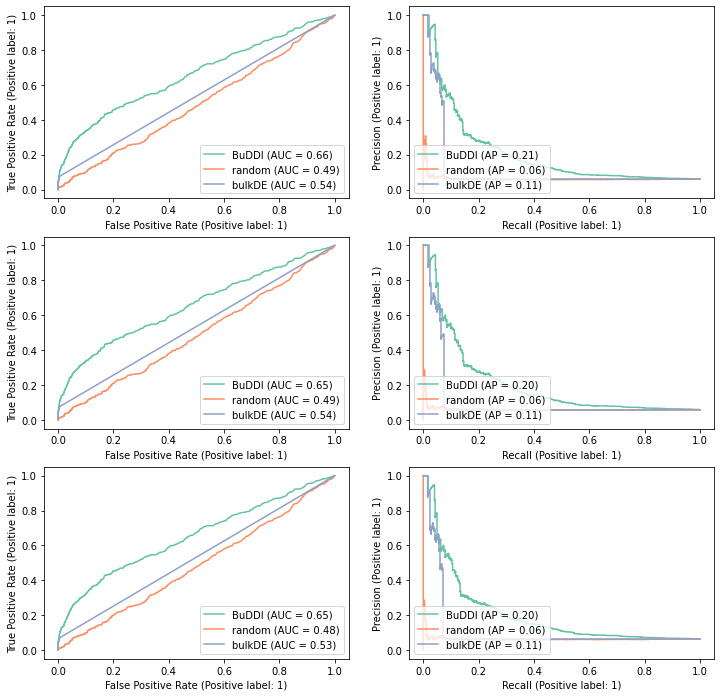

In [587]:

# get PR curve

curr_cell_type = "hepatocyte"


# get our DE genes
#all_keys = ['hepatocyte',
#            'hepatic_sinusoid',
#            'kupffer',
#            'NK','b_cell']
#all_keys = np.setdiff1d(all_keys, curr_cell_type)
#de_genes_curr = [de_genes[x] for x in all_keys]
#de_genes_curr=[element for sublist in de_genes_curr for element in sublist]
#de_genes_curr = [x.upper() for x in de_genes_curr]

# get our DE genes
de_genes_curr = de_genes[curr_cell_type]
de_genes_curr = [x.upper() for x in de_genes_curr]


# get bulk DE genes

# set the reference genes
DE_ref = Pub_DE
ct_DE_ref = Pub_DE_hepatic
extra_ref = np.union1d(de_genes_curr[:min_overlap], ct_DE_ref)



fig, axs = plt.subplots(3, 2, figsize=(12, 12))
axs, proj_log2FC_df = plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, 
                                    bulk_sig_df, curr_cell_type, DE_ref, ct_DE_ref, 
                                    extra_ref, axs, union_genes_cap)
fig.show()


In [588]:
a = proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])[::-1]]
a.iloc[:30]

,0,orig,random,bulkDE,isDE,hepaticDE,X_Y
CYP2B9,5392.0,5392.0,230.0,7.542790,1,1,1
CYP2A4,5221.0,5221.0,152.0,8.501589,1,1,1
CYP2C69,5191.0,5191.0,34.0,6.707075,1,1,1
ACOT3,5188.0,5188.0,100.0,4.247366,1,1,1
CYP2C40,4801.0,4801.0,31.0,4.960948,1,1,1
A1BG,4749.0,4749.0,88.0,8.790101,1,1,1
CYP2B13,4736.0,4736.0,20.0,6.859315,1,1,1
XIST,4371.0,4371.0,266.0,1.000000,0,0,0
HAMP2,3920.0,3920.0,38.0,3.924496,1,1,1
FMO3,3772.0,3772.0,194.0,6.413763,1,1,1


In [589]:
proj_log2FC_df.loc["ACTB"]

0              1.0
orig          -1.0
random       150.0
bulkDE         1.0
isDE           0.0
hepaticDE      0.0
X_Y            0.0
Name: ACTB, dtype: float64

In [590]:
np.intersect1d(extra_ref, union_genes)

array(['C6', 'C9', 'H2-K1', 'H2-Q1', 'H2-Q4', 'H2-T23'], dtype=object)

In [591]:
all_keys = list(de_genes.keys())
all_keys

['hepatocyte',
 'hepatic_sinusoid',
 'kupffer',
 'hepatic_stellate',
 'NK',
 'plasmacytoid_dendritic_cell',
 'b_cell',
 'myeloid_leukocyte']

<ipython-input-585-6ad58444a753>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.X_Y[np.where(np.isin(unio

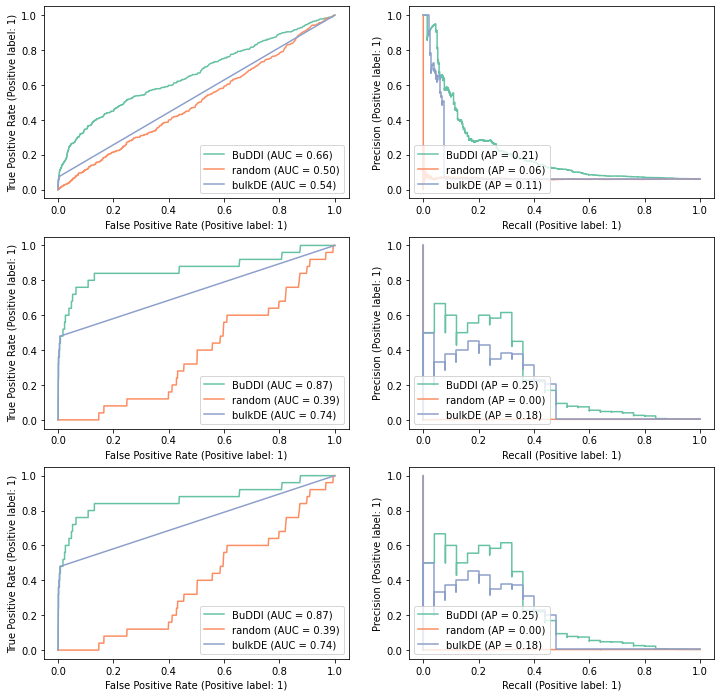

In [592]:


curr_cell_type = "hepatic_stellate"

# get our DE genes
#de_genes_curr = de_genes[curr_cell_type]
#de_genes_curr = [x.upper() for x in de_genes_curr]


hsc_only_genes = ["CCN1", "CDH12", "NC_AS_C3_2968", "NPR3", "TPM1", "ADAMTSL2", "NC_INTER_C2_33847", "OLFR39", "OLFR872", "PLXDC2"]

# set the reference genes
DE_ref = Pub_DE
ct_DE_ref = Pub_DE_hsc
extra_ref = Pub_DE_hsc


fig, axs = plt.subplots(3, 2, figsize=(12, 12))
axs, proj_log2FC_df = plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, 
                                    bulk_sig_df, curr_cell_type, DE_ref, ct_DE_ref, 
                                    extra_ref, axs, union_genes_cap)
fig.show()


In [593]:
a = proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])[::-1]]
a.iloc[:30]

,0,orig,random,bulkDE,isDE,hepaticDE,X_Y
CYP2A4,5443.0,5443.0,360.5,8.501589,1,0,0
CYP2B9,5253.5,5253.5,38.0,7.542790,1,1,1
CYP2C69,5143.5,5143.5,98.5,6.707075,1,1,1
ACOT3,5076.0,5076.0,64.5,4.247366,1,0,0
A1BG,4880.0,4880.0,162.0,8.790101,1,1,1
CYP2B13,4782.0,4782.0,284.0,6.859315,1,0,0
XIST,4729.5,4729.5,1428.5,1.000000,0,0,0
CYP2C40,4679.0,4679.0,133.5,4.960948,1,1,1
CYP2D9,4375.5,-4375.5,44.0,4.951665,1,1,1
FMO3,3909.0,3909.0,52.0,6.413763,1,1,1


<ipython-input-585-6ad58444a753>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.X_Y[np.where(np.isin(unio

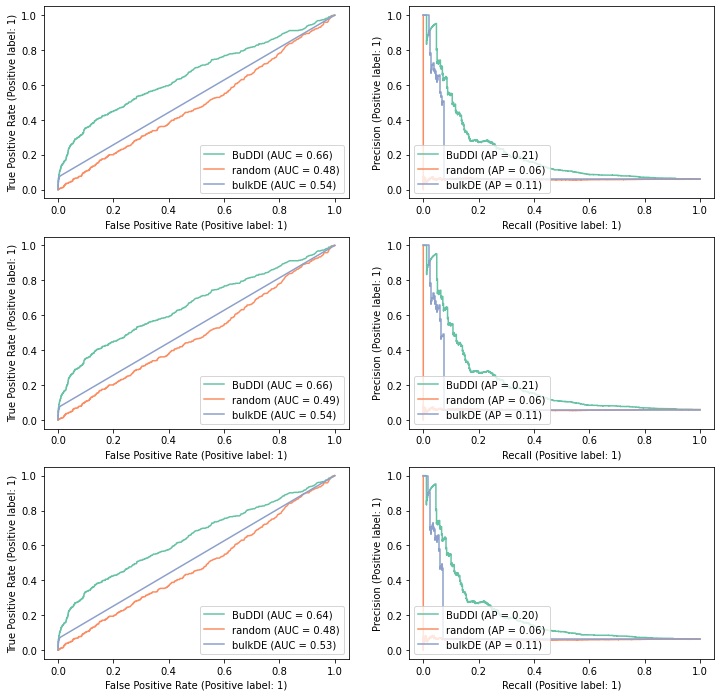

In [594]:

curr_cell_type = "hepatic_sinusoid"

# get our DE genes
de_genes_curr = de_genes[curr_cell_type]
de_genes_curr = [x.upper() for x in de_genes_curr]


# set the reference genes
DE_ref = Pub_DE
ct_DE_ref = Pub_DE_hepatic
extra_ref = np.union1d(de_genes_curr[:min_overlap], ct_DE_ref)


fig, axs = plt.subplots(3, 2, figsize=(12, 12))
axs, proj_log2FC_df = plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, 
                                    bulk_sig_df, curr_cell_type, DE_ref, ct_DE_ref, 
                                    extra_ref, axs, union_genes_cap)
fig.show()


In [595]:
a = proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])[::-1]]
a.iloc[:30]

,0,orig,random,bulkDE,isDE,hepaticDE,X_Y
CYP2A4,5425.5,5425.5,76.0,8.501589,1,1,1
CYP2B9,5183.5,5183.5,951.5,7.542790,1,1,1
CYP2C69,5143.5,5143.5,17.0,6.707075,1,1,1
ACOT3,4980.0,4980.0,123.5,4.247366,1,1,1
A1BG,4953.5,4953.5,1391.0,8.790101,1,1,1
XIST,4771.5,4771.5,508.5,1.000000,0,0,0
CYP2B13,4764.5,4764.5,591.5,6.859315,1,1,1
CYP2C40,4637.5,4637.5,41.0,4.960948,1,1,1
FMO3,3887.0,3887.0,82.5,6.413763,1,1,1
CYP2D9,3886.0,-3886.0,16.0,4.951665,1,1,1


<ipython-input-585-6ad58444a753>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.X_Y[np.where(np.isin(unio

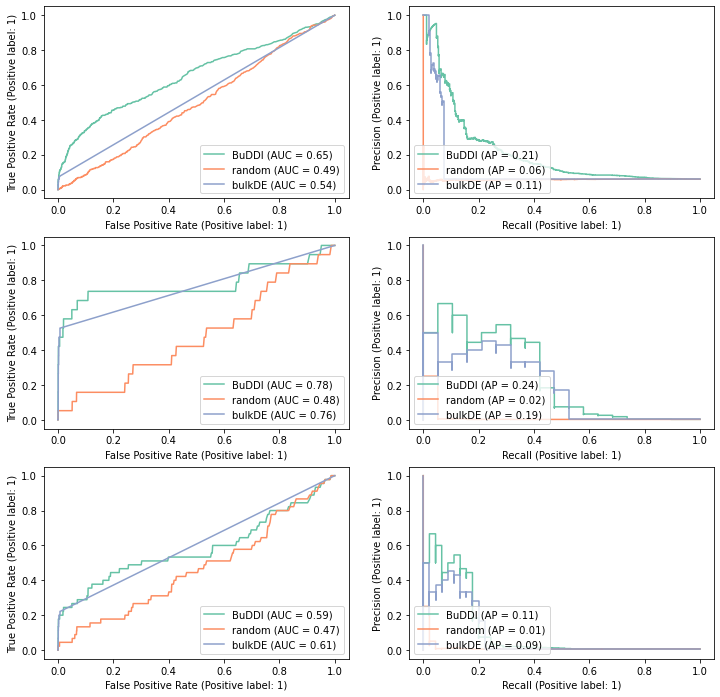

In [596]:

# get PR curve

curr_cell_type = "kupffer"

# get our DE genes
de_genes_curr = de_genes[curr_cell_type]
de_genes_curr = [x.upper() for x in de_genes_curr]

a = ["MIS18BP1", "CIT", "MYO5A"]

# set the reference genes
DE_ref = Pub_DE
ct_DE_ref = Pub_DE_kupffer
extra_ref = np.union1d(de_genes_curr[:min_overlap], ct_DE_ref)


fig, axs = plt.subplots(3, 2, figsize=(12, 12))
axs, proj_log2FC_df = plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, 
                                    bulk_sig_df, curr_cell_type, DE_ref, ct_DE_ref, 
                                    extra_ref, axs, union_genes_cap)
fig.show()


In [597]:
Pub_DE_kupffer

array(['A1BG', 'CYP2B9', 'CYP2C39', 'CYP2C69', 'CYP2D9', 'CYP3A44',
       'EGFR', 'ESRRG', 'FMO3', 'HAMP2', 'MUP12', 'MUP20', 'MUP3',
       'MYO5A', 'PRLR', 'SULT3A1', 'TOX', 'TRAF5', 'UTY'], dtype='<U18')

In [598]:
a = proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])[::-1]]
a

,0,orig,random,bulkDE,isDE,hepaticDE,X_Y
CYP2A4,5283.0,5283.0,169.0,8.501589,1,0,0
CYP2B9,5007.0,5007.0,3.0,7.542790,1,1,1
CYP2C69,5006.0,5006.0,166.0,6.707075,1,1,1
ACOT3,4797.0,4797.0,187.0,4.247366,1,0,0
A1BG,4787.0,4787.0,781.0,8.790101,1,1,1
...,...,...,...,...,...,...,...
LACTB,0.0,0.0,343.0,1.000000,0,0,0
GM5643,0.0,0.0,74.0,1.000000,0,0,0
SGSM1,0.0,0.0,146.0,1.000000,1,0,0
LPGAT1,0.0,0.0,455.0,1.000000,0,0,0


In [599]:
proj_log2FC_df.loc["MYO5A"]

0            629.0
orig         629.0
random        64.0
bulkDE         1.0
isDE           1.0
hepaticDE      1.0
X_Y            1.0
Name: MYO5A, dtype: float64

<ipython-input-585-6ad58444a753>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.X_Y[np.where(np.isin(unio

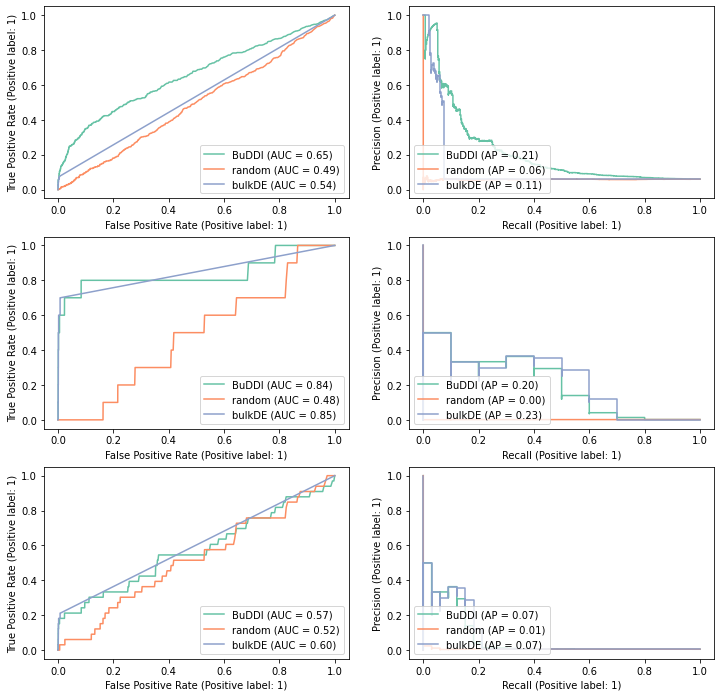

In [600]:

# get PR curve

curr_cell_type = "NK"

# get our DE genes
de_genes_curr = de_genes[curr_cell_type]
de_genes_curr = [x.upper() for x in de_genes_curr]


# set the reference genes
DE_ref = Pub_DE
ct_DE_ref = Pub_DE_immune
extra_ref = np.union1d(de_genes_curr[:min_overlap], ct_DE_ref)



fig, axs = plt.subplots(3, 2, figsize=(12, 12))
axs, proj_log2FC_df = plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, 
                                    bulk_sig_df, curr_cell_type, DE_ref, ct_DE_ref, 
                                    extra_ref, axs, union_genes_cap)
fig.show()



In [601]:
a = proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])[::-1]]
a.iloc[:15]

,0,orig,random,bulkDE,isDE,hepaticDE,X_Y
CYP2A4,5361.0,5361.0,58.0,8.501589,1,0,0
CYP2B9,5078.0,5078.0,247.0,7.542790,1,1,1
CYP2C69,4939.0,4939.0,145.0,6.707075,1,0,0
XIST,4907.0,4907.0,40.0,1.000000,0,0,0
ACOT3,4874.0,4874.0,8.0,4.247366,1,0,0
A1BG,4841.0,4841.0,170.0,8.790101,1,1,1
CYP2B13,4604.0,4604.0,159.0,6.859315,1,0,0
CYP2C40,4397.0,4397.0,515.0,4.960948,1,0,0
CYP2D9,4179.0,-4179.0,377.0,4.951665,1,1,1
MUP7,3876.0,-3876.0,15.0,7.544059,1,0,0


<ipython-input-585-6ad58444a753>:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.isDE[np.where(np.isin(union_genes_cap, DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.hepaticDE[np.where(np.isin(union_genes_cap, ct_DE_ref))[0]] = 1
<ipython-input-585-6ad58444a753>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.X_Y[np.where(np.isin(unio

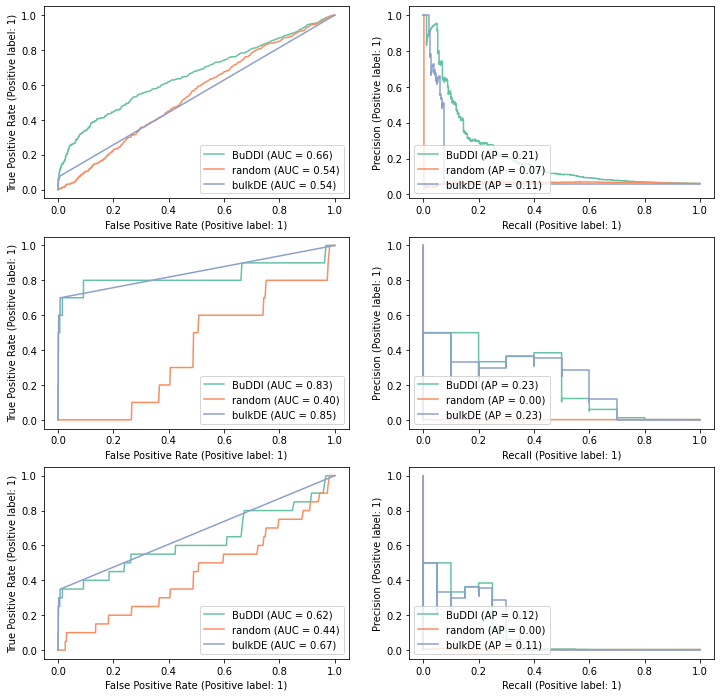

In [602]:

# get PR curve

curr_cell_type = "b_cell"

# get our DE genes
de_genes_curr = de_genes[curr_cell_type]
de_genes_curr = [x.upper() for x in de_genes_curr]


# set the reference genes
DE_ref = Pub_DE
ct_DE_ref = Pub_DE_immune
extra_ref = np.union1d(de_genes_curr[:min_overlap], ct_DE_ref)



fig, axs = plt.subplots(3, 2, figsize=(12, 12))
axs, proj_log2FC_df = plot_PR_ROC(ctrl_test_meta_df, decoded_0_0, decoded_0_1, 
                                    bulk_sig_df, curr_cell_type, DE_ref, ct_DE_ref, 
                                    extra_ref, axs, union_genes_cap)
fig.show()



In [603]:
a = proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])[::-1]]
a.iloc[:15]

,0,orig,random,bulkDE,isDE,hepaticDE,X_Y
CYP2A4,5327.0,5327.0,66.0,8.501589,1,0,0
CYP2B9,5055.0,5055.0,135.0,7.542790,1,1,1
CYP2C69,5001.0,5001.0,113.0,6.707075,1,0,0
A1BG,4883.0,4883.0,251.0,8.790101,1,1,1
ACOT3,4880.0,4880.0,108.0,4.247366,1,0,0
XIST,4712.0,4712.0,23.0,1.000000,0,0,0
CYP2B13,4650.0,4650.0,87.0,6.859315,1,0,0
CYP2C40,4393.0,4393.0,237.0,4.960948,1,0,0
CYP2D9,4296.0,-4296.0,5.0,4.951665,1,1,1
MUP7,3798.0,-3798.0,183.0,7.544059,1,0,0


In [604]:
b

NameError: name 'b' is not defined

<ipython-input-186-08fd7a4a9596>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_hepatic))[0]] = "Published hepatic DE genes"
<ipython-input-186-08fd7a4a9596>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonhepatic))[0]] = "Published nonhepatic DE genes"
<ipython-input-186-08fd7a4a9596>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

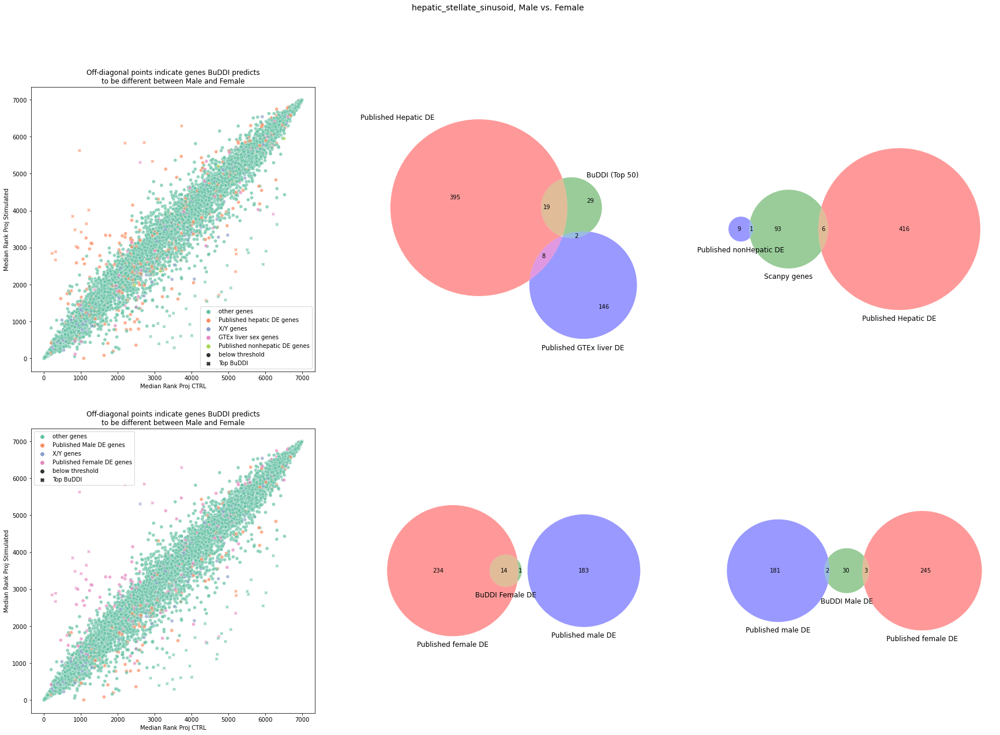

In [ ]:
from matplotlib_venn import venn3
sns.set_palette("Set2")

curr_cell_type = "hepatic_stellate_sinusoid"

top_lim = 50

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

# divide genes into up and down
top_proj_genes_up = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_up = top_proj_genes_up.iloc[np.where(top_proj_genes_up[0] > 0)[0]]
top_proj_genes_up = top_proj_genes_up.index.to_list()
top_proj_genes_down = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_down = top_proj_genes_down.iloc[np.where(top_proj_genes_down[0] <= 0)[0]]
top_proj_genes_down = top_proj_genes_down.index.to_list()

# get our DE genes
de_genes_curr = de_genes.iloc[np.where(de_genes.cell_type == curr_cell_type)[0]]
de_genes_f = de_genes_curr.iloc[np.where(de_genes_curr.sex == "female")[0]][0].to_list()
de_genes_m = de_genes_curr.iloc[np.where(de_genes_curr.sex == "male")[0]][0].to_list()
de_genes_all = de_genes_curr[0].to_list()

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_hepatic))[0]] = "Published hepatic DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonhepatic))[0]] = "Published nonhepatic DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, GTEx_DE))[0]] = "GTEx liver sex genes"

proj_log2FC_df["sex_gene"] = "other genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_female))[0]] = "Published Female DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_male))[0]] = "Published Male DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes_cap, top_proj_genes))[0]] = "Top BuDDI"

# also make a plot of only genes either BuDDI or the paper find significant
sig_pub_buddi_genes = np.union1d(top_proj_genes, Pub_DE_nonhepatic)
sig_pub_buddi_genes = np.union1d(sig_pub_buddi_genes, Pub_DE_hepatic)
sig_pub_buddi_idx = np.where(np.isin(union_genes_cap, sig_pub_buddi_genes))[0]

fig, axs = plt.subplots(2, 3, figsize=(30,20))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(Pub_DE_hepatic), set(top_proj_genes), set(GTEx_DE)], 
        set_labels = ("Published Hepatic DE", f'BuDDI (Top {top_lim})', 'Published GTEx liver DE'), ax=axs[0,1])


venn3([set(Pub_DE_hepatic), set(de_genes_all), set(Pub_DE_nonhepatic)], 
        set_labels = ("Published Hepatic DE", f'Scanpy genes', 'Published nonHepatic DE'), ax=axs[0,2])

class_color = proj_log2FC_df.sex_gene.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[1,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)

venn3([set(Pub_DE_female), set(top_proj_genes_up), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Female DE', 'Published male DE'), ax=axs[1,1])


venn3([set(Pub_DE_female), set(top_proj_genes_down), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Male DE', 'Published male DE'), ax=axs[1,2])


fig.suptitle(f"{curr_cell_type}, Male vs. Female", fontsize=14)

fig.show()

<ipython-input-152-e89f45e7bbdb>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE))[0]] = "Published DE genes"
<ipython-input-152-e89f45e7bbdb>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"
<ipython-input-152-e89f45e7bbdb>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pr

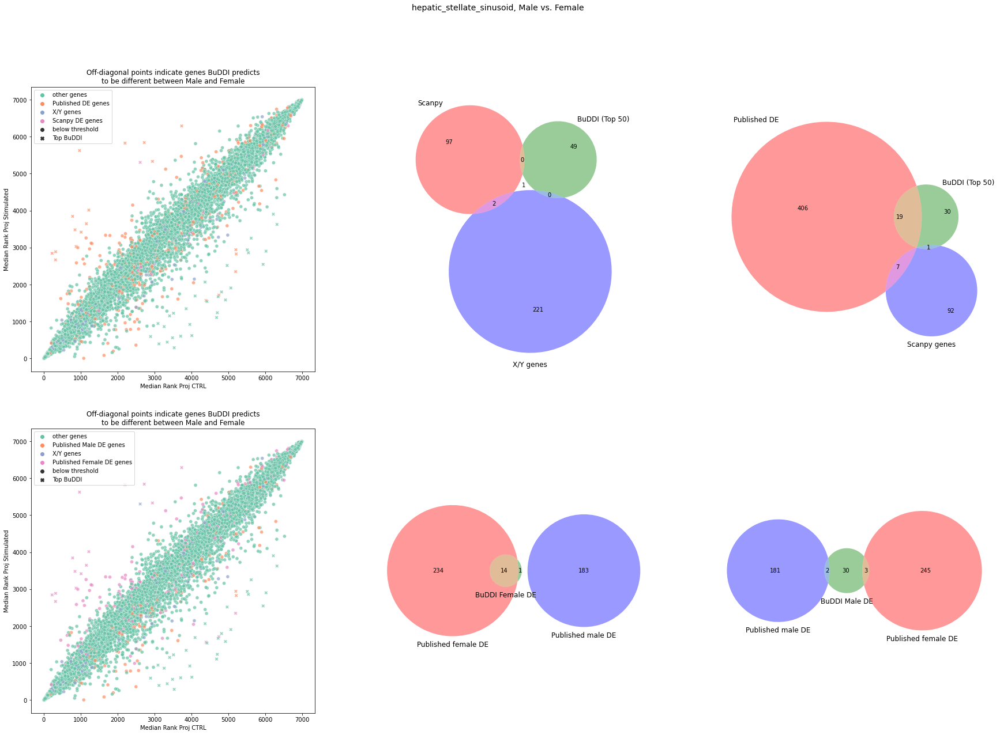

In [ ]:
from matplotlib_venn import venn3
sns.set_palette("Set2")

curr_cell_type = "hepatic_stellate_sinusoid"

top_lim = 50

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

# divide genes into up and down
top_proj_genes_up = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_up = top_proj_genes_up.iloc[np.where(top_proj_genes_up[0] > 0)[0]]
top_proj_genes_up = top_proj_genes_up.index.to_list()
top_proj_genes_down = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_down = top_proj_genes_down.iloc[np.where(top_proj_genes_down[0] <= 0)[0]]
top_proj_genes_down = top_proj_genes_down.index.to_list()

# get our DE genes
de_genes_curr = de_genes.iloc[np.where(de_genes.cell_type == curr_cell_type)[0]]
de_genes_f = de_genes_curr.iloc[np.where(de_genes_curr.sex == "female")[0]][0].to_list()
de_genes_m = de_genes_curr.iloc[np.where(de_genes_curr.sex == "male")[0]][0].to_list()
de_genes_all = de_genes_curr[0].to_list()

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE))[0]] = "Published DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, de_genes_all))[0]] = "Scanpy DE genes"

proj_log2FC_df["sex_gene"] = "other genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_female))[0]] = "Published Female DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_male))[0]] = "Published Male DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes_cap, top_proj_genes))[0]] = "Top BuDDI"

# also make a plot of only genes either BuDDI or the paper find significant
sig_pub_buddi_genes = np.union1d(top_proj_genes, Pub_DE_nonhepatic)
sig_pub_buddi_genes = np.union1d(sig_pub_buddi_genes, Pub_DE_hepatic)
sig_pub_buddi_idx = np.where(np.isin(union_genes_cap, sig_pub_buddi_genes))[0]

fig, axs = plt.subplots(2, 3, figsize=(30,20))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(de_genes_all), set(top_proj_genes), set(sex_chr_genes)], 
        set_labels = ("Scanpy", f'BuDDI (Top {top_lim})', 'X/Y genes'), ax=axs[0,1])

venn3([set(Pub_DE), set(top_proj_genes), set(de_genes_all)], 
        set_labels = ("Published DE", f'BuDDI (Top {top_lim})', 'Scanpy genes'), ax=axs[0,2])

class_color = proj_log2FC_df.sex_gene.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[1,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)

venn3([set(Pub_DE_female), set(top_proj_genes_up), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Female DE', 'Published male DE'), ax=axs[1,1])


venn3([set(Pub_DE_female), set(top_proj_genes_down), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Male DE', 'Published male DE'), ax=axs[1,2])


fig.suptitle(f"{curr_cell_type}, Male vs. Female", fontsize=14)

fig.show()

<ipython-input-151-b4c05e1725d4>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_kupffer))[0]] = "Published Kupffer DE genes"
<ipython-input-151-b4c05e1725d4>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonkupffer))[0]] = "Published nonKupffer DE genes"
<ipython-input-151-b4c05e1725d4>:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

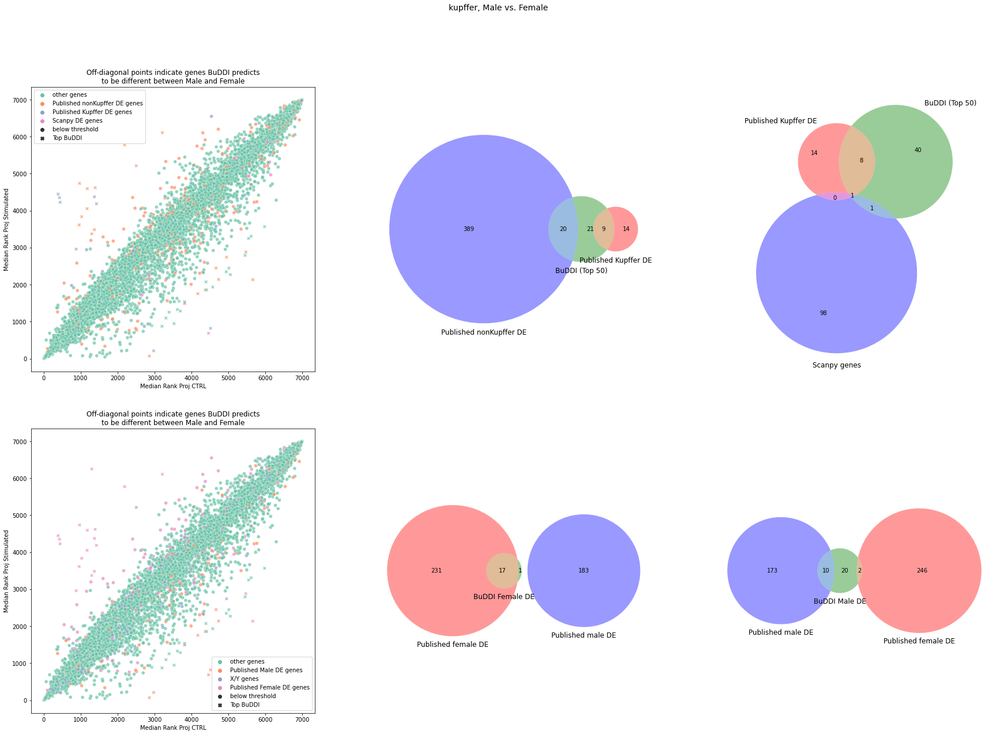

In [ ]:
from matplotlib_venn import venn3
sns.set_palette("Set2")

curr_cell_type = "kupffer"

top_lim = 50


# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

# divide genes into up and down
top_proj_genes_up = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_up = top_proj_genes_up.iloc[np.where(top_proj_genes_up[0] > 0)[0]]
top_proj_genes_up = top_proj_genes_up.index.to_list()
top_proj_genes_down = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_down = top_proj_genes_down.iloc[np.where(top_proj_genes_down[0] <= 0)[0]]
top_proj_genes_down = top_proj_genes_down.index.to_list()

# get our DE genes
de_genes_curr = de_genes.iloc[np.where(de_genes.cell_type == curr_cell_type)[0]]
de_genes_f = de_genes_curr.iloc[np.where(de_genes_curr.sex == "female")[0]][0].to_list()
de_genes_m = de_genes_curr.iloc[np.where(de_genes_curr.sex == "male")[0]][0].to_list()
de_genes_all = de_genes_curr[0].to_list()

# get non-kupffer DE
Pub_DE_nonkupffer = np.setdiff1d(Pub_DE, Pub_DE_kupffer) 

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_kupffer))[0]] = "Published Kupffer DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonkupffer))[0]] = "Published nonKupffer DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, de_genes_all))[0]] = "Scanpy DE genes"

proj_log2FC_df["sex_gene"] = "other genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_female))[0]] = "Published Female DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_male))[0]] = "Published Male DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes_cap, top_proj_genes))[0]] = "Top BuDDI"

# also make a plot of only genes either BuDDI or the paper find significant
sig_pub_buddi_genes = np.union1d(top_proj_genes, Pub_DE_nonhepatic)
sig_pub_buddi_genes = np.union1d(sig_pub_buddi_genes, Pub_DE_hepatic)
sig_pub_buddi_idx = np.where(np.isin(union_genes_cap, sig_pub_buddi_genes))[0]

fig, axs = plt.subplots(2, 3, figsize=(30,20))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(Pub_DE_kupffer), set(top_proj_genes), set(Pub_DE_nonkupffer)], 
        set_labels = ("Published Kupffer DE", f'BuDDI (Top {top_lim})', 'Published nonKupffer DE'), ax=axs[0,1])

venn3([set(Pub_DE_kupffer), set(top_proj_genes), set(de_genes_all)], 
        set_labels = ("Published Kupffer DE", f'BuDDI (Top {top_lim})', 'Scanpy genes'), ax=axs[0,2])

class_color = proj_log2FC_df.sex_gene.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[1,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)

venn3([set(Pub_DE_female), set(top_proj_genes_up), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Female DE', 'Published male DE'), ax=axs[1,1])


venn3([set(Pub_DE_female), set(top_proj_genes_down), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Male DE', 'Published male DE'), ax=axs[1,2])


fig.suptitle(f"{curr_cell_type}, Male vs. Female", fontsize=14)

fig.show()

<ipython-input-345-e32faee66ba1>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_immune))[0]] = "Published immune DE genes"
<ipython-input-345-e32faee66ba1>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonimmune))[0]] = "Published nonimmune DE genes"
<ipython-input-345-e32faee66ba1>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

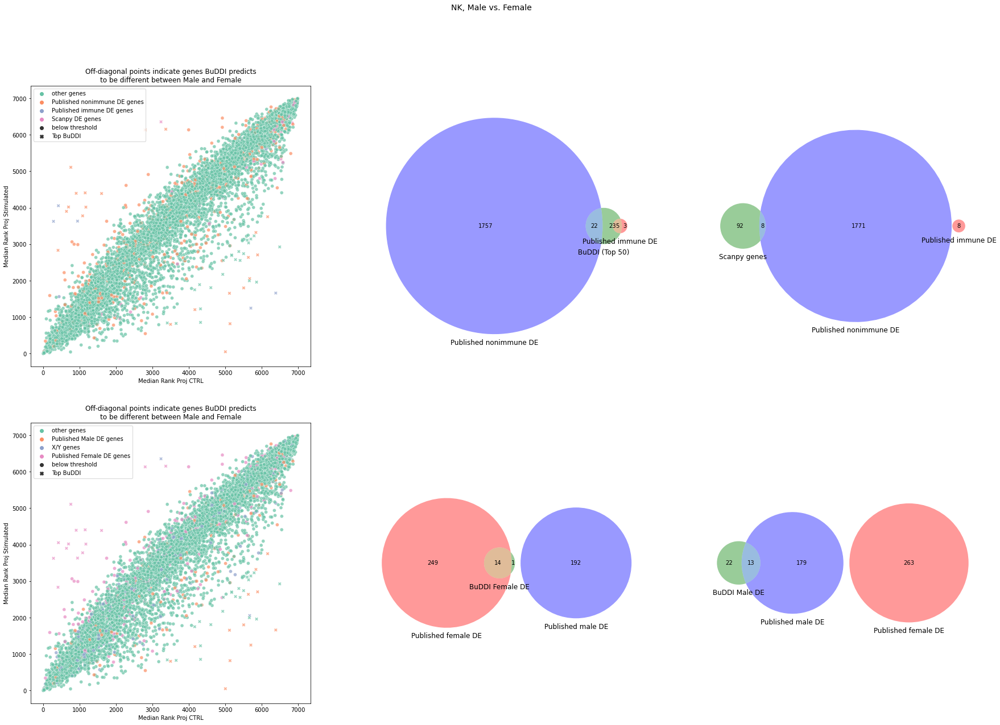

In [ ]:
from matplotlib_venn import venn3
sns.set_palette("Set2")

curr_cell_type = "NK"

top_lim = 50

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

# divide genes into up and down
top_proj_genes_up = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_up = top_proj_genes_up.iloc[np.where(top_proj_genes_up[0] > 0)[0]]
top_proj_genes_up = top_proj_genes_up.index.to_list()
top_proj_genes_down = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_down = top_proj_genes_down.iloc[np.where(top_proj_genes_down[0] <= 0)[0]]
top_proj_genes_down = top_proj_genes_down.index.to_list()

# get our DE genes
de_genes_curr = de_genes.iloc[np.where(de_genes.cell_type == curr_cell_type)[0]]
de_genes_f = de_genes_curr.iloc[np.where(de_genes_curr.sex == "female")[0]][0].to_list()
de_genes_m = de_genes_curr.iloc[np.where(de_genes_curr.sex == "male")[0]][0].to_list()
de_genes_all = de_genes_curr[0].to_list()

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_immune))[0]] = "Published immune DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonimmune))[0]] = "Published nonimmune DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, de_genes_all))[0]] = "Scanpy DE genes"

proj_log2FC_df["sex_gene"] = "other genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_female))[0]] = "Published Female DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_male))[0]] = "Published Male DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes_cap, top_proj_genes))[0]] = "Top BuDDI"

# also make a plot of only genes either BuDDI or the paper find significant
sig_pub_buddi_genes = np.union1d(top_proj_genes, Pub_DE_nonhepatic)
sig_pub_buddi_genes = np.union1d(sig_pub_buddi_genes, Pub_hepatic)
sig_pub_buddi_idx = np.where(np.isin(union_genes_cap, sig_pub_buddi_genes))[0]

fig, axs = plt.subplots(2, 3, figsize=(30,20))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(Pub_DE_immune), set(top_proj_genes), set(Pub_DE_nonimmune)], 
        set_labels = ("Published immune DE", f'BuDDI (Top {top_lim})', 'Published nonimmune DE'), ax=axs[0,1])


venn3([set(Pub_DE_immune), set(de_genes_all), set(Pub_DE_nonimmune)], 
        set_labels = ("Published immune DE", f'Scanpy genes', 'Published nonimmune DE'), ax=axs[0,2])

class_color = proj_log2FC_df.sex_gene.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[1,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)

venn3([set(Pub_DE_female), set(top_proj_genes_up), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Female DE', 'Published male DE'), ax=axs[1,1])


venn3([set(Pub_DE_female), set(top_proj_genes_down), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Male DE', 'Published male DE'), ax=axs[1,2])


fig.suptitle(f"{curr_cell_type}, Male vs. Female", fontsize=14)

fig.show()

<ipython-input-155-f85bc5937882>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_immune))[0]] = "Published immune DE genes"
<ipython-input-155-f85bc5937882>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonimmune))[0]] = "Published nonimmune DE genes"
<ipython-input-155-f85bc5937882>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

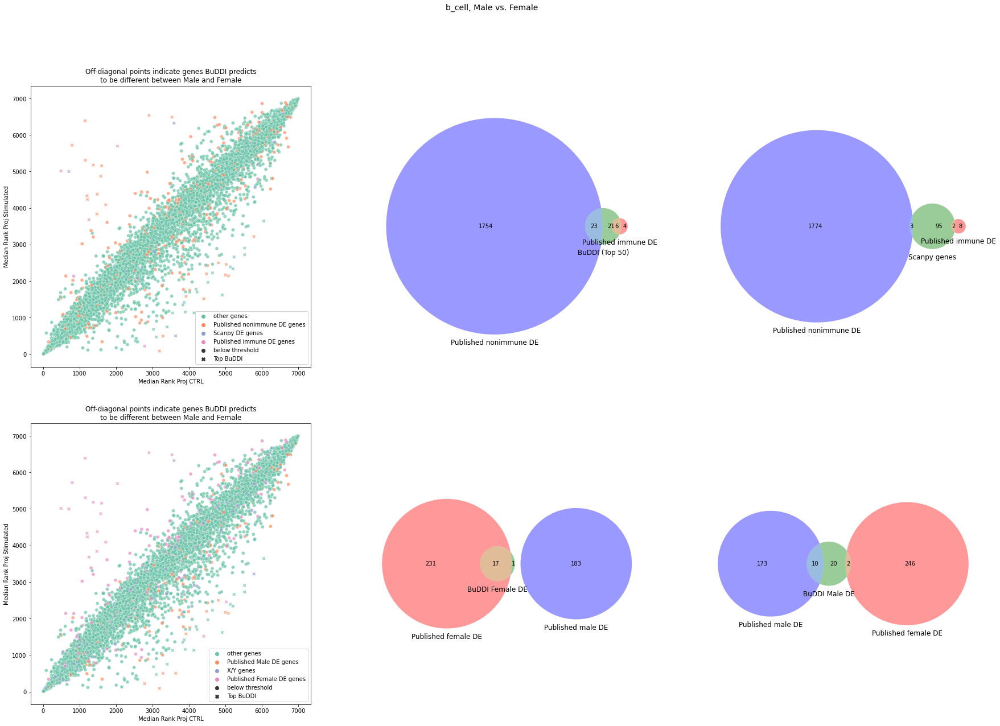

In [ ]:
from matplotlib_venn import venn3
sns.set_palette("Set2")

curr_cell_type = "b_cell"

top_lim = 50

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

# divide genes into up and down
top_proj_genes_up = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_up = top_proj_genes_up.iloc[np.where(top_proj_genes_up[0] > 0)[0]]
top_proj_genes_up = top_proj_genes_up.index.to_list()
top_proj_genes_down = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_down = top_proj_genes_down.iloc[np.where(top_proj_genes_down[0] <= 0)[0]]
top_proj_genes_down = top_proj_genes_down.index.to_list()

# get our DE genes
de_genes_curr = de_genes.iloc[np.where(de_genes.cell_type == curr_cell_type)[0]]
de_genes_f = de_genes_curr.iloc[np.where(de_genes_curr.sex == "female")[0]][0].to_list()
de_genes_m = de_genes_curr.iloc[np.where(de_genes_curr.sex == "male")[0]][0].to_list()
de_genes_all = de_genes_curr[0].to_list()

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_immune))[0]] = "Published immune DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE_nonimmune))[0]] = "Published nonimmune DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, de_genes_all))[0]] = "Scanpy DE genes"

proj_log2FC_df["sex_gene"] = "other genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_female))[0]] = "Published Female DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_male))[0]] = "Published Male DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes_cap, top_proj_genes))[0]] = "Top BuDDI"

# also make a plot of only genes either BuDDI or the paper find significant
sig_pub_buddi_genes = np.union1d(top_proj_genes, Pub_DE_nonhepatic)
sig_pub_buddi_genes = np.union1d(sig_pub_buddi_genes, Pub_DE_hepatic)
sig_pub_buddi_idx = np.where(np.isin(union_genes_cap, sig_pub_buddi_genes))[0]

fig, axs = plt.subplots(2, 3, figsize=(30,20))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(Pub_DE_immune), set(top_proj_genes), set(Pub_DE_nonimmune)], 
        set_labels = ("Published immune DE", f'BuDDI (Top {top_lim})', 'Published nonimmune DE'), ax=axs[0,1])


venn3([set(Pub_DE_immune), set(de_genes_all), set(Pub_DE_nonimmune)], 
        set_labels = ("Published immune DE", f'Scanpy genes', 'Published nonimmune DE'), ax=axs[0,2])

class_color = proj_log2FC_df.sex_gene.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[1,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)

venn3([set(Pub_DE_female), set(top_proj_genes_up), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Female DE', 'Published male DE'), ax=axs[1,1])


venn3([set(Pub_DE_female), set(top_proj_genes_down), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Male DE', 'Published male DE'), ax=axs[1,2])


fig.suptitle(f"{curr_cell_type}, Male vs. Female", fontsize=14)

fig.show()

In [ ]:
curr_cell_type = "myeloid_leukocyte"

top_lim = 50

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
proj_log2FC_df.iloc[np.argsort(proj_log2FC_df[0])].index.to_list()

['RYR1',
 'TCAP',
 'MYLPF',
 'TMEM38A',
 'MYOZ1',
 'ANKRD23',
 'SLC16A3',
 'PGAM2',
 'CASQ1',
 'ACTN2',
 'CMYA5',
 'AMPD1',
 'HSPB7',
 'TNNI2',
 'OBSCN',
 'NRAP',
 'CACNA1S',
 'MYOM1',
 'ENO3',
 'ASB2',
 'TNNT3',
 'PYGM',
 'CAP2',
 'COX6A2',
 'RPL3L',
 'TXLNB',
 'SRL',
 'SHISA4',
 'CKM',
 'RTN2',
 'PPP1R3A',
 'HSPB6',
 'PHKG1',
 'CIDEC',
 'UNC45B',
 'ATP2A1',
 'CAMK2A',
 'LTF',
 'LMCD1',
 'SH3BGR',
 'CACNB1',
 'FITM1',
 'PKIA',
 'PADI2',
 'KCNC1',
 'MLF1',
 'NGP',
 'FNDC5',
 'REEP1',
 'SMTNL2',
 'GSTP1',
 'MUP20',
 'CTSE',
 'PLAC8',
 'ACTA1',
 'CYP4A12A',
 'SPEG',
 'ERMAP',
 'NUDT7',
 'SPIB',
 'JPH1',
 'ELOVL3',
 'GPC1',
 'COX7A1',
 'ATP1A3',
 'CD177',
 'RPS6KA2',
 'LY6C2',
 'MUP21',
 'SRPK3',
 'DDIT4L',
 'CAMP',
 'PARVG',
 'AK1',
 'SLCO1A1',
 'CORO2A',
 'PHKA1',
 'MICAL1',
 'NR4A1',
 'DTX1',
 'DOK3',
 'TPM2',
 'SCN1B',
 'DUSP26',
 'LTB',
 'CPE',
 'TTC39C',
 'HFE2',
 'VCAM1',
 'TMCC2',
 'PAK1',
 'CSF3R',
 'SIGLECG',
 'S100A9',
 'FSD2',
 'SLC38A1',
 'FBXO32',
 'EXTL1',
 'F630028O10RIK',

<ipython-input-156-e0af58394e37>:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE))[0]] = "Published DE genes"
<ipython-input-156-e0af58394e37>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"
<ipython-input-156-e0af58394e37>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pr

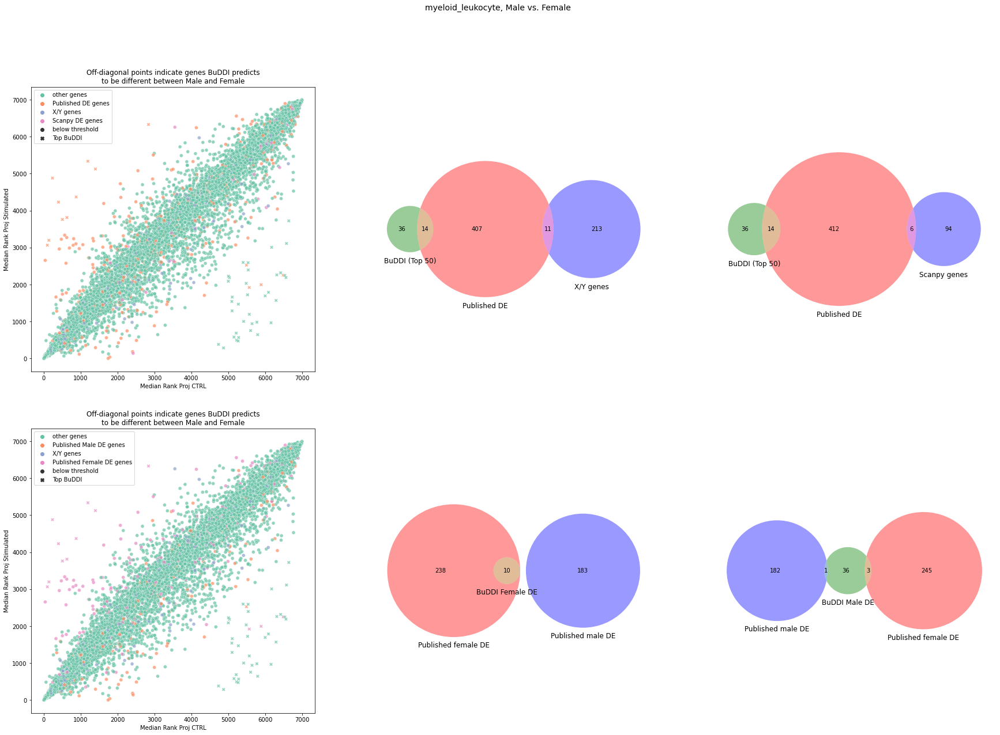

In [ ]:
from matplotlib_venn import venn3
sns.color_palette("Set2")

curr_cell_type = "myeloid_leukocyte"

top_lim = 50

# this is for the "projected" expression
curr_idx = np.where(ctrl_test_meta_df.Y_max == curr_cell_type)[0]
proj_ctrl = decoded_0_0[curr_idx]
proj_stim = decoded_0_1[curr_idx]

# take the median for nomalization
proj_ctrl = np.median(rankdata(proj_ctrl, axis=1), axis=0)
proj_stim = np.median(rankdata(proj_stim, axis=1), axis=0)
proj_log2FC = proj_stim-proj_ctrl

# denote ISG genes
proj_log2FC_df = pd.DataFrame(proj_log2FC, index=union_genes_cap)
top_proj_genes = proj_log2FC_df.index[np.argsort(np.abs(proj_log2FC_df[0]))].tolist()[::-1][0:top_lim]

# divide genes into up and down
top_proj_genes_up = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_up = top_proj_genes_up.iloc[np.where(top_proj_genes_up[0] > 0)[0]]
top_proj_genes_up = top_proj_genes_up.index.to_list()
top_proj_genes_down = proj_log2FC_df.loc[top_proj_genes]
top_proj_genes_down = top_proj_genes_down.iloc[np.where(top_proj_genes_down[0] <= 0)[0]]
top_proj_genes_down = top_proj_genes_down.index.to_list()

# get our DE genes
de_genes_curr = de_genes.iloc[np.where(de_genes.cell_type == curr_cell_type)[0]]
de_genes_f = de_genes_curr.iloc[np.where(de_genes_curr.sex == "female")[0]][0].to_list()
de_genes_m = de_genes_curr.iloc[np.where(de_genes_curr.sex == "male")[0]][0].to_list()
de_genes_all = de_genes_curr[0].to_list()

proj_log2FC_df["gene_type"] = "other genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, Pub_DE))[0]] = "Published DE genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"
proj_log2FC_df.gene_type[np.where(np.isin(union_genes_cap, de_genes_all))[0]] = "Scanpy DE genes"

proj_log2FC_df["sex_gene"] = "other genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_female))[0]] = "Published Female DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, Pub_DE_male))[0]] = "Published Male DE genes"
proj_log2FC_df.sex_gene[np.where(np.isin(union_genes_cap, sex_chr_genes))[0]] = "X/Y genes"

proj_log2FC_df["top_buddi"] = "below threshold"
proj_log2FC_df.top_buddi[np.where(np.isin(union_genes_cap, top_proj_genes))[0]] = "Top BuDDI"

# also make a plot of only genes either BuDDI or the paper find significant
sig_pub_buddi_genes = np.union1d(top_proj_genes, Pub_DE_nonhepatic)
sig_pub_buddi_genes = np.union1d(sig_pub_buddi_genes, Pub_DE_hepatic)
sig_pub_buddi_idx = np.where(np.isin(union_genes_cap, sig_pub_buddi_genes))[0]

fig, axs = plt.subplots(2, 3, figsize=(30,20))


class_color = proj_log2FC_df.gene_type.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[0,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)


venn3([set(Pub_DE), set(top_proj_genes), set(sex_chr_genes)], 
        set_labels = ("Published DE", f'BuDDI (Top {top_lim})', 'X/Y genes'), ax=axs[0,1])

venn3([set(Pub_DE), set(top_proj_genes), set(de_genes_all)], 
        set_labels = ("Published DE", f'BuDDI (Top {top_lim})', 'Scanpy genes'), ax=axs[0,2])

class_color = proj_log2FC_df.sex_gene.to_list()
plot_effect_size_corr(proj_ctrl, proj_stim, axs[1,0], 
                    title=f"Off-diagonal points indicate genes BuDDI predicts\nto be different between Male and Female", 
                    xlab="Median Rank Proj CTRL", ylab="Median Rank Proj Stimulated", 
                    class_id=class_color,
                    style_id=proj_log2FC_df.top_buddi.to_list(),
                    alpha=0.7)

venn3([set(Pub_DE_female), set(top_proj_genes_up), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Female DE', 'Published male DE'), ax=axs[1,1])


venn3([set(Pub_DE_female), set(top_proj_genes_down), set(Pub_DE_male)], 
        set_labels = ("Published female DE", f'BuDDI Male DE', 'Published male DE'), ax=axs[1,2])


fig.suptitle(f"{curr_cell_type}, Male vs. Female", fontsize=14)

fig.show()